# CHAOS - Combined (CT-MR) Healthy Abdominal Organ Segmentation Challenge Data

This dataset contains both computed tomography (CT) and magnetic resonance imaging (MRI) scans of healthy abdominal organs. The primary objective of the CHAOS Challenge is to advance the field of medical image segmentation by encouraging the development and evaluation of algorithms for accurately segmenting abdominal organs, including the liver, spleen, and kidneys.

- Website: https://chaos.grand-challenge.org/

- Dataset: https://zenodo.org/records/3431873#.ZSKsluxBy3I

- Paper: https://www.sciencedirect.com/science/article/pii/S1361841520303145?via%3Dihub

**Citation:**
>Kavur, A. E., Selver, M. A., Dicle, O., Barış, M., & Gezer, N. S. (2019, April).
>
> *CHAOS - Combined (CT-MR) Healthy Abdominal Organ Segmentation Challenge Data* (Version v1.03) [Data set]
>
> Zenodo. https://doi.org/10.5281/zenodo.3362844

**GOALS :**

- Conduct comprehensive exploratory data analysis (EDA) to gain insights into the structure, content, and characteristics of the dataset.

- Apply various computer vision techniques and algorithms to pre-process the CT and MR images within the dataset. (resampling, denoising, histogram equalization, sharpening, thresholding)

- Build and evaluate various Deep Learning models for liver segmentation on CT images.

- Build and evaluate various Deep Learning models for liver, kidneys, and spleen segmentation on MR images.

### Connect to Drive
**(optional for Google Colab users)**

In [1]:
from google.colab import drive
drive.mount('/content/drive/')

%cd /content/drive/My Drive/Biomedical CV/

Mounted at /content/drive/
/content/drive/My Drive/Biomedical CV


### Import Libraries

In [2]:
# Fix randomness and hide warnings
seed = 42

import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
os.environ['PYTHONHASHSEED'] = str(seed)
os.environ['MPLCONFIGDIR'] = os.getcwd()+'/configs/'

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=Warning)

import numpy as np
np.random.seed(seed)

import logging

import random
random.seed(seed)

In [3]:
# Import tensorflow
import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl
from tensorflow.keras.utils import plot_model
tf.autograph.set_verbosity(0)
tf.get_logger().setLevel(logging.ERROR)
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)
tf.random.set_seed(seed)
tf.compat.v1.set_random_seed(seed)
#tfk.mixed_precision.set_global_policy('mixed_float16') # Half-precision
print(tf.__version__)

2.15.0


In [4]:
!pip -q install pydicom
!pip -q install SimpleITK

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.7/52.7 MB 11.0 MB/s eta 0:00:00


In [5]:
# Import other libraries
import pydicom
import cv2

import skimage.transform
from skimage import morphology, filters
from skimage import exposure

from scipy.ndimage import zoom
import SimpleITK as sitk

from sklearn.model_selection import train_test_split

import pickle
import matplotlib.pyplot as plt
plt.rc('font', size=16)

### Load raw train CHAOS Challenge dataset

Fast load using the .npy files generated in the notebook "Load_Stats_CHAOS_dataset.ipynb"

In [6]:
# path of the .npy files
raw_path = os.path.join(os.getcwd(), 'CHAOS_RAW')
modeling_path = os.path.join(os.getcwd(), 'CHAOS_MODELS')

In [7]:
def load_raw_dataset(metadata):
  '''
  Loads raw data and labels into a dictionary from .npy files
  '''
  raw_dict = {}
  for procedure_name in list(metadata.keys()):
    patients = metadata[procedure_name]
    if procedure_name not in list(raw_dict.keys()):
      raw_dict[procedure_name] = {}
    for id in list(patients.keys()):
      raw_dict[procedure_name][id] = np.load(os.path.join(raw_path, procedure_name, f'{procedure_name}_patient{id}.npy'))
  return raw_dict

In [8]:
# Retrieve metadata of interest of the CHAOS dataset
with open(os.path.join(raw_path, 'metadata.pkl'), 'rb') as f:
    dict_metadata = pickle.load(f)

# Retrieve raw data and labels dictionary of the CHAOS dataset
raw_dataset = load_raw_dataset(dict_metadata)

'''raw_dataset is a Python disctionary on the form:
    { procedure : patient : [[images], [labels]]
'''

'raw_dataset is a Python disctionary on the form:\n    { procedure : patient : [[images], [labels]]\n'

### Pre-processing

Crucial step to improve the quality of training for deep learning algorithms by preparing the input data through different operations, such as denoising, interpolation, and normalization (Masoudi et al., 2021).



#### Pre-processing functions

In [7]:
def select_display_rand_sample_img(images, labels):
  '''
  params: set of images and labels
  Displays 12 random images and labels
  '''
  rows = 4
  columns= 6 # even

  fig, axes = plt.subplots(rows, columns, figsize=(16, 8))
  fig.subplots_adjust(hspace=0.1, wspace=0.2)

  # Select random images and labels
  random_inx = np.random.choice(images.shape[0], rows*int(columns/2))
  random_images = images[random_inx]
  random_labels = labels[random_inx]

  # Plot random images and labels
  for i in range(rows):
    for j in range(0, columns, 2):
      index = int(j/2)+i*int(columns/2)
      image = random_images[index]
      label = random_labels[index]

      axes[i, j].imshow(image, cmap='gray')
      axes[i, j].get_xaxis().set_visible(False)
      axes[i, j].get_yaxis().set_visible(False)

      axes[i, j+1].imshow(label, cmap='gray')
      axes[i, j+1].get_xaxis().set_visible(False)
      axes[i, j+1].get_yaxis().set_visible(False)
  plt.show()

In [8]:
def plot_image_processing_results(images, titles):
  '''
  params: images and labels to plot
  Displays the images and their titles in a grip
  '''
  #assert len(images) == 6 and len(titles) == 6, "Must plot exactly 6 images and titles"
  plt.figure(figsize=(20, 10))

  for i in range(len(images)):
    plt.subplot(2, 3, i+1)
    plt.imshow(images[i], cmap='gray')
    plt.axis('off')
    plt.title(titles[i])

  plt.show()

In [9]:
def crop(volume, target_shape):
  '''
  Crop a 3D volume to a specified target shape.
  params: input 3D volume to be cropped
  returns: desired shape for the cropped volume
  '''
  crop_x = int((volume.shape[1]-target_shape[0])/2)
  crop_y = int((volume.shape[2]-target_shape[1])/2)
  if crop_x == 0 or crop_y == 0:
    return volume

  return volume[:, crop_x:-1*crop_x, crop_y:-1*crop_y]

In [10]:
def get_procedure_images_labels(raw_dataset, procedure, target_size):
  '''
  Returns images and labels concatenated for all patients of a given procedure
  '''
  images = None
  labels = None
  for patient in raw_dataset[procedure].values():
    cropped_image_vol = crop(patient[0], target_size) # Just for visualization purposes
    if images is None:
      images = cropped_image_vol
    else:
      images = np.concatenate((images, cropped_image_vol), axis=0)

    cropped_ground_vol = crop(patient[1], target_size)
    if labels is None:
      labels = cropped_ground_vol
    else:
      labels = np.concatenate((labels, cropped_ground_vol), axis=0)
  return images, labels

#### CT images pre-processing

- CT scans are acquired by measuring x-ray attenuation through a rotating energy source that produces cross-sectional images.

- CT imaging provides anatomical information due to differences in tissue composition (i.e., density).

** not preferred in some clinical settings due to ionizing radiation and its limited soft-tissue contrast

(Masoudi et al., 2021)

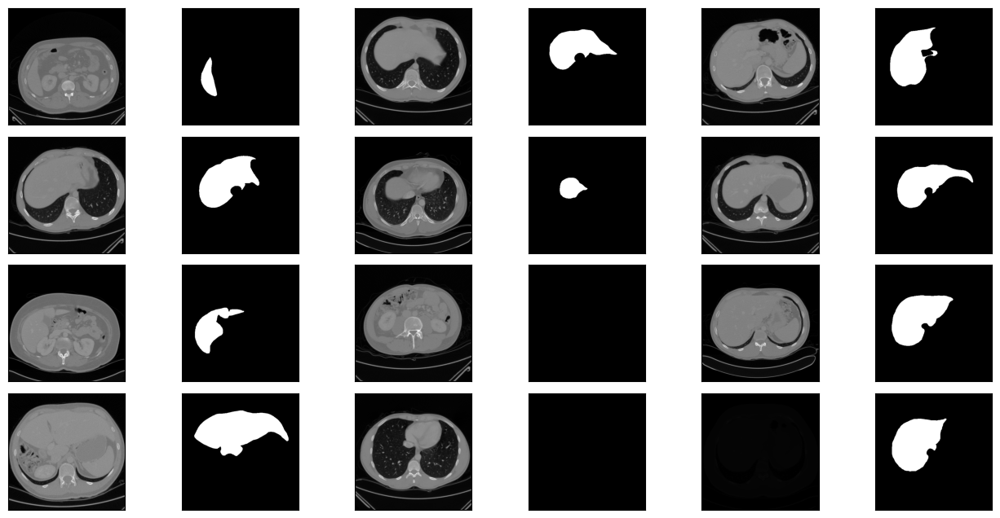

In [ ]:
# Display random CT images and their labels from the original dataset
ct_images, ct_labels = get_procedure_images_labels(raw_dataset, 'CT' , [512, 512])
select_display_rand_sample_img(ct_images, ct_labels)

In [ ]:
# Work with a random image and label from CT dataset
rand_idx = random.randrange(len(ct_images))
ct_image = ct_images[rand_idx]
ct_label = ct_labels[rand_idx]

##### **RESAMPLING/INTERPOLATION**

As it is usually the case for object detection and segmentation, there is a preference to have equal physical spacing for the input images. Maintaining the same resolution is desired to avoid center-specific or reconstruction-dependent findings.

(Masoudi et al., 2021)


**Full data of voxel not available**

Given that the segmentation algorithms will operate on 2D CT images as input, the inherent 3D voxel spatial characteristics are disregarded.

Additionally, all training images conform to a fixed resolution of 512x512.

Consequently, the process of resampling, which would entail adjusting the spatial dimensions of the images, holds negligible impact on the trained models and it is not done in this case.


##### **DENOISING**

CT images may have several source of disturbance, which mainly include beam hardening, patient movements, scanner malfunction, low resolution, intrinsic low dose radiation, and metal implants.

(Masoudi et al., 2021)

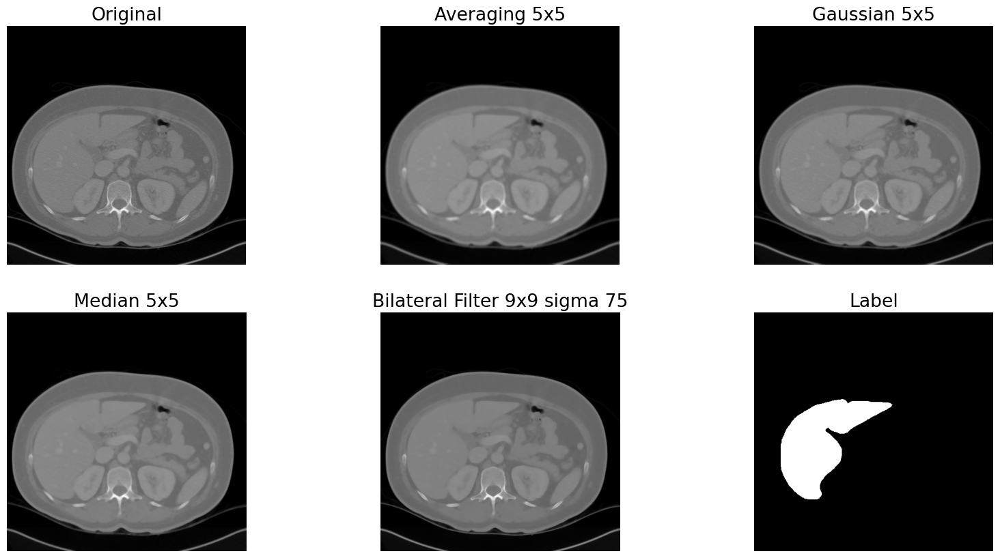

In [ ]:
ct_denoising = [ct_image, cv2.blur(ct_image, (5, 5)), cv2.GaussianBlur(ct_image, (5, 5), 0),
                cv2.medianBlur(ct_image, 5), cv2.bilateralFilter(np.float32(ct_image), 9, 75, 75), ct_label]
ct_denoising_titles = ['Original', 'Averaging 5x5', 'Gaussian 5x5', 'Median 5x5', 'Bilateral Filter 9x9 sigma 75', 'Label']
plot_image_processing_results(ct_denoising, ct_denoising_titles)

- Averaging : blurs too much the edges X
- Gaussian : good alternative but edges not that sharp X
- Median : not dealing with salt-pepper noise X
- **Bilaterial** : Gaussian smoothing + sharp edges √

##### **SHARPENING**

Can help improve the visibility of liver boundaries and structures.

(Masoudi et al., 2021)

In [ ]:
def unsharp_mask(image, kernel_size=(5, 5), sigma=0.0, amount=1.5):
  '''
  Apply unsharp mask to enhance the sharpness of the image
  params:
    - image (ndarray): The input image as a NumPy array.
    - kernel_size (tuple): The size of the Gaussian kernel for blurring. Default is (5, 5).
    - sigma (float): The standard deviation of the Gaussian kernel. Default is 0.0.
    - amount (float): The strength of the sharpening effect. Default is 1.5.
  '''
  image_f32 = np.float32(image)
  # Apply Gaussian blur to the image
  blurred = cv2.GaussianBlur(image_f32, kernel_size, sigma)

  # Calculate the unsharp mask
  mask = cv2.subtract(image_f32, blurred)
  sharpened = cv2.addWeighted(image_f32, 1 + amount, mask, -amount, 0)
  sharpened = np.clip(sharpened, 0, 65535).astype(np.uint16)
  return sharpened

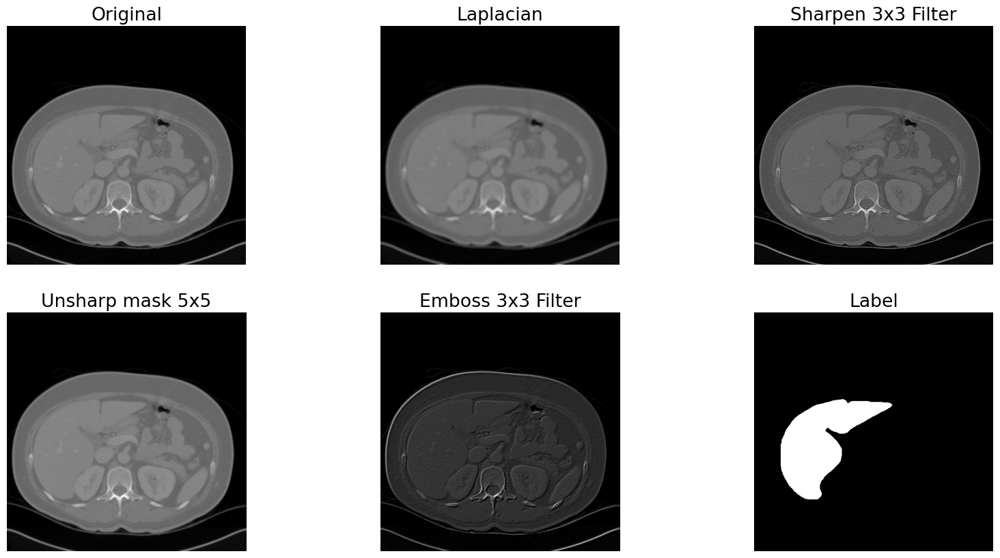

In [ ]:
sharpen_filter = np.array([[0,-1,0], [-1,5,-1], [0,-1,0]])
emboss_filter = np.array([[-2,-1,0], [-1,1,1], [0,1,2]])

ct_sharpening = [ct_image, np.clip(cv2.add(np.float32(ct_image), cv2.Laplacian(ct_image, cv2.CV_32F)), 0, 65535).astype(np.uint16),
                  cv2.filter2D(ct_image, -1, sharpen_filter), unsharp_mask(ct_image, (5, 5)), cv2.filter2D(ct_image, -1, emboss_filter), ct_label]
ct_sharpening_titles = ['Original', 'Laplacian', 'Sharpen 3x3 Filter', 'Unsharp mask 5x5', 'Emboss 3x3 Filter', 'Label']
plot_image_processing_results(ct_sharpening, ct_sharpening_titles)

- Laplacing : blurs too much X
- **Sharpen filter** : good sharpening but darkens subject √
- Unsharp mask : similar to bilateral filter but with more details X
- Emboss : great sharpening but uniform color X

##### **NORMALIZATION**

Stretch or squeeze the CT data intensity values so that they efficiently fit into the provided range of input 8bit images monotonically by using a linear transformation, enforcing two critical points (smallest and largest values) to be mapped to (0, 255) respectively.

- Data normalization may be performed using the image statistics at the slice-level

(Masoudi et al., 2021)

In [ ]:
ct_image_normalized = cv2.normalize(ct_image, None, alpha = 0, beta = 255, norm_type = cv2.NORM_MINMAX, dtype = cv2.CV_8UC1)
print(np.min(ct_image_normalized), np.max(ct_image_normalized))

0 255


##### **BACKGROUND CLEANING**

In [ ]:
def remove_small_objects(ct_image, min_size):
  '''
  Remove small objects (e.g. CT bed) from a CT image using OTSU thresholding and morphological operations
  params: input image
  '''
  tgray = ct_image > filters.threshold_otsu(ct_image)
  mask = morphology.remove_small_objects(tgray, min_size=min_size)
  mask = morphology.remove_small_holes(mask)
  return mask * ct_image

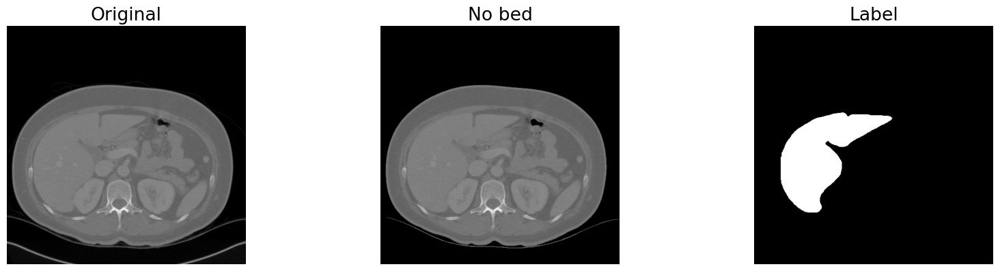

In [ ]:
ct_cleaning = [ct_image, remove_small_objects(ct_image, 3000), ct_label]
ct_cleaning_titles = ['Original', 'No bed', 'Label']
plot_image_processing_results(ct_cleaning, ct_cleaning_titles)

##### **HISTOGRAM EQUALIZATION**

Enhance the contrast of an image by redistributing the intensity values across the entire range. Useful for edge detection, segmentation, and object recognition.

(Sadia et al., 2024)

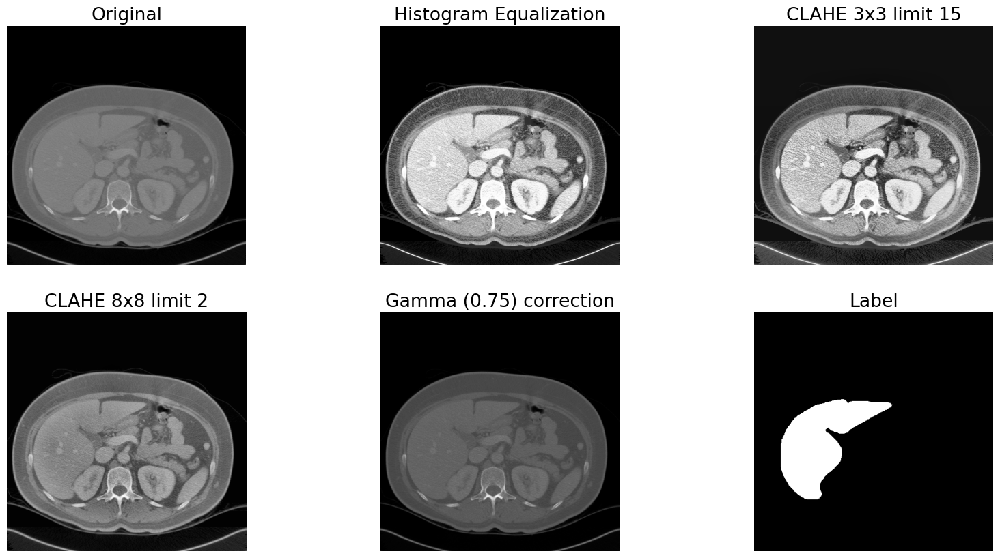

In [ ]:
clahe_img = cv2.createCLAHE (clipLimit = 15.0, tileGridSize = (3, 3))
clahe2_img = cv2.createCLAHE (clipLimit = 2.0, tileGridSize = (8, 8))

gamma = 0.75
invGamma = 1.0 / gamma
table = np.array([((i / 255.0) ** invGamma) * 255 for i in np.arange(0, 256)]).astype("uint8")

ct_he = [ct_image_normalized, cv2.equalizeHist(ct_image_normalized), clahe_img.apply(ct_image_normalized),
         clahe2_img.apply(ct_image_normalized), cv2.LUT(ct_image_normalized, table), ct_label]
ct_he_titles = ['Original', 'Histogram Equalization', 'CLAHE 3x3 limit 15', 'CLAHE 8x8 limit 2', 'Gamma (0.75) correction', 'Label']
plot_image_processing_results(ct_he, ct_he_titles)

- **Histogram equalization** : organs have good constrast √
- CLAHE 3x3 limit 15 : organs have good constrast but noise sharpened X
- CLAHE 8x8 limit 2 : organs have good contrast √
- Gamma correction : darkens/lightens but no major segmentation of organs X

##### **COMPLETE PRE-PROCESSING + THRESHOLDING**

In [ ]:
def ct_image_preprocessing(ct_image):
  """
  Apply preprocessing steps to enhance a CT image for segmentation or analysis tasks.
  params:
  - ct_image (ndarray): The input CT image as a NumPy array.
  return:
  - ndarray: The preprocessed CT image as a NumPy array.

  This function performs several preprocessing steps on the input CT image to improve its quality and suitability for segmentation:
  1. Bilateral Filtering: Apply bilateral filtering to denoise the image.
  2. Normalization: Normalize the denoised image to the uint8 range [0-255].
  3. Sharpening: Apply a sharpening filter to enhance image details.
  4. Removal of CT Bed: Remove small objects, such as the CT bed, from the sharpened image.
  5. Histogram Equalization: Apply histogram equalization to enhance contrast and improve image quality.
  """
  # Bilateral Filter (denoise)
  denoised = cv2.bilateralFilter(np.float32(ct_image), 9, 75, 75)

  # Normalization uint8 [0-255]
  normalized = cv2.normalize(denoised, None, alpha = 0, beta = 255, norm_type = cv2.NORM_MINMAX, dtype = cv2.CV_8UC1)

  # Sharpen Filter
  sharpen_filter = np.array([[0,-1,0], [-1,5,-1], [0,-1,0]])
  sharpened = cv2.filter2D(normalized, -1, sharpen_filter)

  # Remove CT bed
  clean = remove_small_objects(sharpened, 3000)

  # Histogram equalization
  preprocessed = cv2.equalizeHist(clean)

  return preprocessed

Text(0.5, 1.0, 'Pre-processed image Histogram')

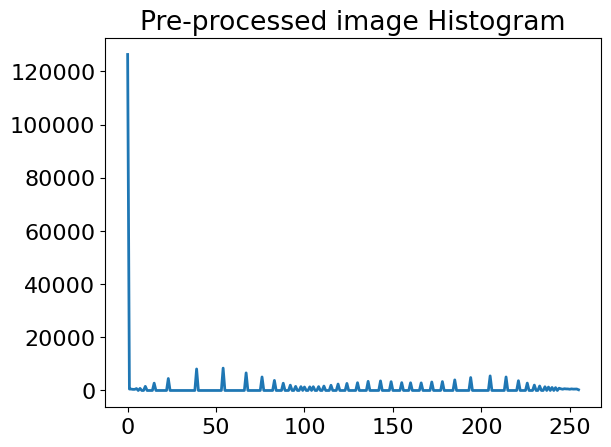

In [ ]:
ct_preprocessed = ct_image_preprocessing(ct_image)

# Plot pre-processed image histogram
hist, bins_center = exposure.histogram(ct_preprocessed)
plt.plot(bins_center, hist, lw=2)
plt.title('Pre-processed image Histogram')

According to the pixel values histogram, we can determine that values below ~100 are not relevant in the organ segmentation task.

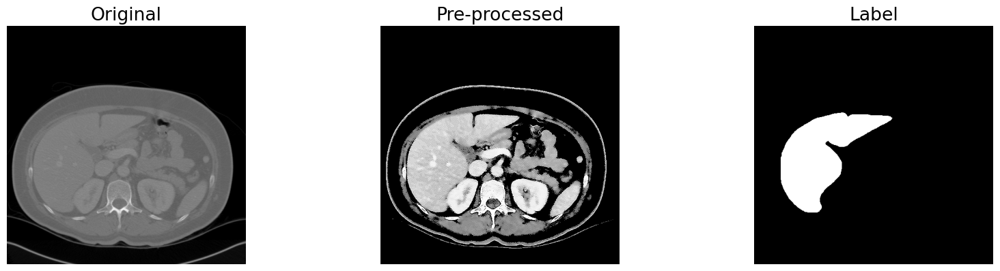

In [ ]:
# Normalize background and irrelevant parts of the image to 0
ct_preprocessed[ct_preprocessed<=110] = 0

ct_proprocessed = [ct_image, ct_preprocessed, ct_label]
ct_proprocessed_titles = ['Original', 'Pre-processed', 'Label']
plot_image_processing_results(ct_proprocessed, ct_proprocessed_titles)

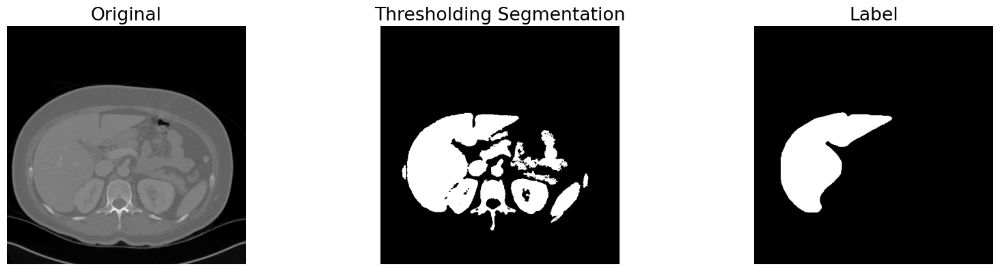

In [ ]:
thresholding = np.copy(ct_preprocessed)
# Thresholding segmentation (depends on the specific image histogram)
thresholding[thresholding<=160] = 0
thresholding[thresholding>160] = 255

# Median blur denoising
thresholding = cv2.medianBlur(thresholding, 3)

# Remove very small objects and contours
thresholding = remove_small_objects(thresholding, 200)

ct_proprocessed = [ct_image, thresholding, ct_label]
ct_proprocessed_titles = ['Original', 'Thresholding Segmentation', 'Label']
plot_image_processing_results(ct_proprocessed, ct_proprocessed_titles)

##### **PRE-PROCESS CT DATASET + TRAIN-VAL-TEST SPLIT**

In [ ]:
def ct_preprocess_images(raw_dataset):
  '''
  Preprocess the CT images of the raw dataset
  params: raw dataset dictionary
  '''
  for patient in raw_dataset['CT'].values():
    for i in range(len(patient[0])):
      patient[0][i] = ct_image_preprocessing(patient[0][i])

In [ ]:
def ct_train_val_test_split(raw_dataset, val_size=0.1, test_size=0.1, random_state=seed):
  """
  Split the raw CT dataset into training, validation, and test sets.
  params:
  - raw_dataset (dict): A dictionary containing the raw CT dataset, where keys are identifiers and values are CT data arrays.
  - val_size (float): The proportion of the dataset to include in the validation set. Default is 0.1.
  - test_size (float): The proportion of the dataset to include in the test set. Default is 0.1.
  - random_state (int or None): Seed used by the random number generator. Default is None.
  returns:
  - tuple: A tuple containing the training, validation, and test sets.
  """
  # Split by patients
  train_data, test_data = train_test_split(list(raw_dataset['CT'].values()), test_size=test_size, random_state=random_state, shuffle=True)
  train_data, val_data = train_test_split(train_data, test_size=val_size, random_state=random_state, shuffle=True)

  # Get images and labels from the data group of patients
  # Shuffle complete data
  def split_images_labels(data):
    '''
    Splits a dataset of patients into shuffled lists of images and labels.
    params:
    - data (list): List of tuples, where each tuple contains a list of images and a list of labels associated to a patient
    returns: Shuffled lists and images in the same order to maintain the correspondence
    '''
    images = []
    labels = []
    for patient in data:
      for image in patient[0]:
        images.append(image)
      for label in patient[1]:
        labels.append(label)

    combined = list(zip(images, labels))
    random.shuffle(combined)
    images, labels = zip(*combined)
    return np.array(images)[:,:,:, np.newaxis], np.array(labels)[:,:,:, np.newaxis]

  train_images, train_labels = split_images_labels(train_data)
  val_images, val_labels = split_images_labels(val_data)
  test_images, test_labels = split_images_labels(test_data)

  return train_images, train_labels, val_images, val_labels, test_images, test_labels

**Raw CT images split**

In [ ]:
ct_train_images, ct_train_labels, ct_val_images, ct_val_labels, ct_test_images, ct_test_labels = ct_train_val_test_split(raw_dataset)

print('Raw images split')
print(f'Train: images {ct_train_images.shape} - labels {ct_train_labels.shape}')
print(f'Validation: images {ct_val_images.shape} - labels {ct_val_labels.shape}')
print(f'Test: images {ct_test_images.shape} - labels {ct_test_labels.shape}')

Raw images split
Train: images (2359, 512, 512, 1) - labels (2359, 512, 512, 1)
Validation: images (324, 512, 512, 1) - labels (324, 512, 512, 1)
Test: images (191, 512, 512, 1) - labels (191, 512, 512, 1)


**Pre-processed images split**

In [ ]:
# Get pre-processed images split
ct_preprocess_images(raw_dataset)
ct_train_preimages, ct_train_prelabels, ct_val_preimages, ct_val_prelabels, ct_test_preimages, ct_test_prelabels = ct_train_val_test_split(raw_dataset)

print('Pre-processed images split')
print(f'Train: images {ct_train_preimages.shape} - labels {ct_train_prelabels.shape}')
print(f'Validation: images {ct_val_preimages.shape} - labels {ct_val_prelabels.shape}')
print(f'Test: images {ct_test_preimages.shape} - labels {ct_test_prelabels.shape}')

Pre-processed images split
Train: images (2359, 512, 512, 1) - labels (2359, 512, 512, 1)
Validation: images (324, 512, 512, 1) - labels (324, 512, 512, 1)
Test: images (191, 512, 512, 1) - labels (191, 512, 512, 1)


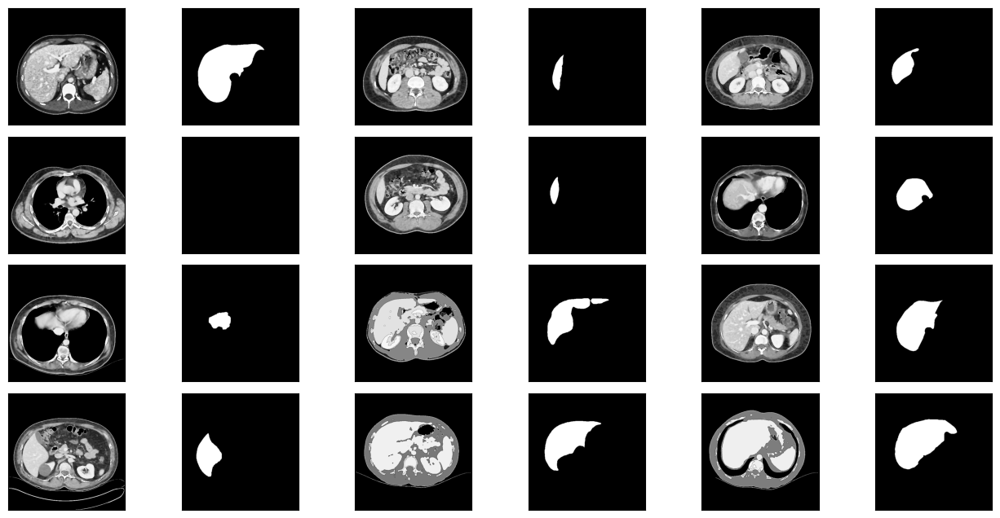

In [ ]:
# Display random pre-processed CT images and their labels from the original dataset
select_display_rand_sample_img(ct_train_preimages, ct_train_prelabels)

**Save datasets**

Create TensorFlow dataset objects and save them in separate files for later training organ segmentation models

In [ ]:
# Raw dataset
ct_train_raw = tf.data.Dataset.from_tensor_slices((ct_train_images, ct_train_labels))
ct_train_raw.save(os.path.join(modeling_path, 'CT', 'ct_train_raw'))

ct_val_raw = tf.data.Dataset.from_tensor_slices((ct_val_images, ct_val_labels))
ct_val_raw.save(os.path.join(modeling_path, 'CT', 'ct_val_raw'))

ct_test_raw = tf.data.Dataset.from_tensor_slices((ct_test_images, ct_test_labels))
ct_test_raw.save(os.path.join(modeling_path, 'CT', 'ct_test_raw'))

In [ ]:
# Pre-processed dataset
ct_train_pre = tf.data.Dataset.from_tensor_slices((ct_train_preimages, ct_train_prelabels))
ct_train_pre.save(os.path.join(modeling_path, 'CT', 'ct_train_pre'))

ct_val_pre = tf.data.Dataset.from_tensor_slices((ct_val_preimages, ct_val_prelabels))
ct_val_pre.save(os.path.join(modeling_path, 'CT', 'ct_val_pre'))

ct_test_pre = tf.data.Dataset.from_tensor_slices((ct_test_preimages, ct_test_prelabels))
ct_test_pre.save(os.path.join(modeling_path, 'CT', 'ct_test_pre'))

#### MRI images pre-processing

- MR images represent the radio-frequency energy released after re-alignment of the protons in the presence of a strong magnetic field.

- MR imaging provides excellent resolution and contrast of soft-tissue components.

** usually more challenging to be displayed or analyzed due to the lack of a standard image intensity scale

** subject to significant variations even when the same scanner is used to scan the same patient or the same organ

(Masoudi et al., 2021)

**MRI T1-DUAL (in-phase, out-phase)**

T1-weighted MRI
 - T1 (longitudinal relaxation time) measure the time taken for spinning protons to realign with the external magnetic field
 - sequence emphasizes differences in the T1 relaxation times of tissues
 - produced by using short Time to Echo (TE) and Repetition Time (TR)

 1. **In-phase:** protons in fat and water are in-phase, meaning their magnetic moments align signal from fat and water, leading to constructive (additive) interference, which can cause signal loss in areas with fat-water interfaces
 2. **Out-phase:** protons in fat and water are out-of-phase, meaning their magnetic moments are opposed, signal from fat and water partially cancels out, resulting in decreased signal intensity, especially in areas with fat-water interfaces

** particularly useful for detecting and characterizing lesions containing both fat and water components, such as hepatic lesions in the liver


(Preston, 2006)
(Merkle, 2019)


**T1 In-phase**

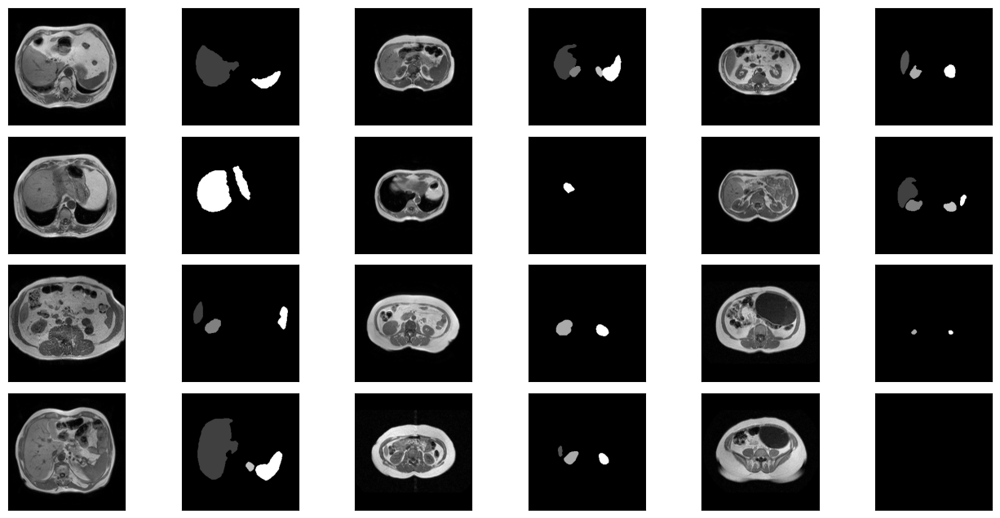

In [ ]:
# Display random MR T1Dual In-Phase images and their labels from the original dataset
mrt1_inphase_images, mrt1_inphase_labels = get_procedure_images_labels(raw_dataset, 'MR_T1DUAL_InPhase', [256, 256])
select_display_rand_sample_img(mrt1_inphase_images, mrt1_inphase_labels)

**T1 Out-phase**

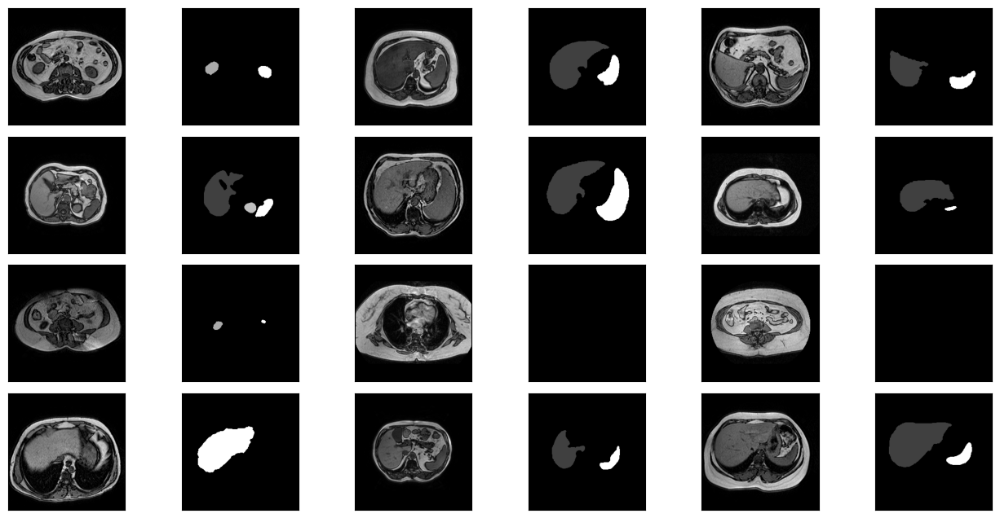

In [ ]:
# Display random MR T1Dual Out-Phase images and their labels from the original dataset
mrt1_outphase_images, mrt1_outphase_labels = get_procedure_images_labels(raw_dataset, 'MR_T1DUAL_OutPhase', [256, 256])
select_display_rand_sample_img(mrt1_outphase_images, mrt1_outphase_labels)

**MRI T2-SPIR**

T2-weighted MRI
 - T2 (transverse relaxation time) measure the time taken for spinning protons to lose phase coherence among the nuclei spinning perpendicular to the main field
 - sequence emphasizes differences in the T2 relaxation times of tissues
 - produced by using longer Time to Echo (TE) and Repetition Time (TR)

 1. **SPIR** (Spectral Presaturation with Inversion Recovery): technique used to selectively saturate the signal from certain tissues (e.g. organs) and null the signal of other tissues (e.g. fat) to improve image contrast

** provides excellent soft tissue contrast

(Preston, 2006)
(Zee et al., 1992)

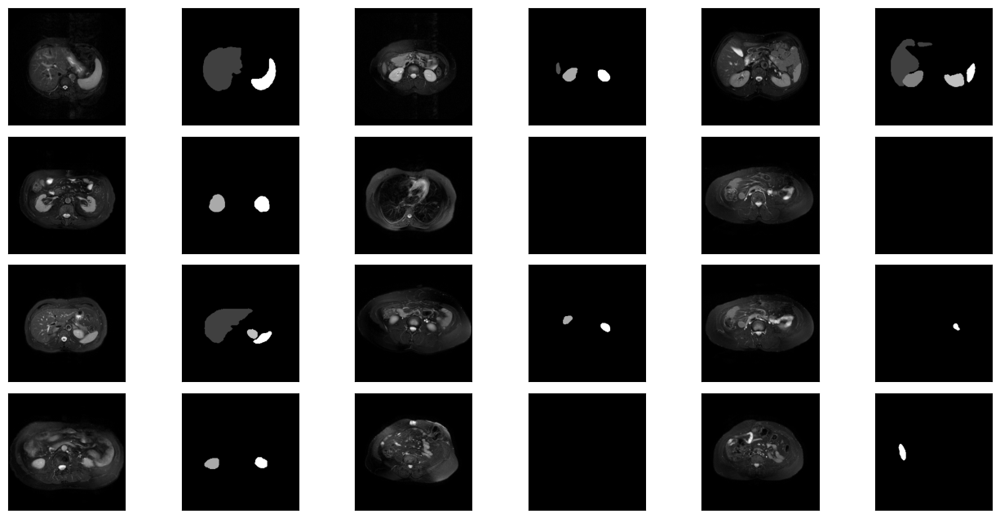

In [ ]:
# Display random MR T2Spir images and their labels from the original dataset
mrt2_images, mrt2_labels = get_procedure_images_labels(raw_dataset, 'MR_T2SPIR', [256, 256])
select_display_rand_sample_img(mrt2_images, mrt2_labels)

In [ ]:
# Work with a random image and label from MRI dataset
rand_idx = random.randrange(len(mrt2_images))
t1in_image = mrt1_inphase_images[rand_idx]
t1out_image = mrt1_outphase_images[rand_idx]
t1_label = mrt1_inphase_labels[rand_idx]

t2_image = mrt2_images[rand_idx]
t2_label = mrt2_labels[rand_idx]


##### **DENOISING**

Denoising is usually embedded within the current MR scanners, making acquired MR images to rarely suffer from direct noise distortion. In practice, additive Gaussian, Rician, and Speckle noise, respiratory and body movements and aliasing may still be major sources of contaminating noise in these images that should be addressed prior to any diagnosis.

(Masoudi et al., 2021)

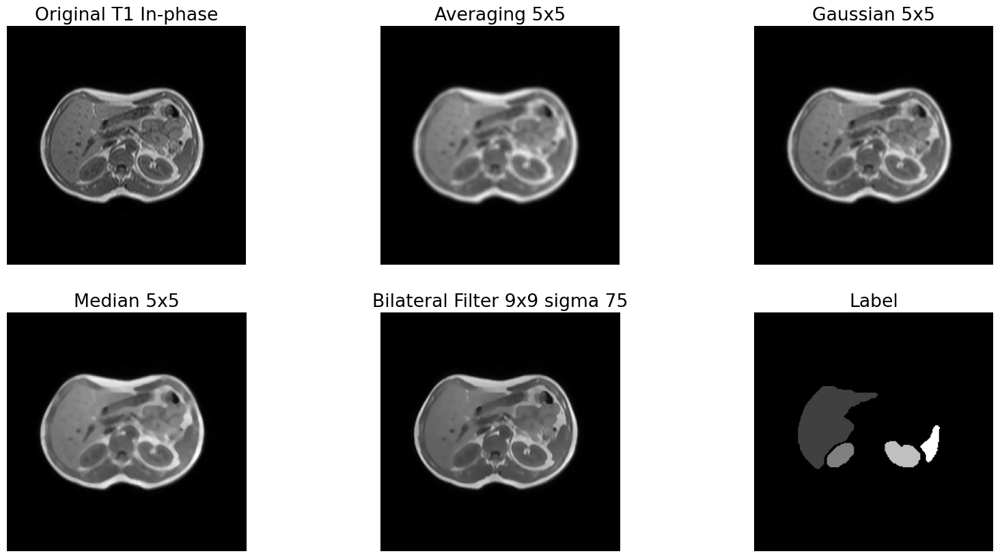

In [ ]:
t1in_denoising = [t1in_image, cv2.blur(t1in_image, (5, 5)), cv2.GaussianBlur(t1in_image, (5, 5), 0),
                cv2.medianBlur(t1in_image, 5), cv2.bilateralFilter(np.float32(t1in_image), 9, 75, 75), t1_label]
t1in_denoising_titles = ['Original T1 In-phase', 'Averaging 5x5', 'Gaussian 5x5', 'Median 5x5', 'Bilateral Filter 9x9 sigma 75', 'Label']
plot_image_processing_results(t1in_denoising, t1in_denoising_titles)

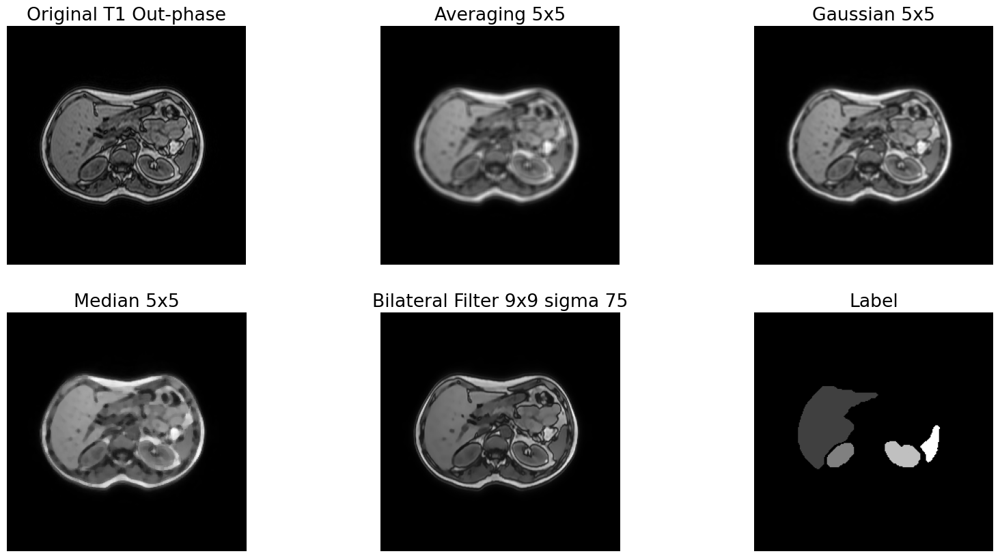

In [ ]:
t1out_denoising = [t1out_image, cv2.blur(t1out_image, (5, 5)), cv2.GaussianBlur(t1out_image, (5, 5), 0),
                cv2.medianBlur(t1out_image, 5), cv2.bilateralFilter(np.float32(t1out_image), 9, 75, 75), t1_label]
t1out_denoising_titles = ['Original T1 Out-phase', 'Averaging 5x5', 'Gaussian 5x5', 'Median 5x5', 'Bilateral Filter 9x9 sigma 75', 'Label']
plot_image_processing_results(t1out_denoising, t1out_denoising_titles)

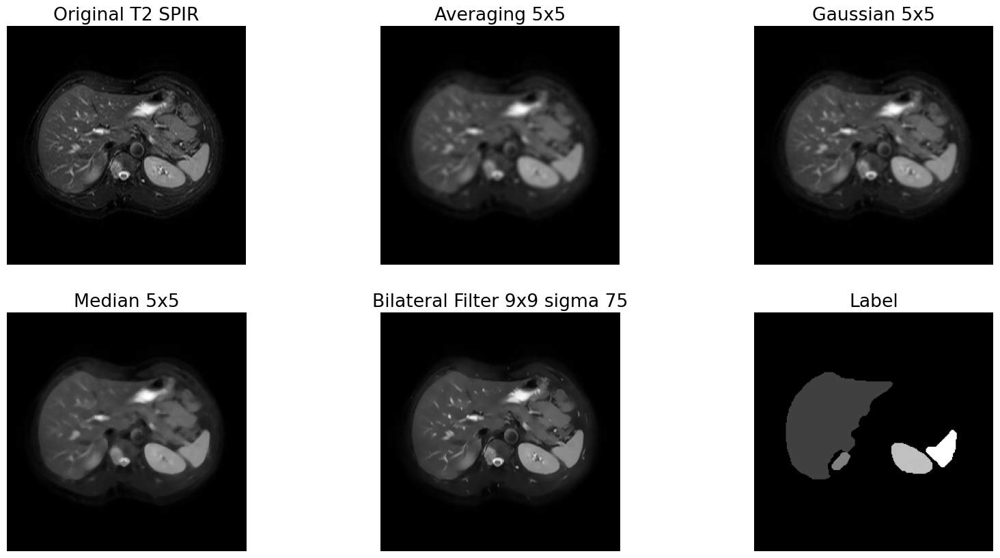

In [ ]:
t2_denoising = [t2_image, cv2.blur(t2_image, (5, 5)), cv2.GaussianBlur(t2_image, (5, 5), 0),
                cv2.medianBlur(t2_image, 5), cv2.bilateralFilter(np.float32(t2_image), 9, 75, 75), t2_label]
t2_denoising_titles = ['Original T2 SPIR', 'Averaging 5x5', 'Gaussian 5x5', 'Median 5x5', 'Bilateral Filter 9x9 sigma 75', 'Label']
plot_image_processing_results(t2_denoising, t2_denoising_titles)

- Averaging : blurs too much the edges X
- Gaussian : good alternative but edges not that sharp X
- Median : not dealing with salt-pepper noise X
- **Bilaterial** : Gaussian smoothing + sharp edges √ (can be effective reducing the additive Gaussian, Rician, and Speckle noise)

In [13]:
def mri_bilateral_filter(volume, d=9, sigma_color=75, sigma_space=75):
  '''
  Apply bilateral filter to a volume slice by slice
  params:
  - volume: array of grayscale images
  - d: dimension of the filter
  - sigma_color: sigma color parameter of the bilateral filter
  - sigma_space: sigma space parameter of the bilateral filter
  '''
  filtered_volume = np.zeros_like(volume)
  for i in range(volume.shape[0]):
    filtered_volume[i, :, :] = cv2.bilateralFilter(volume[i, :, :].astype(np.float32), d, sigma_color, sigma_space)
  return filtered_volume


##### **BIAS FIELD CORRECTION**

"Bias field" distortion is a low-frequency non-uniformity that is present in the MR data, causing the MR intensity values to vary across the images obtained from the same scanner, same patient, and even for the same tissue. N4 expectation–maximization (EM) algorithm is the most commonly used method.

(Masoudi et al., 2021)

In [ ]:
def mr_bias_field_correction(volume):
  '''
  Apply N4 bias field correction to a volume or slice
  params:
  - volume: array of grayscale images
  '''
  sitk_image = sitk.GetImageFromArray(volume)
  corrector = sitk.N4BiasFieldCorrectionImageFilter()
  corrected_image = corrector.Execute(sitk_image)
  corrected_volume = sitk.GetArrayFromImage(corrected_image)
  return corrected_volume

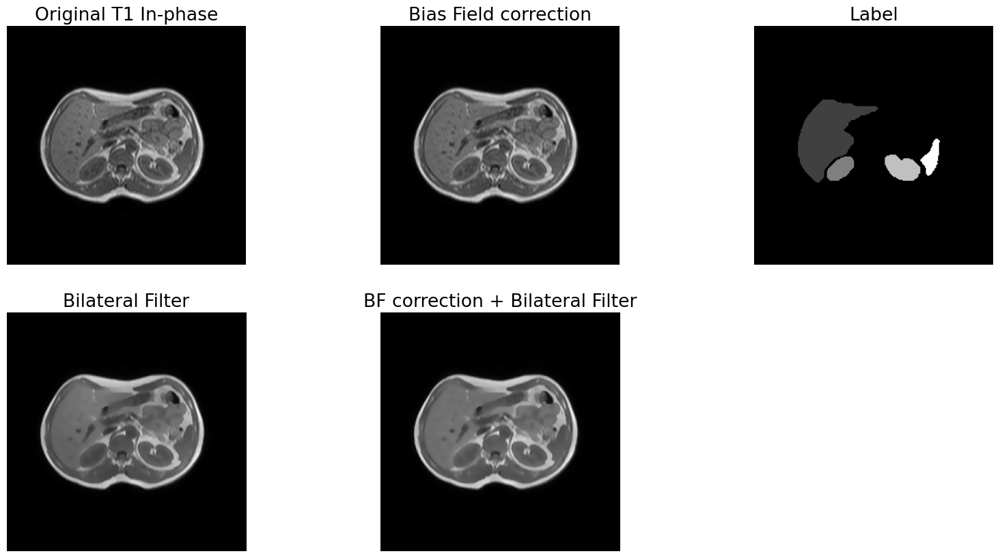

In [ ]:
t1in_biascorr = [t1in_image, mr_bias_field_correction(t1in_image.astype(np.float32)), t1_label,
                 cv2.bilateralFilter(np.float32(t1in_image), 9, 75, 75),
                 mr_bias_field_correction(cv2.bilateralFilter(np.float32(t1in_image), 9, 75, 75))]
t1in_biascorr_titles = ['Original T1 In-phase', 'Bias Field correction', 'Label', 'Bilateral Filter', 'BF correction + Bilateral Filter']
plot_image_processing_results(t1in_biascorr, t1in_biascorr_titles)

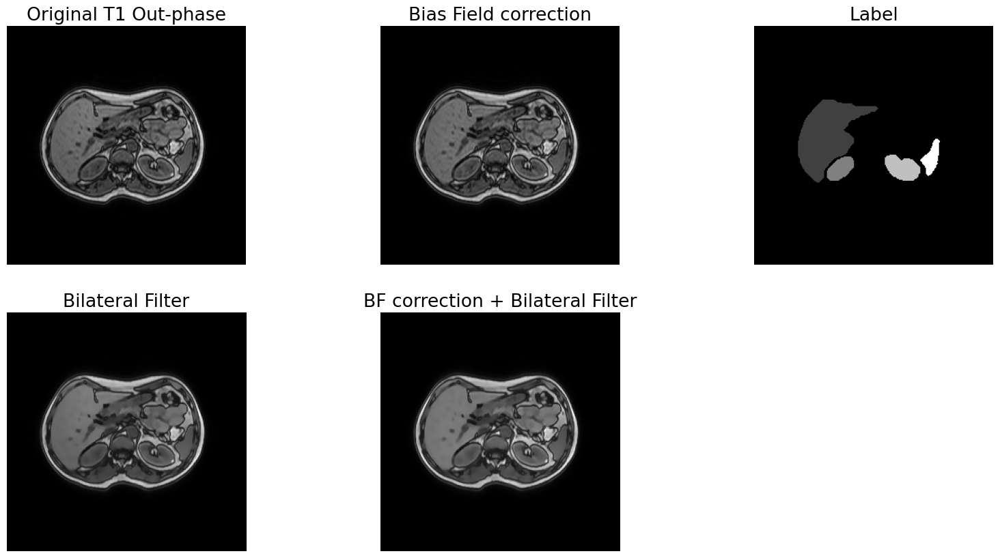

In [ ]:
t1out_biascorr = [t1out_image, mr_bias_field_correction(t1out_image.astype(np.float32)), t2_label,
                 cv2.bilateralFilter(np.float32(t1out_image), 9, 75, 75),
                 mr_bias_field_correction(cv2.bilateralFilter(np.float32(t1out_image), 9, 75, 75))]
t1out_biascorr_titles = ['Original T1 Out-phase', 'Bias Field correction', 'Label', 'Bilateral Filter', 'BF correction + Bilateral Filter']
plot_image_processing_results(t1out_biascorr, t1out_biascorr_titles)

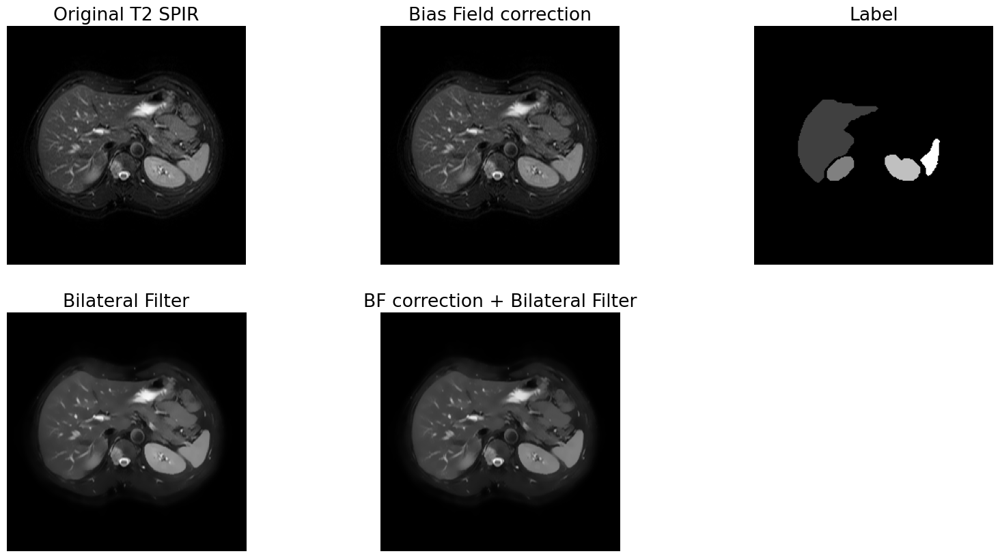

In [ ]:
t2_biascorr = [t2_image, mr_bias_field_correction(t2_image.astype(np.float32)), t1_label,
                 cv2.bilateralFilter(np.float32(t2_image), 9, 75, 75),
                 mr_bias_field_correction(cv2.bilateralFilter(np.float32(t2_image), 9, 75, 75))]
t2_biascorr_titles = ['Original T2 SPIR', 'Bias Field correction', 'Label', 'Bilateral Filter', 'BF correction + Bilateral Filter']
plot_image_processing_results(t2_biascorr, t2_biascorr_titles)

**Bias Field correction + Bilaterial Filter :**
- denoising √
- sharp edges √
- remove "bias field" distortion (low frequency intensity non-uniformity) √


##### **SAMPLING & REGISTRATION**

MR slices within the same image sequence are more likely to be offset from one another, therefore there is a preference to have aligned and equally physical spaced MRI input images for an object detection or segmentation task.

** Also it is necessary to have all the images and volumes of same size for model fitting.

(Masoudi et al., 2021)

In [14]:
def resample(volume, voxel_dims, target_resolution, target_shape, order):
  '''
  Resample a 3D volume to a target resolution and shape.
  params:
  - volume (ndarray): input 3D volume to be resampled
  - voxel_dims (tuple or array): dimensions of the voxels in the input volume
  - target_resolution (tuple or array): desired voxel resolution for the resampled volume
  - target_shape (tuple or array): desired shape for the resampled volume
  - order (int): order of the spline interpolation used in resampling
  returns:
  - (ndarray) resampled 3D volume
  '''
  scale_vector = (voxel_dims[0]/target_resolution[0], voxel_dims[1]/target_resolution[1], voxel_dims[2]/target_resolution[2])
  rescaled_img = skimage.transform.rescale(volume, scale_vector, order=order, preserve_range=True,  mode='constant')

  factors = (
          target_shape[0]/rescaled_img.shape[0],
          target_shape[1]/rescaled_img.shape[1],
          target_shape[2]/rescaled_img.shape[2]
          )
  return zoom(rescaled_img, factors, order=order, mode= 'nearest')

In [20]:
# based on dataset statistics 32 is the mean of MRI axial slices per patient
TARGET_SHAPE = (32, 256, 256)

# based on dataset statistics 1.5 is the mean MRI voxel dimension
# use isotropic resolution (having the same nominal resolution along all three spatial axes)
TARGET_RESOLUTION = (1.5, 1.5, 1.5)

**Test with MRI samples of patient 1**

In [ ]:
vox_dims_t1in = dict_metadata['MR_T1DUAL_InPhase']['1']['vox_dim']
vox_dims_t1out = dict_metadata['MR_T1DUAL_OutPhase']['1']['vox_dim']
vox_dims_t2 = dict_metadata['MR_T2SPIR']['1']['vox_dim']

print('Voxel dimensions')
print(f'T1 In-phase: {vox_dims_t1in}, T1 Out-phase: {vox_dims_t1out}, T2 SPIR: {vox_dims_t2}')

Voxel dimensions
T1 In-phase: ('1.89453125', '1.89453125', '5.5'), T1 Out-phase: ('1.89453125', '1.89453125', '5.5'), T2 SPIR: ('1.54296875', '1.54296875', '7.7')


In [ ]:
test_vol_t1in = raw_dataset['MR_T1DUAL_InPhase']['1'][0]
test_vol_t1out = raw_dataset['MR_T1DUAL_OutPhase']['1'][0]
test_vol_t2 = raw_dataset['MR_T2SPIR']['1'][0]

resam_vol_t1in = resample(test_vol_t1in, vox_dims_t1in, TARGET_RESOLUTION, TARGET_SHAPE, 3)
resam_vol_t1out = resample(test_vol_t1out, vox_dims_t1out, TARGET_RESOLUTION, TARGET_SHAPE, 3)
resam_vol_t2 = resample(test_vol_t2, vox_dims_t2, TARGET_RESOLUTION, TARGET_SHAPE, 3)

print('Resampled volume shapes')
print(f'T1 In-phase: {test_vol_t1in.shape} --> {resam_vol_t1in.shape}')
print(f'T1 Out-phase: {test_vol_t1out.shape} --> {resam_vol_t1out.shape}')
print(f'T2 SPIR: {test_vol_t2.shape} --> {resam_vol_t2.shape}')

Resampled volume shapes
T1 In-phase: (35, 256, 256) --> (32, 256, 256)
T1 Out-phase: (35, 256, 256) --> (32, 256, 256)
T2 SPIR: (36, 256, 256) --> (32, 256, 256)


In [ ]:
test_lab_t1in = raw_dataset['MR_T1DUAL_InPhase']['1'][1]
test_lab_t1out = raw_dataset['MR_T1DUAL_OutPhase']['1'][1]
test_lab_t2 = raw_dataset['MR_T2SPIR']['1'][1]

resam_lab_t1in = resample(test_lab_t1in, vox_dims_t1in, TARGET_RESOLUTION, TARGET_SHAPE, 0)
resam_lab_t1out = resample(test_lab_t1out, vox_dims_t1out, TARGET_RESOLUTION, TARGET_SHAPE, 0)
resam_lab_t2 = resample(test_lab_t2, vox_dims_t2, TARGET_RESOLUTION, TARGET_SHAPE, 0)

print('Resampled volume shapes')
print(f'T1 In-phase: {test_lab_t1in.shape} --> {resam_lab_t1in.shape}')
print(f'T1 Out-phase: {test_lab_t1out.shape} --> {resam_lab_t1out.shape}')
print(f'T2 SPIR: {test_lab_t2.shape} --> {resam_lab_t2.shape}')

Resampled volume shapes
T1 In-phase: (35, 256, 256) --> (32, 256, 256)
T1 Out-phase: (35, 256, 256) --> (32, 256, 256)
T2 SPIR: (36, 256, 256) --> (32, 256, 256)


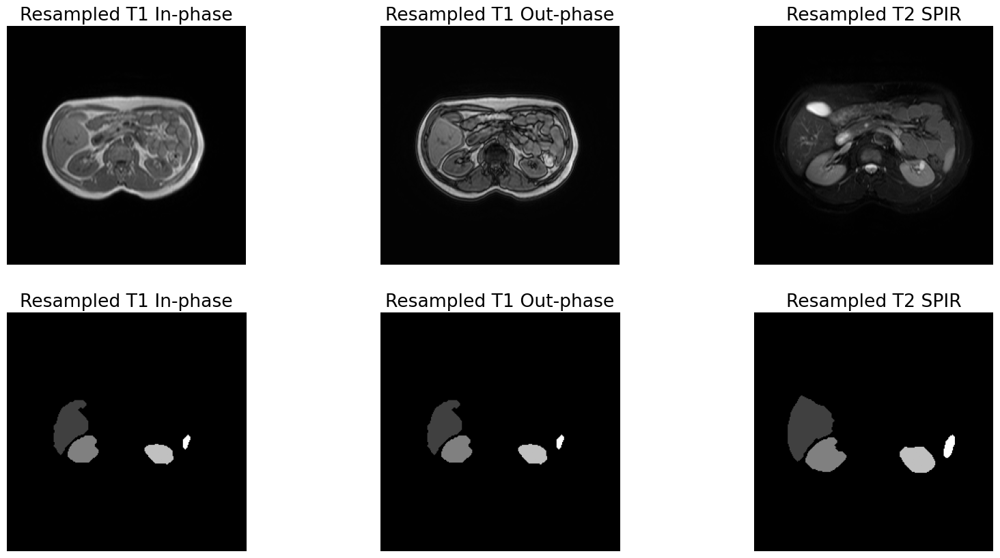

In [ ]:
show_images = [resam_vol_t1in[16], resam_vol_t1out[16], resam_vol_t2[16], resam_lab_t1in[16], resam_lab_t1out[16], resam_lab_t2[16]]
show_titles = ['Resampled T1 In-phase', 'Resampled T1 Out-phase', 'Resampled T2 SPIR', 'Resampled T1 In-phase', 'Resampled T1 Out-phase', 'Resampled T2 SPIR']
plot_image_processing_results(show_images, show_titles)

Clearly, T1-weighted and T2-weighted sequences cannot be stacked together as the target label is not the same even if resampling was done with same target resolution and shape.

However, T1 in-phase and out-phase can be registered together due to resulting same label, voxel dimensions, and volume shape. Therefore, using both in- and out-phase together could provide good contrast between different tissues, such as fat, muscle, and organs, specially the kidney with their high water content.

##### **PRE-PROCESS MR DATASET + TRAIN-VAL-TEST SPLIT**

In [15]:
def mr_preprocess(raw_dataset):
  '''
  Preprocess a raw MRI dataset by denoising, correcting bias fields, and resampling volumes.
  params: dictionary with the raw dataset (modified in place)
  '''
  mr_keys = ['MR_T1DUAL_InPhase', 'MR_T1DUAL_OutPhase', 'MR_T2SPIR']
  for key in mr_keys:
    for patient_id, patient in raw_dataset[key].items():
      # Denoise
      raw_dataset[key][patient_id][0] = mri_bilateral_filter(patient[0].astype(np.float32))
      patient[0] = raw_dataset[key][patient_id][0]

      # Bias filter correction
      raw_dataset['MR_T1DUAL_InPhase'][patient_id][0] = mr_bias_field_correction(patient[0].astype(np.float32))
      patient[0] = raw_dataset[key][patient_id][0]

      # Resample
      vox_dims = dict_metadata[key][patient_id]['vox_dim']
      temp_vol = resample(patient[0], vox_dims, TARGET_RESOLUTION, TARGET_SHAPE, 3)
      temp_labels = resample(patient[1], vox_dims, TARGET_RESOLUTION, TARGET_SHAPE, 0)
      raw_dataset[key][patient_id] = np.stack((temp_vol, temp_labels))

In [16]:
def patients_train_val_test_split(raw_dataset, val_size=0.1, test_size=0.1, random_state=seed):
  '''
  Split the keys of patients into training, validation, and test sets.
  params:
  - raw_dataset (dict): dictionary with the raw dataset
  - val_size (float): proportion of the dataset to include in the validation split. Default is 0.1
  - test_size (float): proportion of the dataset to include in the test split. Default is 0.1
  - random_state (int): seed used by the random number generator
  returns:
  3 lists contain the patient IDs for the training, validation, and test sets, respectively
  '''
  # Split by patients keys
  train_patients, test_patients = train_test_split(list(raw_dataset['MR_T1DUAL_InPhase'].keys()), test_size=test_size, random_state=random_state, shuffle=True)
  train_patients, val_patients = train_test_split(train_patients, test_size=val_size, random_state=random_state, shuffle=True)

  return train_patients, val_patients, test_patients

In [17]:
def get_mr_t1_dataset(raw_dataset, patient_keys):
  '''
  Create a dataset for MR T1DUAL images combining in-phase and out-phase volumes.
  params:
  - raw_dataset (dict): dictionary with the raw dataset (modified in place)
  - patient_keys (list of str): list of patient IDs to include in the dataset
  returns:
  - X containing the combined in-phase and out-phase volumes for each patient
  - Y containing the corresponding labels
  '''
  X = []
  Y = []
  for patient_key in patient_keys:
    inphase_vol = raw_dataset['MR_T1DUAL_InPhase'][patient_key][0][:,:,:, np.newaxis]
    outphase_vol = raw_dataset['MR_T1DUAL_OutPhase'][patient_key][0][:,:,:, np.newaxis]
    labels = raw_dataset['MR_T1DUAL_InPhase'][patient_key][1]

    X.append(np.concatenate((inphase_vol,outphase_vol), axis=3))
    Y.append(labels)
  return np.concatenate(X, axis=0), np.concatenate(Y, axis=0)

In [18]:
def get_mr_t2_dataset(raw_dataset, patient_keys):
  '''
  Create a dataset for MR T2SPIR images.
  params:
  - raw_dataset (dict): dictionary with the raw dataset (modified in place)
  - patient_keys (list of str): list of patient IDs to include in the dataset
  returns:
  - X containing the T2 SPIR volumes for each patient
  - Y containing the corresponding labels
  '''
  X = []
  Y = []
  for patient_key in patient_keys:
    vol = raw_dataset['MR_T2SPIR'][patient_key][0]
    labels = raw_dataset['MR_T2SPIR'][patient_key][1]

    X.append(vol[:,:,:, np.newaxis])
    Y.append(labels)
  return np.concatenate(X, axis=0), np.concatenate(Y, axis=0)

Pre-process MR dataset

In [21]:
mr_preprocess(raw_dataset)

Split patients into train, validation, and test

In [22]:
train_patients, val_patients, test_patients = patients_train_val_test_split(raw_dataset)

Create T1 and T2 datasets

In [23]:
x_t1_train, y_t1_train = get_mr_t1_dataset(raw_dataset, train_patients)
x_t1_val, y_t1_val = get_mr_t1_dataset(raw_dataset, val_patients)
x_t1_test, y_t1_test = get_mr_t1_dataset(raw_dataset, test_patients)

In [24]:
x_t2_train, y_t2_train = get_mr_t2_dataset(raw_dataset, train_patients)
x_t2_val, y_t2_val = get_mr_t2_dataset(raw_dataset, val_patients)
x_t2_test, y_t2_test = get_mr_t2_dataset(raw_dataset, test_patients)

##### **LABEL ONE-HOT-ENCODING**

Encode the labels into a mask of 4 channels, where each channel represent a solid organ (liver, right kidney, left kidney or spleen) containing 0 for background and 1 for the specific organ.

In [25]:
def mr_encode_labels(labels, ranges):
  '''
  Encode label volumes into multi-channel binary volumes based on specified intensity ranges.
  params:
  - labels (list): list of 3D numpy arrays where each array is a label volume
  - ranges (list of tuples): list of tuples specifying the intensity ranges for encoding
  Each tuple is of the form (min_intensity, max_intensity)
  returns:
  4D numpy array of shape (num_volumes, depth, height, width, num_ranges). Each volume in the
  output array is a multi-channel binary volume where each channel corresponds to one of the specified
  intensity ranges
  '''
  encoded_labels = []
  for label in labels:
    encoded_label = np.repeat(np.zeros_like(label, dtype=np.float32)[:,:, np.newaxis], len(ranges)+1, axis=2)
    # Organs labels
    for i, range in enumerate(ranges):
      encoded_label[:,:,i+1][(label >= range[0]) & (label <= range[1])] = 1.0
    # Irrelevant "background" labels
    encoded_label[:, :, 0] = 1.0 - np.max(encoded_label[:, :, 1:], axis=2)

    encoded_labels.append(encoded_label)
  return np.stack(encoded_labels, axis=0)

In [26]:
# liver, right kidney, left kidney, spleen pixel intensity ranges
ORGAN_INTENSITY_RANGES = [[55,70],[110,135],[175,200],[240,255]]

In [27]:
# Test index to show posterior transformations
index_show = 10
label_show = y_t1_train[index_show]

One-hot encode the labels of the datasets

In [28]:
y_t1_train = mr_encode_labels(y_t1_train, ORGAN_INTENSITY_RANGES)
y_t1_val = mr_encode_labels(y_t1_val, ORGAN_INTENSITY_RANGES)
y_t1_test = mr_encode_labels(y_t1_test, ORGAN_INTENSITY_RANGES)

y_t2_train = mr_encode_labels(y_t2_train, ORGAN_INTENSITY_RANGES)
y_t2_val = mr_encode_labels(y_t2_val, ORGAN_INTENSITY_RANGES)
y_t2_test = mr_encode_labels(y_t2_test, ORGAN_INTENSITY_RANGES)

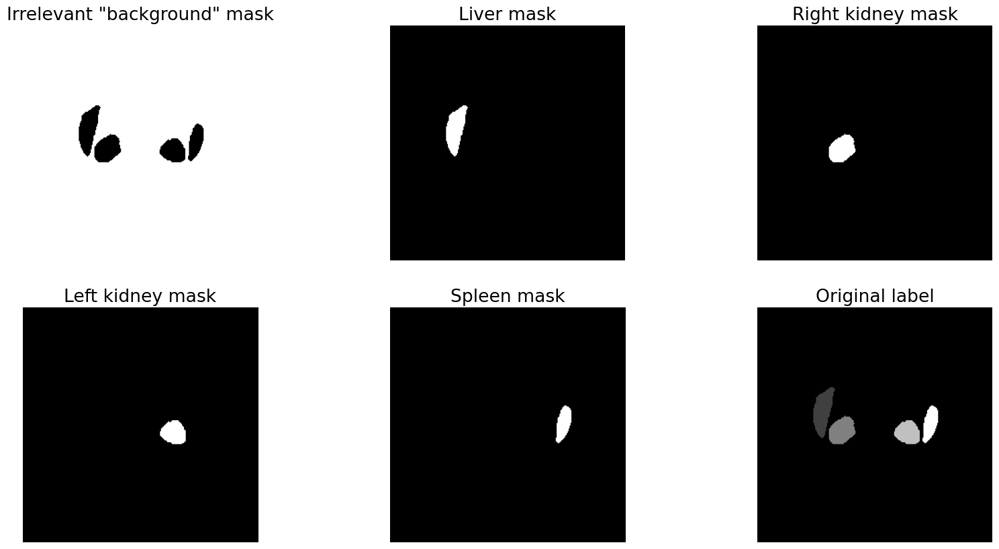

In [29]:
encoded_labels = [y_t1_train[index_show,:,:,0], y_t1_train[index_show,:,:,1], y_t1_train[index_show,:,:,2], y_t1_train[index_show,:,:,3], y_t1_train[index_show,:,:,4], label_show]
encoded_titles = ['Irrelevant "background" mask', 'Liver mask', 'Right kidney mask', 'Left kidney mask', 'Spleen mask', 'Original label']
plot_image_processing_results(encoded_labels, encoded_titles)


##### **STANDARDIZATION**

To have comparable intensity values in MR images, we must enforce image standardization so that for the same MR protocol within the same body region, a particular intensity value represents a certain tissue across all different slices and patients.

(Masoudi et al., 2021)

In [30]:
def mri_standardization(mri_volume, mean_intensity, std_intensity):
  '''
  Standardize an MRI volume by normalizing its pixel intensities and adjusting based on mean and standard deviation.
  params:
  - mri_volume (ndarray): 3D numpy array representing the MRI volume to be standardized
  - mean_intensity (float): mean intensity value for standardization
  - std_intensity (float): standard deviation value for standardization
  returns:
  - standardized ndarray MRI volume
  '''
  # Rescale pixel intensity to [0, 1]
  normalized_volume = cv2.normalize(mri_volume, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)

  # Standardization (subtract mean, divide by standard deviation)
  if mean_intensity != 0 and std_intensity != 0:
    normalized_volume -= mean_intensity
    normalized_volume /= std_intensity

  # Background to zero
  normalized_volume[(normalized_volume < 0.03)] = 0.

  return normalized_volume

Just normalize T1 dataset as in-phase and out-phase images are already together and would not make sense to standardize different MR types of samples together.

In [31]:
x_t1_train = mri_standardization(x_t1_train, 0, 0)
x_t1_val = mri_standardization(x_t1_val, 0, 0)
x_t1_test = mri_standardization(x_t1_test, 0, 0)

Standardize T2 SPIR dataset with the training mean and standard deviation.

In [32]:
T2_MEAN = np.mean(x_t2_train)
T2_STD = np.std(x_t2_train)

In [33]:
x_t2_train = mri_standardization(x_t2_train, T2_MEAN, T2_STD)
x_t2_val = mri_standardization(x_t2_val, T2_MEAN, T2_STD)
x_t2_test = mri_standardization(x_t2_test, T2_MEAN, T2_STD)

##### **SAVE DATASETS**

**T1 DUAL**

In [34]:
print('MR T1 DUAL images split')
print(f'Train: images {x_t1_train.shape} - labels {y_t1_train.shape}')
print(f'Validation: images {x_t1_val.shape} - labels {y_t1_val.shape}')
print(f'Test: images {x_t1_test.shape} - labels {y_t1_test.shape}')

MR T1 DUAL images split
Train: images (512, 256, 256, 2) - labels (512, 256, 256, 5)
Validation: images (64, 256, 256, 2) - labels (64, 256, 256, 5)
Test: images (64, 256, 256, 2) - labels (64, 256, 256, 5)


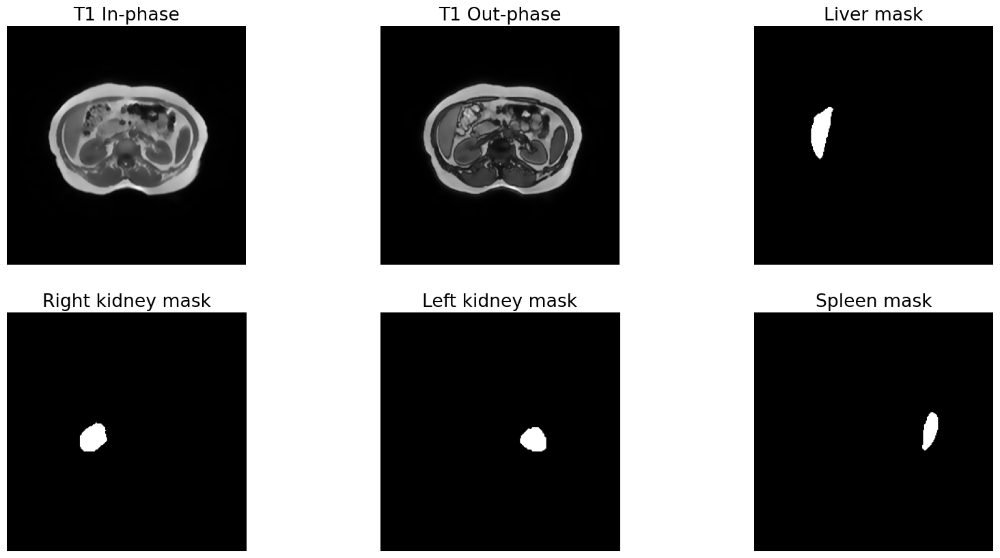

In [36]:
t1_images = [x_t1_train[index_show,:,:,0], x_t1_train[index_show,:,:,1], y_t1_train[index_show,:,:,1], y_t1_train[index_show,:,:,2], y_t1_train[index_show,:,:,3], y_t1_train[index_show,:,:,4]]
t1_titles = ['T1 In-phase', 'T1 Out-phase', 'Liver mask', 'Right kidney mask', 'Left kidney mask', 'Spleen mask']
plot_image_processing_results(t1_images, t1_titles)

Create TensorFlow dataset objects and save them in separate files for later training organ segmentation models

In [38]:
t1_train = tf.data.Dataset.from_tensor_slices((x_t1_train, y_t1_train))
t1_train.save(os.path.join(modeling_path, 'MR_T1DUAL', 'mr_t1dual_train'))

t1_val = tf.data.Dataset.from_tensor_slices((x_t1_val, y_t1_val))
t1_val.save(os.path.join(modeling_path, 'MR_T1DUAL', 'mr_t1dual_val'))

t1_test = tf.data.Dataset.from_tensor_slices((x_t1_test, y_t1_test))
t1_test.save(os.path.join(modeling_path, 'MR_T1DUAL', 'mr_t1dual_test'))

**T2 SPIR**

In [39]:
print('MR T2 SPIR images split')
print(f'Train: images {x_t2_train.shape} - labels {y_t2_train.shape}')
print(f'Validation: images {x_t2_val.shape} - labels {y_t2_val.shape}')
print(f'Test: images {x_t2_test.shape} - labels {y_t2_test.shape}')

MR T2 SPIR images split
Train: images (512, 256, 256, 1) - labels (512, 256, 256, 5)
Validation: images (64, 256, 256, 1) - labels (64, 256, 256, 5)
Test: images (64, 256, 256, 1) - labels (64, 256, 256, 5)


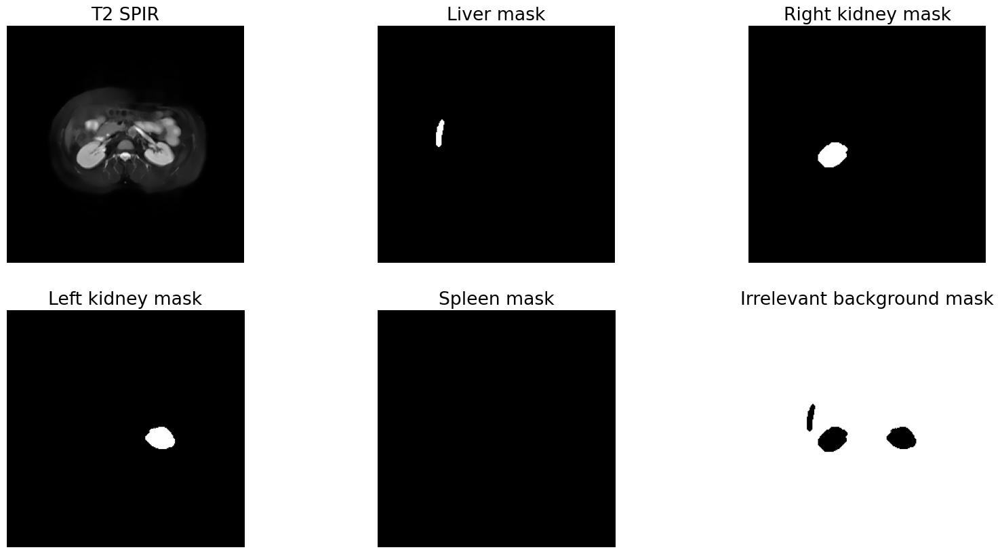

In [41]:
t2_images = [x_t2_train[index_show,:,:], y_t2_train[index_show,:,:,1], y_t2_train[index_show,:,:,2], y_t2_train[index_show,:,:,3], y_t2_train[index_show,:,:,4], y_t2_train[index_show,:,:,0]]
t2_titles = ['T2 SPIR', 'Liver mask', 'Right kidney mask', 'Left kidney mask', 'Spleen mask', 'Irrelevant background mask']
plot_image_processing_results(t2_images, t2_titles)

Create TensorFlow dataset objects and save them in separate files for later training organ segmentation models

In [42]:
t2_train = tf.data.Dataset.from_tensor_slices((x_t2_train, y_t2_train))
t2_train.save(os.path.join(modeling_path, 'MR_T2SPIR', 'mr_t2spir_train'))

t2_val = tf.data.Dataset.from_tensor_slices((x_t2_val, y_t2_val))
t2_val.save(os.path.join(modeling_path, 'MR_T2SPIR', 'mr_t2spir_val'))

t2_test = tf.data.Dataset.from_tensor_slices((x_t2_test, y_t2_test))
t2_test.save(os.path.join(modeling_path, 'MR_T2SPIR', 'mr_t2spir_test'))

### Model training

**Task:** healthy abdominal organ segmentation from CT and MRI medical images

##### **Model setup**

In [11]:
# Generic callbacks EarlyStopping and ReduceLROnPlateau
CALLBACKS = [
        tfk.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=3, restore_best_weights=True),
        tfk.callbacks.ReduceLROnPlateau(monitor='val_loss', mode='min', patience=2, factor=0.1, min_lr=1e-5)
]

DICE coefficient (DICE) is calculated as $2\frac{|S \cap G|}{|S|+|G|}$, where $|\cdot|$ denotes cardinality (the larger, the better)

Used in original dataset paper (Kavur et al., 2019)

In [12]:
DICE_SMOOTH = 1e-15 # avoid 0 division
def dice_coef(y_true, y_pred):
  y_true = tf.cast(tfkl.Flatten()(y_true), tf.float32)
  y_pred = tf.cast(tfkl.Flatten()(y_pred), tf.float32)
  intersection = tf.reduce_sum(y_true * y_pred)
  return (2. * intersection + DICE_SMOOTH) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) + DICE_SMOOTH)

def dice_loss(y_true, y_pred):
  return 1.0 - dice_coef(y_true, y_pred)

Multi-class DICE coefficient for 4 organ classes (ignoring background)

In [13]:
def dice_coef_multi(y_true, y_pred):
  dice = 0
  for index in range(1, 5):
    dice += dice_coef(y_true[:,:,:,index], y_pred[:,:,:,index])
  return dice

def dice_coef_multi_loss(y_true, y_pred):
  return 4.0 - dice_coef_multi(y_true, y_pred)


# DICE coefficient for each organ
def liver_dice_coef(y_true, y_pred):
  return dice_coef(y_true[:,:,:,1], y_pred[:,:,:,1])

def rkidney_dice_coef(y_true, y_pred):
  return dice_coef(y_true[:,:,:,2], y_pred[:,:,:,2])

def lkidney_dice_coef(y_true, y_pred):
  return dice_coef(y_true[:,:,:,3], y_pred[:,:,:,3])

def spleen_dice_coef(y_true, y_pred):
  return dice_coef(y_true[:,:,:,4], y_pred[:,:,:,4])

Relative absolute volume difference (RAVD) compares two volumes in percent $RAVD=\frac{abs(|S|-|G|)}{|G|}\times 100$ (the smaller, the better)

Used in original dataset paper (Kavur et al., 2019)

In [14]:
def ravd(y_true, y_pred):
  y_true = tf.cast(tfkl.Flatten()(y_true), tf.float32)
  y_pred = tf.cast(tfkl.Flatten()(y_pred), tf.float32)
  return tf.abs(tf.reduce_sum(y_pred)-tf.reduce_sum(y_true))/(tf.reduce_sum(y_true))

In [15]:
def accuracy(y_true, y_pred):
  return tfk.backend.mean(tfk.backend.equal(y_true, tfk.backend.round(y_pred)))

In [16]:
# Initial model compiling hyperparameters
LEARNING_RATE = 1e-4
METRICS = [dice_coef, ravd, tfk.metrics.MeanIoU(num_classes=2), accuracy]
LOSS = dice_loss

METRICS_MULTI = [dice_coef_multi, tfk.metrics.MeanIoU(num_classes=5), liver_dice_coef, rkidney_dice_coef, lkidney_dice_coef, spleen_dice_coef]
LOSS_MULTI = dice_coef_multi_loss

In [17]:
def plot_learning_curves(history, model_title):
  fig = plt.figure(figsize=(12, 5))

  fig.add_subplot(121)
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title(model_title + ' loss vs epochs')
  plt.ylabel('Loss')
  plt.xlabel('Epoch')
  plt.legend(['Training', 'Validation'], loc='upper right')

  fig.add_subplot(122)
  plt.plot(history.history['mean_io_u'])
  plt.plot(history.history['val_mean_io_u'])
  plt.title(model_title + ' Mean IoU vs. epochs')
  plt.ylabel('Mean IoU')
  plt.xlabel('Epoch')
  plt.legend(['Training', 'Validation'], loc='upper right')

#### CT Liver Segmentation

- only healthy livers aligned in the same direction and patient position
- diffusion of contrast agent to parenchyma and the enhancement of the inner vascular tree

(Kavur et al., 2019)

**Input:** CT normalized 2D images (512x512 x 1channel)

**Output:** [0,1] mask of the liver segmentation (512x512 x 1channel)



##### **Load datasets**

In [ ]:
def ct_final_normalization_raw(images, labels):
  '''
  Normalize CT images and labels to the range [0, 1]
  It handles `uint16` normalization
  '''
  images_preproc = tf.cast(images, tf.float32) / 65535.
  labels_preproc = tf.cast(labels, tf.float32) / 255.
  return images_preproc, labels_preproc

def ct_final_normalization_pre(images, labels):
  '''
  Normalize CT images and labels to the range [0, 1]
  It handles `uint8` normalization
  '''
  images_preproc = tf.cast(images, tf.float32) / 255.
  labels_preproc = tf.cast(labels, tf.float32) / 255.
  return images_preproc, labels_preproc

In [17]:
BATCH_SIZE = 16

In [ ]:
# Raw dataset
ct_train_raw = tf.data.Dataset.load(os.path.join(modeling_path, 'CT', 'ct_train_raw'))
ct_train_raw = ct_train_raw.map(ct_final_normalization_raw).batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

ct_val_raw = tf.data.Dataset.load(os.path.join(modeling_path, 'CT', 'ct_val_raw'))
ct_val_raw = ct_val_raw.map(ct_final_normalization_raw).batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

ct_test_raw = tf.data.Dataset.load(os.path.join(modeling_path, 'CT', 'ct_test_raw'))
ct_test_raw = ct_test_raw.map(ct_final_normalization_raw).batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

In [ ]:
# Pre-processed dataset
ct_train_pre = tf.data.Dataset.load(os.path.join(modeling_path, 'CT', 'ct_train_pre'))
ct_train_pre = ct_train_pre.map(ct_final_normalization_pre).batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

ct_val_pre = tf.data.Dataset.load(os.path.join(modeling_path, 'CT', 'ct_val_pre'))
ct_val_pre = ct_val_pre.map(ct_final_normalization_pre).batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

ct_test_pre = tf.data.Dataset.save(os.path.join(modeling_path, 'CT', 'ct_test_pre'))
ct_test_pre = ct_test_pre.map(ct_final_normalization_pre).batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

In [ ]:
for input_images, output_images in ct_train_raw.take(1):
    input_shape = input_images.shape
    output_shape = output_images.shape
    break

# Define input shape, output shape, batch size, and number of epochs
INPUT_SHAPE = input_shape[1:]
OUTPUT_SHAPE = output_shape[1:]
IMG_SIZE = input_shape[1]
BATCH_SIZE = input_shape[0]
EPOCHS = 12

# Print input shape, batch size, and number of epochs
print(f'Input Shape: {INPUT_SHAPE}, Output Shape: {OUTPUT_SHAPE}, Batch Size: {BATCH_SIZE}, Epochs: {EPOCHS}')

Input Shape: (512, 512, 1), Output Shape: (512, 512, 1), Batch Size: 16, Epochs: 12


##### **Autoencoder model**

In [ ]:
def autoendocer_model(input_shape):
  inputs = tfkl.Input(shape=input_shape)

  # Encoder
  x = tfkl.Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
  x = tfkl.MaxPooling2D((2, 2), padding='same')(x)
  x = tfkl.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
  x = tfkl.MaxPooling2D((2, 2), padding='same')(x)
  x = tfkl.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
  encoded = tfkl.MaxPooling2D((2, 2), padding='same')(x)

  # Decoder
  x = tfkl.Conv2D(128, (3, 3), activation='relu', padding='same')(encoded)
  x = tfkl.UpSampling2D((2, 2))(x)
  x = tfkl.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
  x = tfkl.UpSampling2D((2, 2))(x)
  x = tfkl.Conv2D(32, (3, 3), activation='relu', padding='same')(x)
  x = tfkl.UpSampling2D((2, 2))(x)
  decoded = tfkl.Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

  model = tfk.models.Model(inputs, decoded)
  return model

In [ ]:
# Create and compile the vanilla U-net model
model = autoendocer_model(INPUT_SHAPE)
model.compile(optimizer=tfk.optimizers.Adam(LEARNING_RATE),
              loss=LOSS,
              metrics=[tfk.metrics.MeanIoU(num_classes=2), accuracy])

Model: "model_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_18 (InputLayer)       [(None, 512, 512, 1)]     0         
                                                                 
 conv2d_263 (Conv2D)         (None, 512, 512, 32)      320       
                                                                 
 max_pooling2d_53 (MaxPooli  (None, 256, 256, 32)      0         
 ng2D)                                                           
                                                                 
 conv2d_264 (Conv2D)         (None, 256, 256, 64)      18496     
                                                                 
 max_pooling2d_54 (MaxPooli  (None, 128, 128, 64)      0         
 ng2D)                                                           
                                                                 
 conv2d_265 (Conv2D)         (None, 128, 128, 128)     738

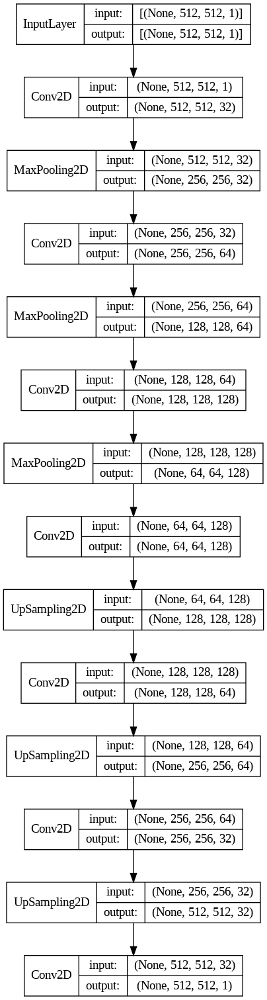

In [ ]:
# Print model summary
model.summary()
plot_model(model, show_shapes=True, show_layer_names=False)

In [ ]:
# Train the model
history = model.fit(
    ct_train_raw,
    epochs=EPOCHS,
    validation_data=ct_val_raw,
    callbacks=CALLBACKS,
    verbose=1
)

Epoch 1/12
148/148 [==============================] - 95s 351ms/step - loss: 0.7053 - mean_io_u_16: 0.4688 - accuracy: 0.7668 - val_loss: 0.5314 - val_mean_io_u_16: 0.4732 - val_accuracy: 0.9011 - lr: 1.0000e-04
Epoch 2/12
148/148 [==============================] - 32s 211ms/step - loss: 0.4420 - mean_io_u_16: 0.4688 - accuracy: 0.9284 - val_loss: 0.4387 - val_mean_io_u_16: 0.4732 - val_accuracy: 0.9396 - lr: 1.0000e-04
Epoch 3/12
148/148 [==============================] - 33s 220ms/step - loss: 0.4070 - mean_io_u_16: 0.4688 - accuracy: 0.9368 - val_loss: 0.4100 - val_mean_io_u_16: 0.4732 - val_accuracy: 0.9485 - lr: 1.0000e-04
Epoch 4/12
148/148 [==============================] - 32s 211ms/step - loss: 0.4060 - mean_io_u_16: 0.4688 - accuracy: 0.9377 - val_loss: 0.4243 - val_mean_io_u_16: 0.4732 - val_accuracy: 0.9450 - lr: 1.0000e-04
Epoch 5/12
148/148 [==============================] - 31s 210ms/step - loss: 0.3896 - mean_io_u_16: 0.4688 - accuracy: 0.9423 - val_loss: 0.3852 - val_m

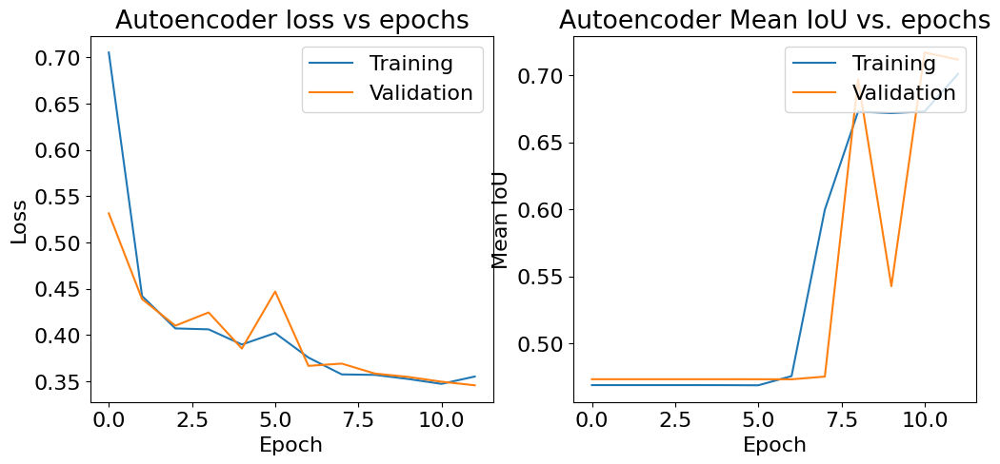

In [ ]:
# Plot learning curves
plot_learning_curves(history, 'Autoencoder')

In [ ]:
# Save model
model.save(os.path.join(modeling_path, 'CT','autoencoder_raw.keras'))

1/1 [==============================] - 0s 170ms/step


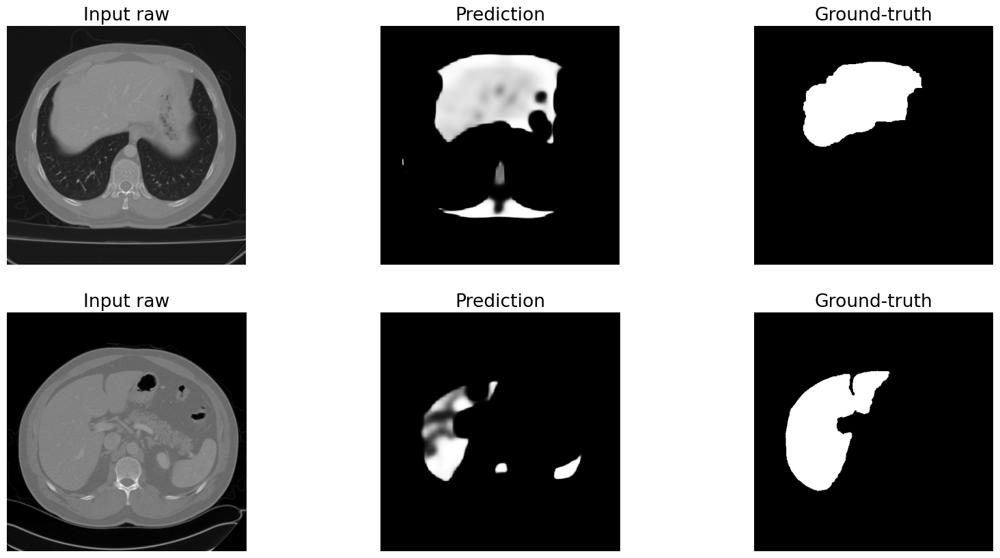

In [ ]:
# Graph predictions on unseen data
preds = model.predict(ct_test_raw.take(1))
for input, true in ct_test_raw.take(1):
  images = [input[0], preds[0], true[0], input[1], preds[1], true[1]]
  titles = ['Input raw', 'Prediction', 'Ground-truth', 'Input raw', 'Prediction', 'Ground-truth']
  plot_image_processing_results(images, titles)
  break

##### **U-net SMALL**

In [ ]:
def unetsmall_model(input_shape):
  inputs = tfkl.Input(shape=input_shape)

  # Encoder
  c1 = tfkl.Conv2D(16, (3, 3), activation='relu', padding='same')(inputs)
  c1 = tfkl.Conv2D(16, (3, 3), activation='relu', padding='same')(c1)
  p1 = tfkl.MaxPooling2D((2, 2))(c1)

  c2 = tfkl.Conv2D(32, (3, 3), activation='relu', padding='same')(p1)
  c2 = tfkl.Conv2D(32, (3, 3), activation='relu', padding='same')(c2)
  p2 = tfkl.MaxPooling2D((2, 2))(c2)

  c3 = tfkl.Conv2D(64, (3, 3), activation='relu', padding='same')(p2)
  c3 = tfkl.Conv2D(64, (3, 3), activation='relu', padding='same')(c3)
  p3 = tfkl.MaxPooling2D((2, 2))(c3)

  # Latent space
  c4 = tfkl.Conv2D(128, (3, 3), activation='relu', padding='same')(p3)
  c4 = tfkl.Conv2D(128, (3, 3), activation='relu', padding='same')(c4)

  # Decoder
  u5 = tfkl.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c4)
  u5 = tfkl.concatenate([u5, c3])
  c5 = tfkl.Conv2D(64, (3, 3), activation='relu', padding='same')(u5)
  c5 = tfkl.Conv2D(64, (3, 3), activation='relu', padding='same')(c5)

  u6 = tfkl.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c5)
  u6 = tfkl.concatenate([u6, c2])
  c6 = tfkl.Conv2D(32, (3, 3), activation='relu', padding='same')(u6)
  c6 = tfkl.Conv2D(32, (3, 3), activation='relu', padding='same')(c6)

  u7 = tfkl.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c6)
  u7 = tfkl.concatenate([u7, c1])
  c7 = tfkl.Conv2D(16, (3, 3), activation='relu', padding='same')(u7)
  c7 = tfkl.Conv2D(16, (3, 3), activation='relu', padding='same')(c7)


  outputs = tfkl.Conv2D(1, (1, 1), activation='sigmoid')(c7)

  model = tfk.models.Model(inputs=[inputs], outputs=[outputs])
  return model

In [ ]:
# Create and compile the model
model = unetsmall_model(INPUT_SHAPE)
model.compile(optimizer=tfk.optimizers.Adam(LEARNING_RATE),
              loss=LOSS,
              metrics=[tfk.metrics.MeanIoU(num_classes=2), accuracy])

Model: "model_16"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_17 (InputLayer)       [(None, 512, 512, 1)]        0         []                            
                                                                                                  
 conv2d_248 (Conv2D)         (None, 512, 512, 16)         160       ['input_17[0][0]']            
                                                                                                  
 conv2d_249 (Conv2D)         (None, 512, 512, 16)         2320      ['conv2d_248[0][0]']          
                                                                                                  
 max_pooling2d_50 (MaxPooli  (None, 256, 256, 16)         0         ['conv2d_249[0][0]']          
 ng2D)                                                                                     

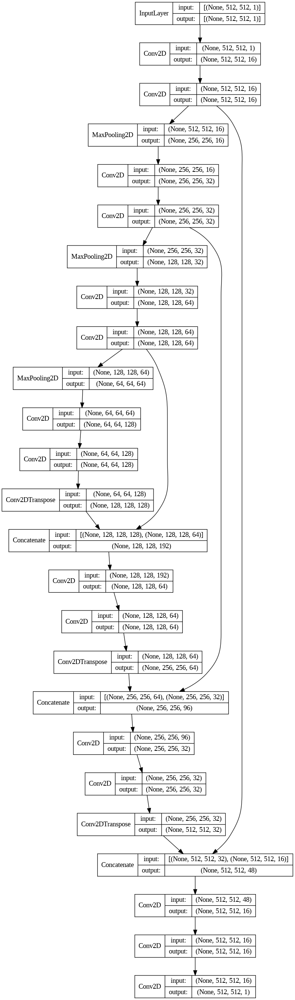

In [ ]:
# Print model summary
model.summary()
plot_model(model, show_shapes=True, show_layer_names=False)

In [ ]:
# Train the model
history = model.fit(
    ct_train_raw,
    epochs=EPOCHS,
    validation_data=ct_val_raw,
    callbacks=CALLBACKS,
    verbose=1
)

Epoch 1/12
148/148 [==============================] - 50s 287ms/step - loss: 0.7700 - mean_io_u_15: 0.4688 - accuracy: 0.5466 - val_loss: 0.4319 - val_mean_io_u_15: 0.4732 - val_accuracy: 0.9461 - lr: 1.0000e-04
Epoch 2/12
148/148 [==============================] - 35s 234ms/step - loss: 0.3858 - mean_io_u_15: 0.6858 - accuracy: 0.9456 - val_loss: 0.4651 - val_mean_io_u_15: 0.6645 - val_accuracy: 0.9341 - lr: 1.0000e-04
Epoch 3/12
148/148 [==============================] - 36s 241ms/step - loss: 0.3422 - mean_io_u_15: 0.7205 - accuracy: 0.9523 - val_loss: 0.4499 - val_mean_io_u_15: 0.6715 - val_accuracy: 0.9374 - lr: 1.0000e-04
Epoch 4/12
148/148 [==============================] - 38s 247ms/step - loss: 0.3364 - mean_io_u_15: 0.7253 - accuracy: 0.9524 - val_loss: 0.3323 - val_mean_io_u_15: 0.7363 - val_accuracy: 0.9610 - lr: 1.0000e-04
Epoch 5/12
148/148 [==============================] - 35s 237ms/step - loss: 0.3177 - mean_io_u_15: 0.7369 - accuracy: 0.9553 - val_loss: 0.3024 - val_m

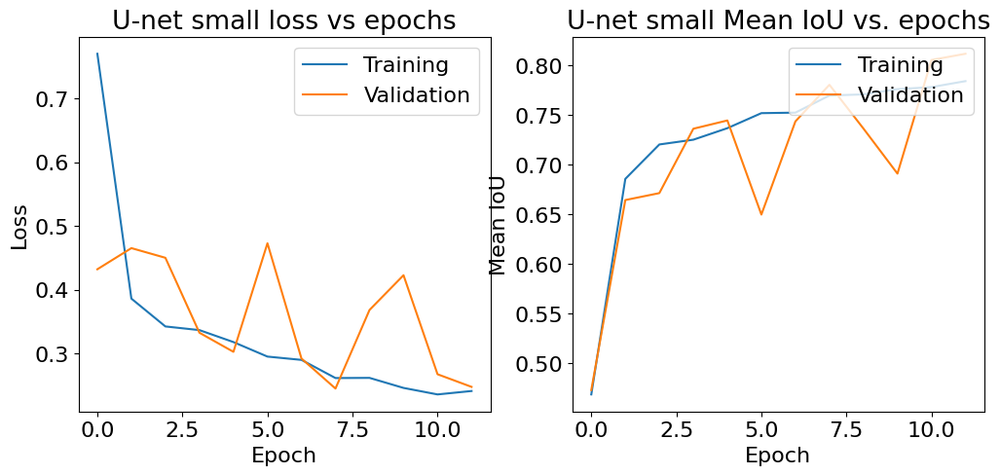

In [ ]:
# Plot learning curves
plot_learning_curves(history, 'U-net small')

In [ ]:
# Save model
model.save(os.path.join(modeling_path, 'CT','unet_small_raw.keras'))

1/1 [==============================] - 0s 282ms/step


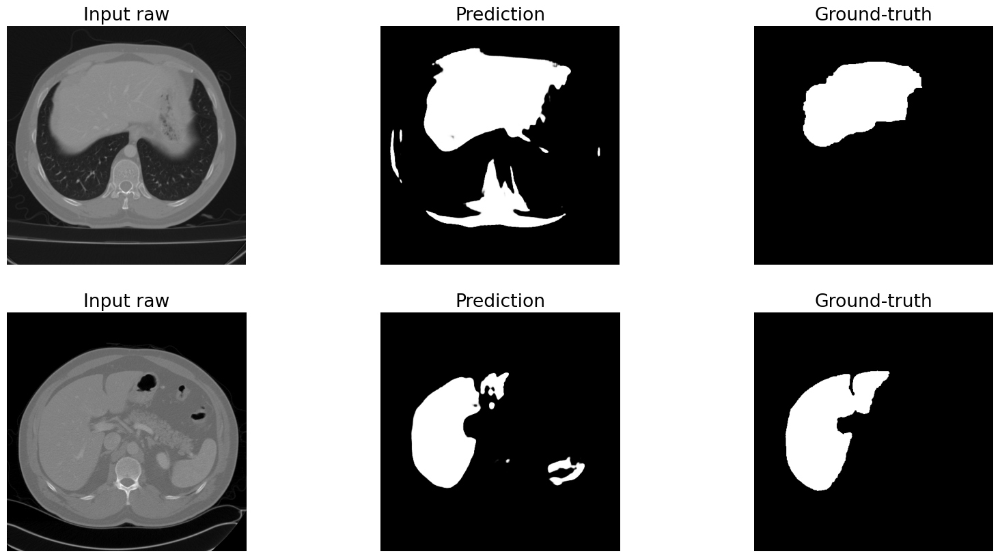

In [ ]:
# Graph predictions on unseen data
preds = model.predict(ct_test_raw.take(1))
for input, true in ct_test_raw.take(1):
  images = [input[0], preds[0], true[0], input[1], preds[1], true[1]]
  titles = ['Input raw', 'Prediction', 'Ground-truth', 'Input raw', 'Prediction', 'Ground-truth']
  plot_image_processing_results(images, titles)
  break

##### **U-net LARGE**

In [23]:
def unetbig_model(input_shape):
  inputs = tfkl.Input(shape=input_shape)

  # Encoder
  c1 = tfkl.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
  c1 = tfkl.Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
  p1 = tfkl.MaxPooling2D((2, 2))(c1)

  c2 = tfkl.Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
  c2 = tfkl.Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
  p2 = tfkl.MaxPooling2D((2, 2))(c2)

  c3 = tfkl.Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
  c3 = tfkl.Conv2D(256, (3, 3), activation='relu', padding='same')(c3)
  p3 = tfkl.MaxPooling2D((2, 2))(c3)

  c4 = tfkl.Conv2D(512, (3, 3), activation='relu', padding='same')(p3)
  c4 = tfkl.Conv2D(512, (3, 3), activation='relu', padding='same')(c4)
  p4 = tfkl.MaxPooling2D((2, 2))(c4)

  # Latent space
  c5 = tfkl.Conv2D(1024, (3, 3), activation='relu', padding='same')(p4)
  c5 = tfkl.Conv2D(1024, (3, 3), activation='relu', padding='same')(c5)

  # Decoder
  u6 = tfkl.Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(c5)
  u6 = tfkl.concatenate([u6, c4])
  c6 = tfkl.Conv2D(512, (3, 3), activation='relu', padding='same')(u6)
  c6 = tfkl.Conv2D(512, (3, 3), activation='relu', padding='same')(c6)

  u7 = tfkl.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(c6)
  u7 = tfkl.concatenate([u7, c3])
  c7 = tfkl.Conv2D(256, (3, 3), activation='relu', padding='same')(u7)
  c7 = tfkl.Conv2D(256, (3, 3), activation='relu', padding='same')(c7)

  u8 = tfkl.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c7)
  u8 = tfkl.concatenate([u8, c2])
  c8 = tfkl.Conv2D(128, (3, 3), activation='relu', padding='same')(u8)
  c8 = tfkl.Conv2D(128, (3, 3), activation='relu', padding='same')(c8)

  u9 = tfkl.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c8)
  u9 = tfkl.concatenate([u9, c1])
  c9 = tfkl.Conv2D(64, (3, 3), activation='relu', padding='same')(u9)
  c9 = tfkl.Conv2D(64, (3, 3), activation='relu', padding='same')(c9)

  outputs = tfkl.Conv2D(1, (1, 1), activation='sigmoid')(c9)

  model = tfk.models.Model(inputs=[inputs], outputs=[outputs])
  return model

In [ ]:
# Create and compile the model
model = unetbig_model(INPUT_SHAPE)
model.compile(optimizer=tfk.optimizers.Adam(LEARNING_RATE),
              loss=LOSS,
              metrics=[tfk.metrics.MeanIoU(num_classes=2), accuracy])

Model: "model_14"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_15 (InputLayer)       [(None, 512, 512, 1)]        0         []                            
                                                                                                  
 conv2d_214 (Conv2D)         (None, 512, 512, 64)         640       ['input_15[0][0]']            
                                                                                                  
 conv2d_215 (Conv2D)         (None, 512, 512, 64)         36928     ['conv2d_214[0][0]']          
                                                                                                  
 max_pooling2d_43 (MaxPooli  (None, 256, 256, 64)         0         ['conv2d_215[0][0]']          
 ng2D)                                                                                     

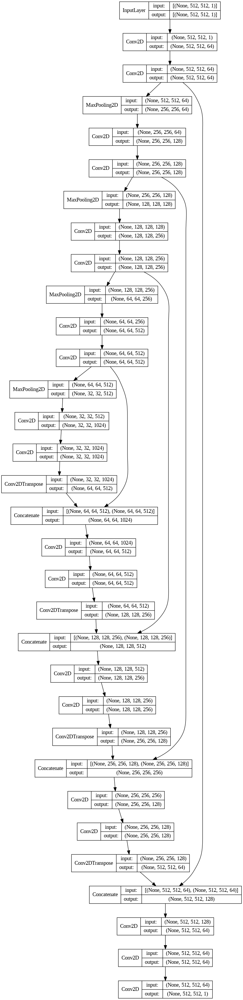

In [ ]:
# Print model summary
model.summary()
plot_model(model, show_shapes=True, show_layer_names=False)

In [ ]:
# Train the model
history = model.fit(
    ct_train_raw,
    epochs=EPOCHS,
    validation_data=ct_val_raw,
    callbacks=CALLBACKS,
    verbose=1
)

Epoch 1/10
148/148 [==============================] - 790s 3s/step - loss: 0.7465 - mean_io_u_10: 0.5177 - accuracy: 0.7417 - val_loss: 0.6281 - val_mean_io_u_10: 0.4986 - val_accuracy: 0.8913 - lr: 1.0000e-04
Epoch 2/10
148/148 [==============================] - 204s 1s/step - loss: 0.5813 - mean_io_u_10: 0.5798 - accuracy: 0.8813 - val_loss: 0.4932 - val_mean_io_u_10: 0.6454 - val_accuracy: 0.9316 - lr: 1.0000e-04
Epoch 3/10
148/148 [==============================] - 205s 1s/step - loss: 0.3182 - mean_io_u_10: 0.7300 - accuracy: 0.9548 - val_loss: 0.2530 - val_mean_io_u_10: 0.7906 - val_accuracy: 0.9731 - lr: 1.0000e-04
Epoch 4/10
148/148 [==============================] - 206s 1s/step - loss: 0.1915 - mean_io_u_10: 0.8274 - accuracy: 0.9755 - val_loss: 0.2238 - val_mean_io_u_10: 0.8153 - val_accuracy: 0.9733 - lr: 1.0000e-04
Epoch 5/10
148/148 [==============================] - 204s 1s/step - loss: 0.1442 - mean_io_u_10: 0.8649 - accuracy: 0.9820 - val_loss: 0.1576 - val_mean_io_u_1

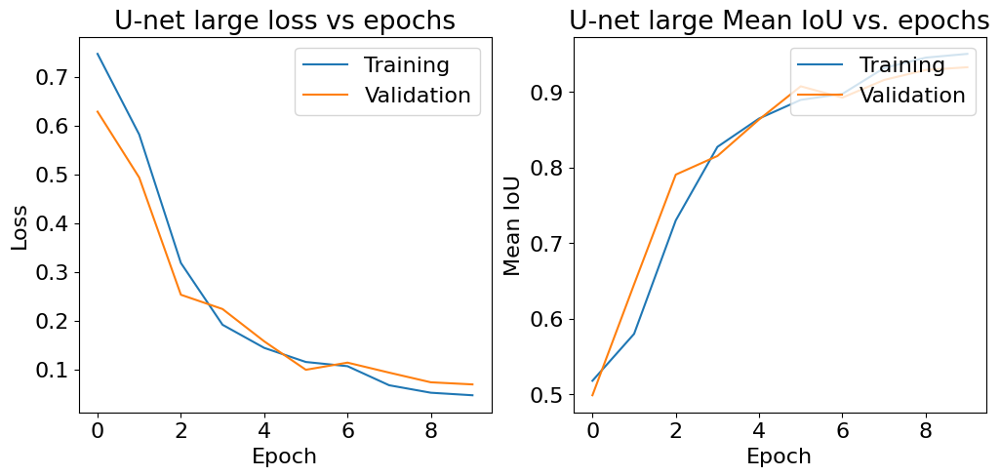

In [ ]:
# Plot learning curves
plot_learning_curves(history, 'U-net large')

In [ ]:
# Save model
model.save(os.path.join(modeling_path, 'CT','unet_large_raw.keras'))

1/1 [==============================] - 1s 596ms/step


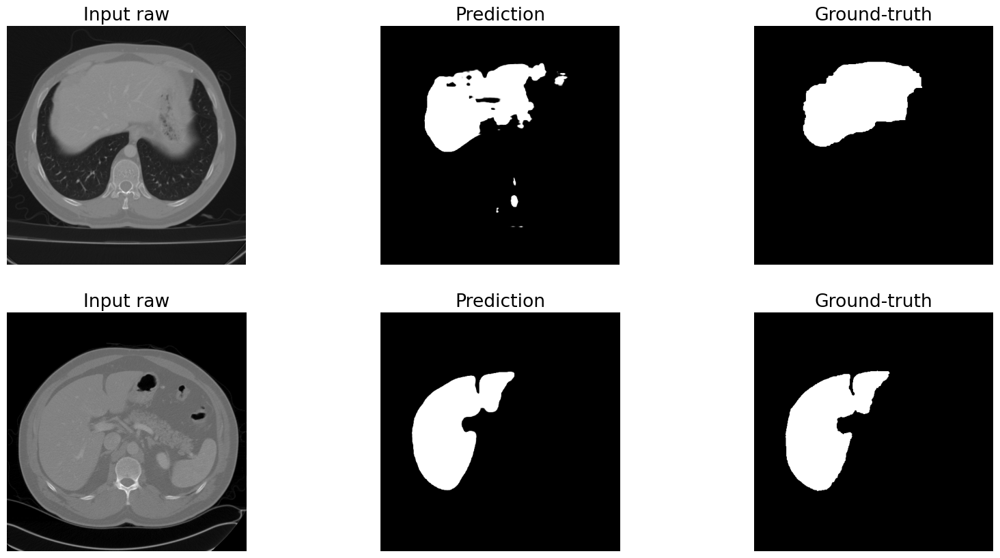

In [ ]:
# Graph predictions on unseen data
preds = model.predict(ct_test_raw.take(1))
for input, true in ct_test_raw.take(1):
  images = [input[0], preds[0], true[0], input[1], preds[1], true[1]]
  titles = ['Input raw', 'Prediction', 'Ground-truth', 'Input raw', 'Prediction', 'Ground-truth']
  plot_image_processing_results(images, titles)
  break

##### **U-net LARGE with preprocessed images**

In [ ]:
# Create and compile the model
model = unetbig_model(INPUT_SHAPE)
model.compile(optimizer=tfk.optimizers.Adam(LEARNING_RATE),
              loss=LOSS,
              metrics=METRICS)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 512, 512, 1)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 512, 512, 64)         640       ['input_1[0][0]']             
                                                                                                  
 conv2d_1 (Conv2D)           (None, 512, 512, 64)         36928     ['conv2d[0][0]']              
                                                                                                  
 max_pooling2d (MaxPooling2  (None, 256, 256, 64)         0         ['conv2d_1[0][0]']            
 D)                                                                                           

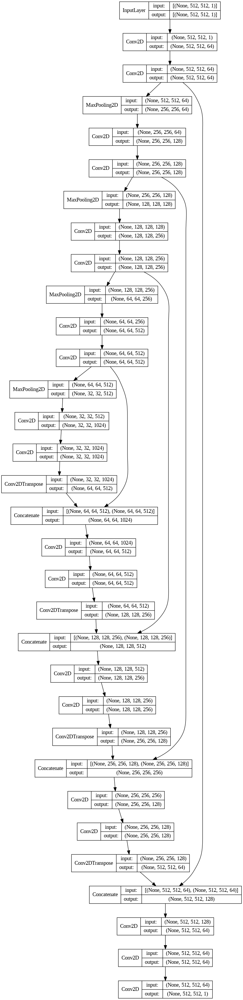

In [ ]:
# Print model summary
model.summary()
plot_model(model, show_shapes=True, show_layer_names=False)

In [ ]:
# Train the model
history = model.fit(
    ct_train_pre,
    epochs=EPOCHS,
    validation_data=ct_val_pre,
    callbacks=CALLBACKS,
    verbose=1
)

Epoch 1/12
148/148 [==============================] - 725s 2s/step - loss: 0.5418 - dice_coef: 0.4598 - ravd: 3.5645 - mean_io_u_1: 0.6490 - accuracy: 0.7884 - val_loss: 0.2720 - val_dice_coef: 0.7278 - val_ravd: 0.2948 - val_mean_io_u_1: 0.7783 - val_accuracy: 0.9685 - lr: 1.0000e-04
Epoch 2/12
148/148 [==============================] - 187s 1s/step - loss: 0.2068 - dice_coef: 0.7936 - ravd: 0.1630 - mean_io_u_1: 0.8206 - accuracy: 0.9745 - val_loss: 0.2286 - val_dice_coef: 0.7711 - val_ravd: 0.3735 - val_mean_io_u_1: 0.8153 - val_accuracy: 0.9728 - lr: 1.0000e-04
Epoch 3/12
148/148 [==============================] - 189s 1s/step - loss: 0.1344 - dice_coef: 0.8657 - ravd: 0.1008 - mean_io_u_1: 0.8749 - accuracy: 0.9837 - val_loss: 0.2342 - val_dice_coef: 0.7660 - val_ravd: 0.4934 - val_mean_io_u_1: 0.8090 - val_accuracy: 0.9706 - lr: 1.0000e-04
Epoch 4/12
148/148 [==============================] - 189s 1s/step - loss: 0.0867 - dice_coef: 0.9134 - ravd: 0.0531 - mean_io_u_1: 0.9116 - a

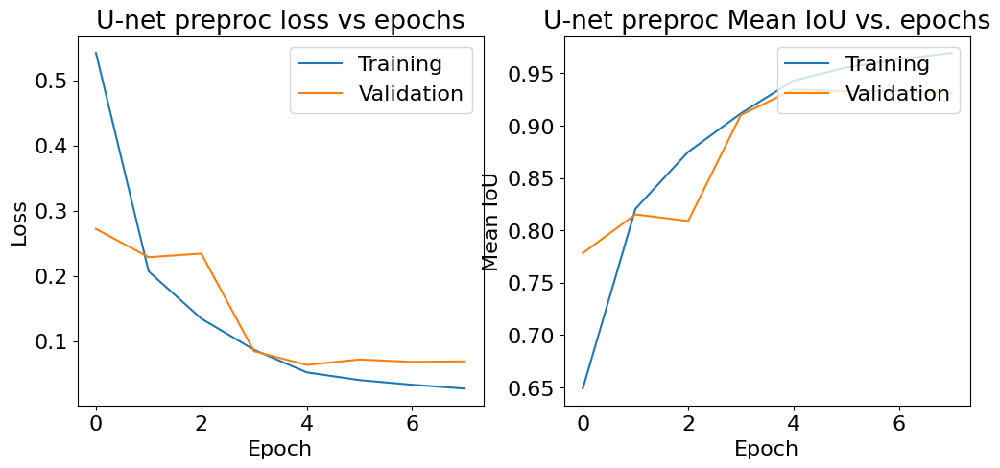

In [ ]:
# Plot learning curves
plot_learning_curves(history, 'U-net preproc')

In [ ]:
# Save model
model.save(os.path.join(modeling_path, 'CT','unet_large_pre.keras'))

1/1 [==============================] - 0s 89ms/step


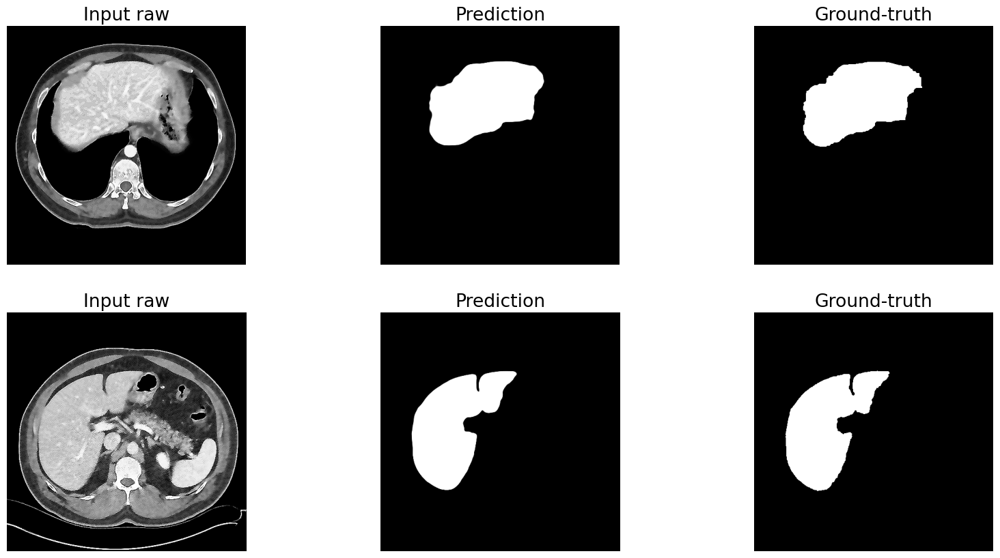

In [ ]:
# Graph predictions on unseen data
preds = model.predict(ct_test_pre.take(1))
for input, true in ct_test_pre.take(1):
  images = [input[0], preds[0], true[0], input[1], preds[1], true[1]]
  titles = ['Input raw', 'Prediction', 'Ground-truth', 'Input raw', 'Prediction', 'Ground-truth']
  plot_image_processing_results(images, titles)
  break

##### **TransU-Net with preprocessed images**

In [44]:
def transformer_block(x, num_heads, key_dim, ff_dim, rate=0.1):
  # Layer normalization
  x1 = tfkl.LayerNormalization(epsilon=1e-6)(x)
  # Multi-head self-attention
  attn_output = tfkl.MultiHeadAttention(num_heads=num_heads, key_dim=key_dim)(x1, x1)
  attn_output = tfkl.Add()([x, attn_output])
  # Feed-forward network
  x2 = tfkl.LayerNormalization(epsilon=1e-6)(attn_output)
  ff_output = tfk.Sequential([
      tfk.layers.Dense(ff_dim, activation='relu'),
      tfk.layers.Dense(x.shape[-1])
  ])(x2)
  ff_output = tfkl.Add()([attn_output, ff_output])
  return ff_output

def trans_unet(input_shape):
  inputs = tfkl.Input(shape=input_shape)

  # Encoder
  c1 = tfkl.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
  c1 = tfkl.Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
  p1 = tfkl.MaxPooling2D((2, 2))(c1)

  c2 = tfkl.Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
  c2 = tfkl.Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
  p2 = tfkl.MaxPooling2D((2, 2))(c2)

  c3 = tfkl.Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
  c3 = tfkl.Conv2D(256, (3, 3), activation='relu', padding='same')(c3)
  p3 = tfkl.MaxPooling2D((2, 2))(c3)

  c4 = tfkl.Conv2D(512, (3, 3), activation='relu', padding='same')(p3)
  c4 = tfkl.Conv2D(512, (3, 3), activation='relu', padding='same')(c4)
  p4 = tfkl.MaxPooling2D((2, 2))(c4)

  # Latent space with transformer block
  b0 = tfkl.Conv2D(1024, (3, 3), activation='relu', padding='same')(p4)
  b0 = tfkl.Conv2D(1024, (3, 3), activation='relu', padding='same')(b0)

  b0 = tfkl.Reshape((input_shape[0]//16 * input_shape[1]//16, 1024))(b0)
  b0 = transformer_block(b0, num_heads=4, key_dim=256, ff_dim=1024)
  b0 = tfkl.Reshape((input_shape[0]//16, input_shape[1]//16, 1024))(b0)

  # Decoder
  u1 = tfkl.Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(b0)
  u1 = tfkl.concatenate([u1, c4])
  c5 = tfkl.Conv2D(512, (3, 3), activation='relu', padding='same')(u1)
  c5 = tfkl.Conv2D(512, (3, 3), activation='relu', padding='same')(c5)

  u2 = tfkl.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(c5)
  u2 = tfkl.concatenate([u2, c3])
  c6 = tfkl.Conv2D(256, (3, 3), activation='relu', padding='same')(u2)
  c6 = tfkl.Conv2D(256, (3, 3), activation='relu', padding='same')(c6)

  u3 = tfkl.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c6)
  u3 = tfkl.concatenate([u3, c2])
  c7 = tfkl.Conv2D(128, (3, 3), activation='relu', padding='same')(u3)
  c7 = tfkl.Conv2D(128, (3, 3), activation='relu', padding='same')(c7)

  u4 = tfkl.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c7)
  u4 = tfkl.concatenate([u4, c1])
  c8 = tfkl.Conv2D(64, (3, 3), activation='relu', padding='same')(u4)
  c8 = tfkl.Conv2D(64, (3, 3), activation='relu', padding='same')(c8)

  outputs = tfkl.Conv2D(1, (1, 1), activation='sigmoid')(c8)

  model = tfk.models.Model(inputs, outputs)
  return model

In [ ]:
# Create and compile the model
model = trans_unet(INPUT_SHAPE)
model.compile(optimizer=tfk.optimizers.Adam(LEARNING_RATE),
              loss=LOSS,
              metrics=METRICS)

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 512, 512, 1)]        0         []                            
                                                                                                  
 conv2d_19 (Conv2D)          (None, 512, 512, 64)         640       ['input_2[0][0]']             
                                                                                                  
 conv2d_20 (Conv2D)          (None, 512, 512, 64)         36928     ['conv2d_19[0][0]']           
                                                                                                  
 max_pooling2d_4 (MaxPoolin  (None, 256, 256, 64)         0         ['conv2d_20[0][0]']           
 g2D)                                                                                       

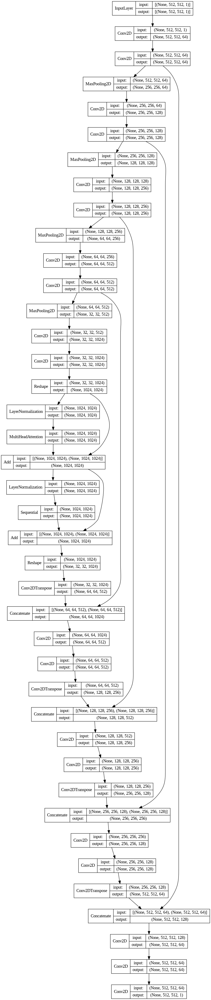

In [ ]:
# Print model summary
model.summary()
plot_model(model, show_shapes=True, show_layer_names=False)

In [ ]:
# Train the model
history = model.fit(
    ct_train_pre,
    epochs=EPOCHS,
    validation_data=ct_val_pre,
    callbacks=CALLBACKS,
    verbose=1
)

Epoch 1/12
148/148 [==============================] - 218s 1s/step - loss: 0.5154 - dice_coef: 0.4860 - ravd: 2.2596 - mean_io_u_1: 0.6009 - accuracy: 0.8706 - val_loss: 0.2375 - val_dice_coef: 0.7632 - val_ravd: 0.1689 - val_mean_io_u_1: 0.7821 - val_accuracy: 0.9744 - lr: 1.0000e-04
Epoch 2/12
148/148 [==============================] - 200s 1s/step - loss: 0.2185 - dice_coef: 0.7819 - ravd: 0.1941 - mean_io_u_1: 0.7840 - accuracy: 0.9728 - val_loss: 0.2106 - val_dice_coef: 0.7909 - val_ravd: 0.2227 - val_mean_io_u_1: 0.8214 - val_accuracy: 0.9770 - lr: 1.0000e-04
Epoch 3/12
148/148 [==============================] - 208s 1s/step - loss: 0.1307 - dice_coef: 0.8695 - ravd: 0.0954 - mean_io_u_1: 0.8561 - accuracy: 0.9840 - val_loss: 0.1483 - val_dice_coef: 0.8532 - val_ravd: 0.1891 - val_mean_io_u_1: 0.8716 - val_accuracy: 0.9840 - lr: 1.0000e-04
Epoch 4/12
148/148 [==============================] - 202s 1s/step - loss: 0.0851 - dice_coef: 0.9150 - ravd: 0.0685 - mean_io_u_1: 0.9038 - a

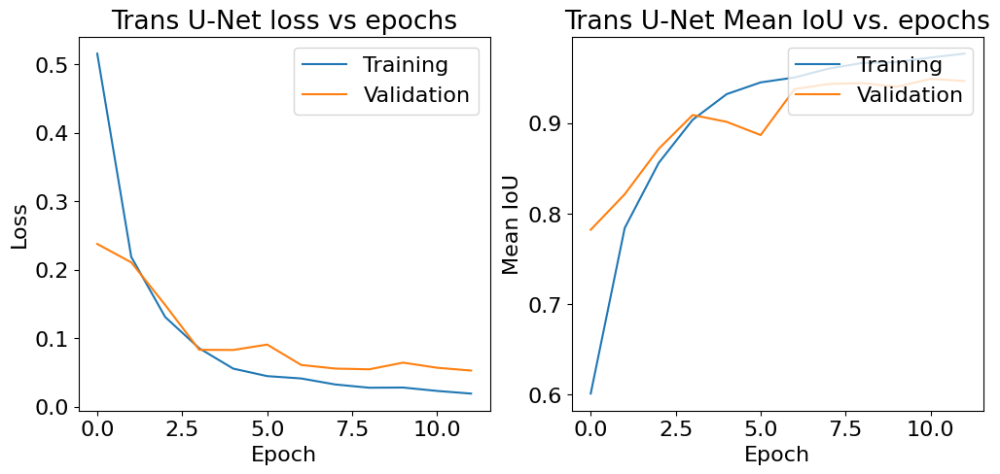

In [ ]:
# Plot learning curves
plot_learning_curves(history, 'Trans U-Net')

In [ ]:
# Save model
model.save(os.path.join(modeling_path, 'CT','trans_unet_pre.keras'))

1/1 [==============================] - 1s 935ms/step


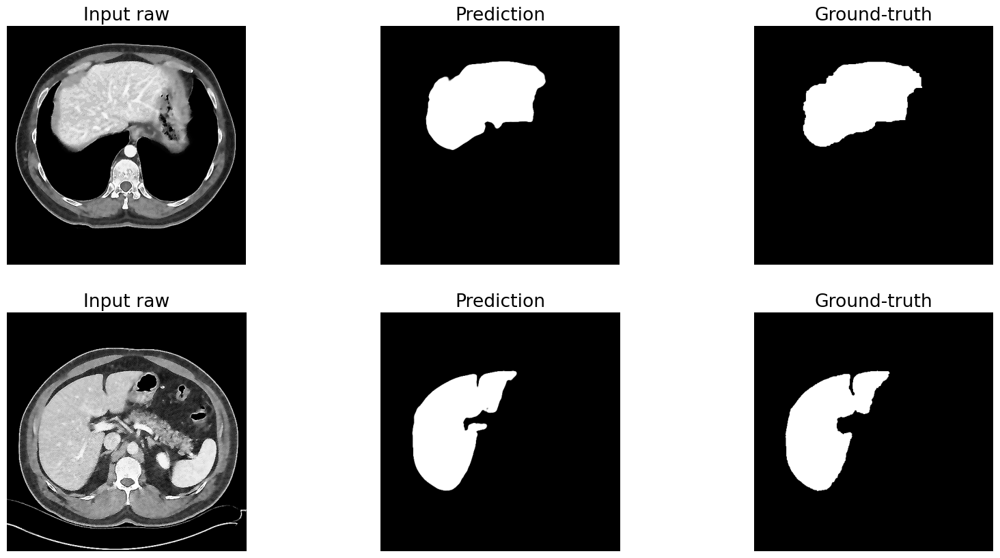

In [ ]:
# Graph predictions on unseen data
preds = model.predict(ct_test_pre.take(1))
for input, true in ct_test_pre.take(1):
  images = [input[0], preds[0], true[0], input[1], preds[1], true[1]]
  titles = ['Input raw', 'Prediction', 'Ground-truth', 'Input raw', 'Prediction', 'Ground-truth']
  plot_image_processing_results(images, titles)
  break

1/1 [==============================] - 0s 239ms/step


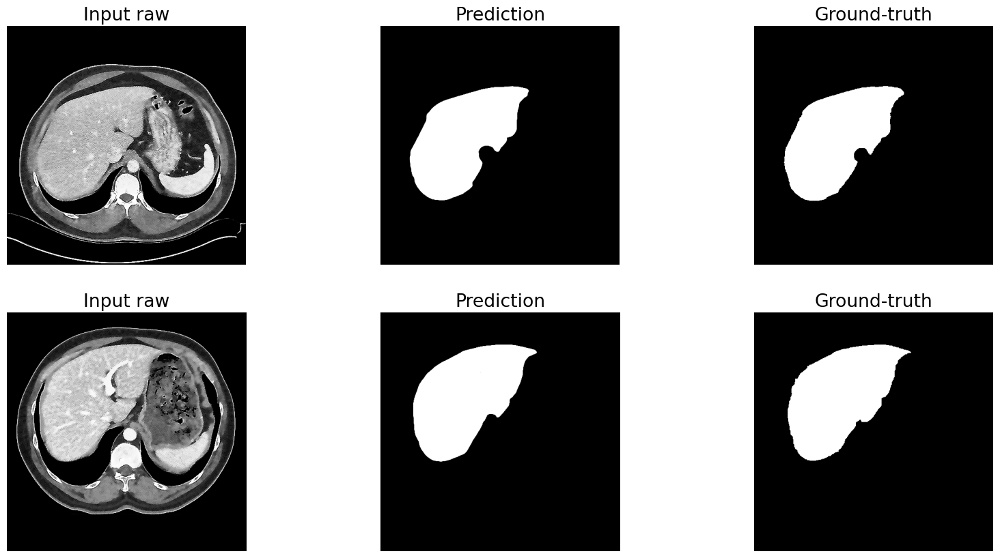

In [ ]:
# Graph predictions on unseen data
preds = model.predict(ct_test_pre.take(1))
for input, true in ct_test_pre.take(1):
  images = [input[10], preds[10], true[10], input[15], preds[15], true[15]]
  titles = ['Input raw', 'Prediction', 'Ground-truth', 'Input raw', 'Prediction', 'Ground-truth']
  plot_image_processing_results(images, titles)
  break

1/1 [==============================] - 0s 209ms/step


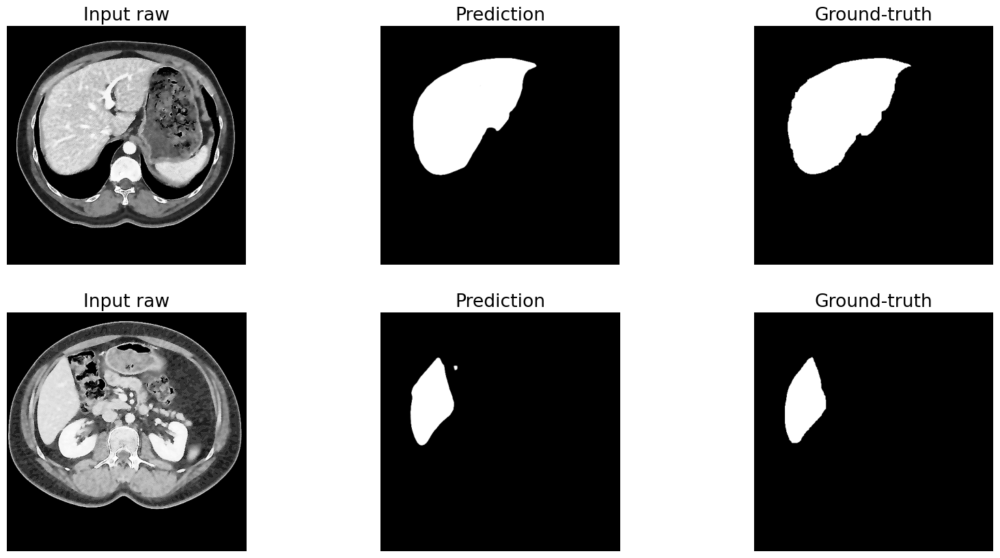

In [ ]:
# Graph predictions on unseen data
preds = model.predict(ct_test_pre.take(1))
for input, true in ct_test_pre.take(1):
  images = [input[15], preds[15], true[15], input[8], preds[8], true[8]]
  titles = ['Input raw', 'Prediction', 'Ground-truth', 'Input raw', 'Prediction', 'Ground-truth']
  plot_image_processing_results(images, titles)
  break

**Chosen model for liver segmentation (CT pre-processed images)**
- test DICE loss: 0.037
- test RAVD: 0.011
- test mean IoU: 0.96
- test accuracy: 0.994

#### MRI Segmentation of abdominal organs

- segmentation of solid abdominal organs (liver, spleen, kidneys) from MRI sequences
- dataset with MRI T1-DUAL (in-phase and out-phase) as well as T2-SPIR sequences

(Kavur et al., 2019)

T1DUAL
- **Input:** Pre-processed T1 (inphase + outphase) 2D images (256x256 x 2channels)

- **Output:** [0,1] mask for each organ (liver, right kidney, left kidney, spleen) segmentation (256x256 x 4channel)

T2SPIR
- **Input:** Pre-processed T2 2D images (256x256 x 2channels)

- **Output:** [0,1] mask for each organ (liver, right kidney, left kidney, spleen) segmentation (256x256 x 4channel)



##### **Load datasets**

In [20]:
BATCH_SIZE = 16

In [60]:
# T1DUAL dataset
t1_train = tf.data.Dataset.load(os.path.join(modeling_path, 'MR_T1DUAL', 'mr_t1dual_train'))
t1_train = t1_train.batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

t1_val = tf.data.Dataset.load(os.path.join(modeling_path, 'MR_T1DUAL', 'mr_t1dual_val'))
t1_val = t1_val.batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

t1_test = tf.data.Dataset.load(os.path.join(modeling_path, 'MR_T1DUAL', 'mr_t1dual_test'))
t1_test = t1_test.batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

In [17]:
# T2SPIR dataset
t2_train = tf.data.Dataset.load(os.path.join(modeling_path, 'MR_T2SPIR', 'mr_t2spir_train'))
t2_train = t2_train.batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

t2_val = tf.data.Dataset.load(os.path.join(modeling_path, 'MR_T2SPIR', 'mr_t2spir_val'))
t2_val = t2_val.batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

t2_test = tf.data.Dataset.load(os.path.join(modeling_path, 'MR_T2SPIR', 'mr_t2spir_test'))
t2_test = t2_test.batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

In [19]:
def dataset_liver_labels(images, labels):
  liber_labels =  labels[..., 1][:, :, None]
  return images, liber_labels

def dataset_rkidney_labels(images, labels):
  rkidney_labels =  labels[..., 2][:, :, None]
  return images, rkidney_labels

def dataset_lkidney_labels(images, labels):
  lkidney_labels =  labels[..., 3][:, :, None]
  return images, lkidney_labels

def dataset_spleen_labels(images, labels):
  spleen_labels =  labels[..., 4][:, :, None]
  return images, spleen_labels

##### **T1DUAL**

In [25]:
for input_images, output_images in t1_train.take(1):
    input_shape = input_images.shape
    output_shape = output_images.shape
    break

# Define input shape, output shape, batch size, and number of epochs
INPUT_SHAPE = input_shape[1:]
OUTPUT_SHAPE = output_shape[1:]
IMG_SIZE = input_shape[1]
BATCH_SIZE = input_shape[0]
EPOCHS = 20

# Print input shape, batch size, and number of epochs
print(f'Input Shape: {INPUT_SHAPE}, Output Shape: {OUTPUT_SHAPE}, Batch Size: {BATCH_SIZE}, Epochs: {EPOCHS}')

Input Shape: (256, 256, 2), Output Shape: (256, 256, 1), Batch Size: 16, Epochs: 20


###### **Autoencoder model**

In [7]:
def autoencoder_multi_model(input_shape, output_shape):
  inputs = tfkl.Input(shape=input_shape)

  # Encoder
  x = tfkl.Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
  x = tfkl.MaxPooling2D((2, 2), padding='same')(x)
  x = tfkl.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
  x = tfkl.MaxPooling2D((2, 2), padding='same')(x)
  x = tfkl.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
  x = tfkl.MaxPooling2D((2, 2), padding='same')(x)
  x = tfkl.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
  x = tfkl.MaxPooling2D((2, 2), padding='same')(x)
  x = tfkl.Conv2D(512, (3, 3), activation='relu', padding='same')(x)
  encoded = tfkl.MaxPooling2D((2, 2), padding='same')(x)

  # Decoder
  x = tfkl.Conv2D(512, (3, 3), activation='relu', padding='same')(encoded)
  x = tfkl.UpSampling2D((2, 2))(x)
  x = tfkl.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
  x = tfkl.UpSampling2D((2, 2))(x)
  x = tfkl.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
  x = tfkl.UpSampling2D((2, 2))(x)
  x = tfkl.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
  x = tfkl.UpSampling2D((2, 2))(x)
  x = tfkl.Conv2D(32, (3, 3), activation='relu', padding='same')(x)
  x = tfkl.UpSampling2D((2, 2))(x)
  decoded = tfkl.Conv2D(output_shape[-1], (3, 3), activation='softmax', padding='same')(x)

  model = tfk.models.Model(inputs, decoded)
  return model

In [ ]:
# Create and compile the model
model = autoencoder_multi_model(INPUT_SHAPE, OUTPUT_SHAPE)
model.compile(optimizer=tfk.optimizers.Adam(LEARNING_RATE),
              loss=LOSS_MULTI,
              metrics=METRICS_MULTI)

Model: "model_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 256, 256, 2)]     0         
                                                                 
 conv2d_77 (Conv2D)          (None, 256, 256, 32)      608       
                                                                 
 max_pooling2d_35 (MaxPooli  (None, 128, 128, 32)      0         
 ng2D)                                                           
                                                                 
 conv2d_78 (Conv2D)          (None, 128, 128, 64)      18496     
                                                                 
 max_pooling2d_36 (MaxPooli  (None, 64, 64, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_79 (Conv2D)          (None, 64, 64, 128)       7385

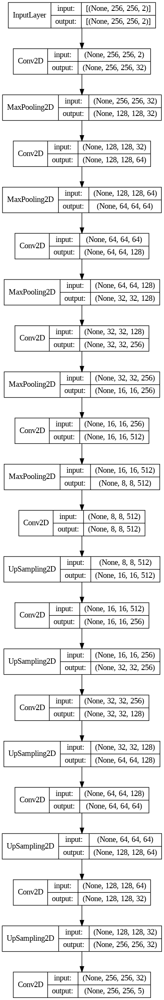

In [ ]:
# Print model summary
model.summary()
plot_model(model, show_shapes=True, show_layer_names=False)

In [ ]:
# Train the model
history = model.fit(
    t1_train,
    shuffle=True,
    epochs=EPOCHS,
    validation_data=t1_val,
    calbacks=CALLBACKS,
    verbose=1
)

Epoch 1/20
32/32 [==============================] - 10s 146ms/step - loss: 3.8962 - dice_coef_multi: 0.1038 - mean_io_u_4: 0.4000 - liver_dice_coef: 0.0805 - rkidney_dice_coef: 0.0055 - lkidney_dice_coef: 0.0054 - spleen_dice_coef: 0.0124 - val_loss: 3.8151 - val_dice_coef_multi: 0.1849 - val_mean_io_u_4: 0.4000 - val_liver_dice_coef: 0.1661 - val_rkidney_dice_coef: 0.0035 - val_lkidney_dice_coef: 0.0023 - val_spleen_dice_coef: 0.0131
Epoch 2/20
32/32 [==============================] - 4s 125ms/step - loss: 3.7364 - dice_coef_multi: 0.2636 - mean_io_u_4: 0.4001 - liver_dice_coef: 0.2279 - rkidney_dice_coef: 0.0040 - lkidney_dice_coef: 0.0031 - spleen_dice_coef: 0.0287 - val_loss: 3.6177 - val_dice_coef_multi: 0.3823 - val_mean_io_u_4: 0.4029 - val_liver_dice_coef: 0.3458 - val_rkidney_dice_coef: 8.6982e-05 - val_lkidney_dice_coef: 2.3402e-04 - val_spleen_dice_coef: 0.0362
Epoch 3/20
32/32 [==============================] - 4s 133ms/step - loss: 3.5577 - dice_coef_multi: 0.4423 - mean_i

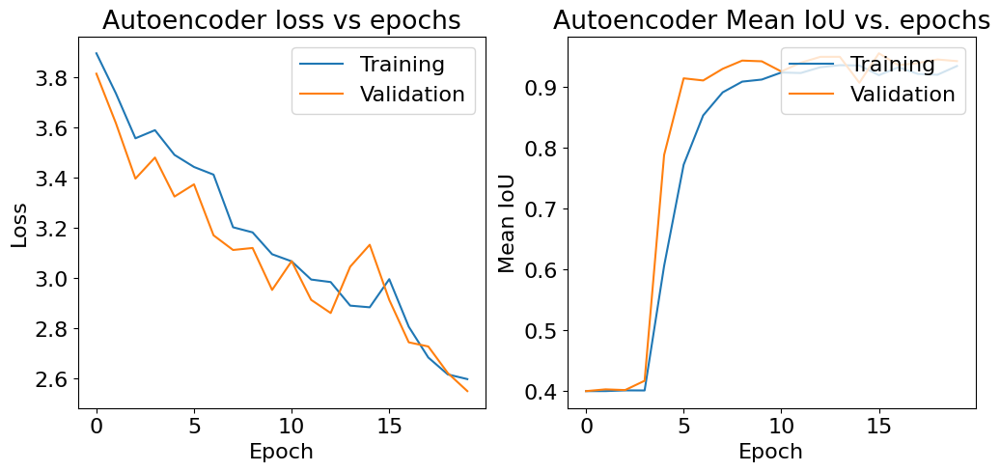

In [ ]:
# Plot learning curves
plot_learning_curves(history, 'Autoencoder')

In [ ]:
# Save model
model.save(os.path.join(modeling_path, 'MR_T1DUAL','t1_autoencoder.keras'))

1/1 [==============================] - 0s 275ms/step


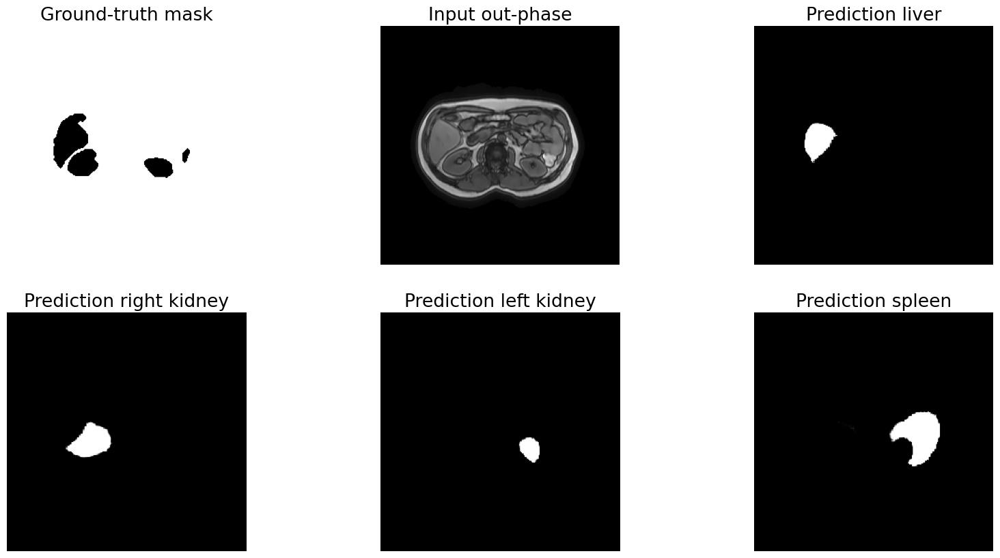

In [ ]:
# Graph predictions on unseen data
preds = model.predict(t1_test.take(1))
for input, true in t1_test.take(1):
  images = [true[15,:,:,0], input[15,:,:,1], preds[15,:,:,1], preds[15,:,:,2], preds[15,:,:,3], preds[15,:,:,4]]
  titles = ['Ground-truth mask', 'Input out-phase', 'Prediction liver', 'Prediction right kidney', 'Prediction left kidney', 'Prediction spleen']
  plot_image_processing_results(images, titles)
  break

###### **U-net SMALL**

In [15]:
def unetsmall_multi_model(input_shape, output_shape):
  inputs = tfkl.Input(shape=input_shape)

  # Encoder
  c1 = tfkl.Conv2D(16, (3, 3), activation='relu', padding='same')(inputs)
  c1 = tfkl.Conv2D(16, (3, 3), activation='relu', padding='same')(c1)
  p1 = tfkl.MaxPooling2D((2, 2))(c1)

  c2 = tfkl.Conv2D(32, (3, 3), activation='relu', padding='same')(p1)
  c2 = tfkl.Conv2D(32, (3, 3), activation='relu', padding='same')(c2)
  p2 = tfkl.MaxPooling2D((2, 2))(c2)

  c3 = tfkl.Conv2D(64, (3, 3), activation='relu', padding='same')(p2)
  c3 = tfkl.Conv2D(64, (3, 3), activation='relu', padding='same')(c3)
  p3 = tfkl.MaxPooling2D((2, 2))(c3)

  # Latent space
  c4 = tfkl.Conv2D(128, (3, 3), activation='relu', padding='same')(p3)
  c4 = tfkl.Conv2D(128, (3, 3), activation='relu', padding='same')(c4)

  # Decoder
  u5 = tfkl.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c4)
  u5 = tfkl.concatenate([u5, c3])
  c5 = tfkl.Conv2D(64, (3, 3), activation='relu', padding='same')(u5)
  c5 = tfkl.Conv2D(64, (3, 3), activation='relu', padding='same')(c5)

  u6 = tfkl.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c5)
  u6 = tfkl.concatenate([u6, c2])
  c6 = tfkl.Conv2D(32, (3, 3), activation='relu', padding='same')(u6)
  c6 = tfkl.Conv2D(32, (3, 3), activation='relu', padding='same')(c6)

  u7 = tfkl.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c6)
  u7 = tfkl.concatenate([u7, c1])
  c7 = tfkl.Conv2D(16, (3, 3), activation='relu', padding='same')(u7)
  c7 = tfkl.Conv2D(16, (3, 3), activation='relu', padding='same')(c7)


  outputs = tfkl.Conv2D(output_shape[-1], (1, 1), activation='softmax')(c7)

  model = tfk.models.Model(inputs=[inputs], outputs=[outputs])
  return model

In [ ]:
# Create and compile the vanilla U-net model
model = unetsmall_multi_model(INPUT_SHAPE, OUTPUT_SHAPE)
model.compile(optimizer=tfk.optimizers.Adam(LEARNING_RATE),
              loss=LOSS_MULTI,
              metrics=METRICS_MULTI)

Model: "model_10"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_11 (InputLayer)       [(None, 256, 256, 2)]        0         []                            
                                                                                                  
 conv2d_122 (Conv2D)         (None, 256, 256, 16)         304       ['input_11[0][0]']            
                                                                                                  
 conv2d_123 (Conv2D)         (None, 256, 256, 16)         2320      ['conv2d_122[0][0]']          
                                                                                                  
 max_pooling2d_47 (MaxPooli  (None, 128, 128, 16)         0         ['conv2d_123[0][0]']          
 ng2D)                                                                                     

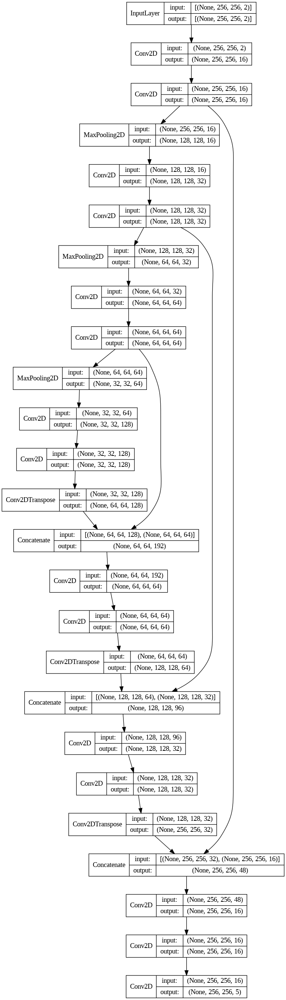

In [ ]:
# Print model summary
model.summary()
plot_model(model, show_shapes=True, show_layer_names=False)

In [ ]:
# Train the model
history = model.fit(
    t1_train,
    shuffle=True,
    epochs=EPOCHS,
    validation_data=t1_val,
    callbacks=CALLBACKS,
    verbose=1
)

Epoch 1/20
32/32 [==============================] - 13s 196ms/step - loss: 3.9222 - dice_coef_multi: 0.0778 - mean_io_u_4: 0.4450 - liver_dice_coef: 0.0533 - rkidney_dice_coef: 0.0065 - lkidney_dice_coef: 0.0069 - spleen_dice_coef: 0.0111 - val_loss: 3.9267 - val_dice_coef_multi: 0.0733 - val_mean_io_u_4: 0.4000 - val_liver_dice_coef: 0.0517 - val_rkidney_dice_coef: 0.0070 - val_lkidney_dice_coef: 0.0074 - val_spleen_dice_coef: 0.0072 - lr: 1.0000e-04
Epoch 2/20
32/32 [==============================] - 6s 188ms/step - loss: 3.9207 - dice_coef_multi: 0.0793 - mean_io_u_4: 0.4000 - liver_dice_coef: 0.0551 - rkidney_dice_coef: 0.0063 - lkidney_dice_coef: 0.0069 - spleen_dice_coef: 0.0110 - val_loss: 3.9229 - val_dice_coef_multi: 0.0771 - val_mean_io_u_4: 0.4000 - val_liver_dice_coef: 0.0562 - val_rkidney_dice_coef: 0.0065 - val_lkidney_dice_coef: 0.0074 - val_spleen_dice_coef: 0.0070 - lr: 1.0000e-04
Epoch 3/20
32/32 [==============================] - 6s 177ms/step - loss: 3.9043 - dice_c

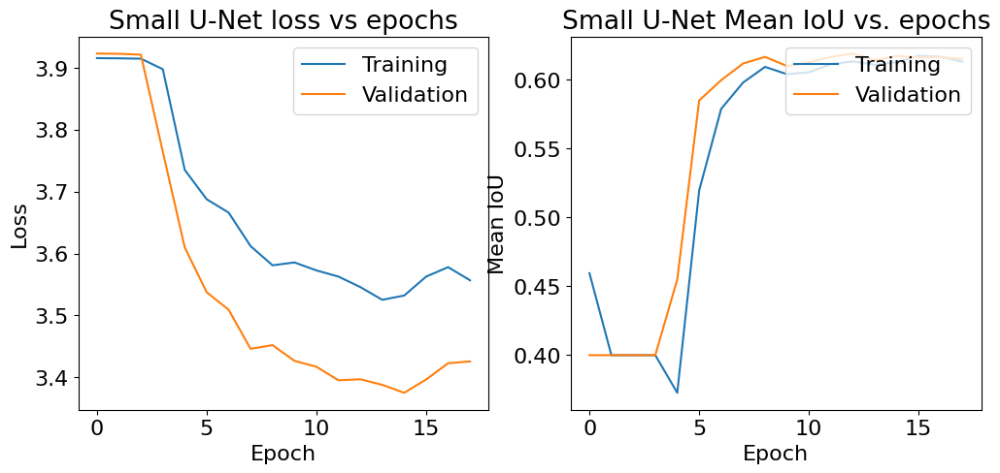

In [ ]:
# Plot learning curves
plot_learning_curves(history, 'Small U-Net')

In [ ]:
# Save model
model.save(os.path.join(modeling_path, 'MR_T1DUAL','t1_unet_small.keras'))

1/1 [==============================] - 1s 646ms/step


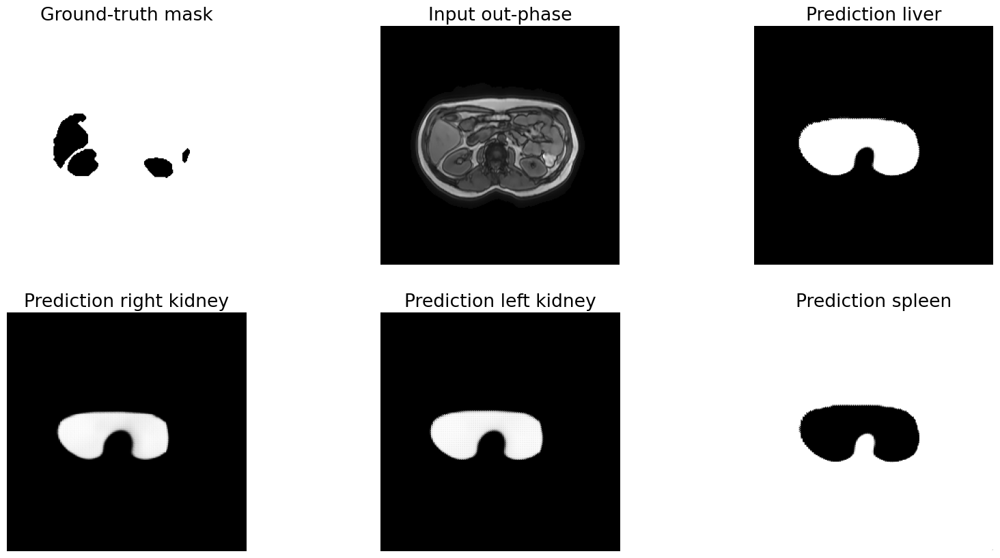

In [ ]:
# Graph predictions on unseen data
preds = model.predict(t1_test.take(1))
for input, true in t1_test.take(1):
  images = [true[15,:,:,0], input[15,:,:,1], preds[15,:,:,1], preds[15,:,:,2], preds[15,:,:,3], preds[15,:,:,4]]
  titles = ['Ground-truth mask', 'Input out-phase', 'Prediction liver', 'Prediction right kidney', 'Prediction left kidney', 'Prediction spleen']
  plot_image_processing_results(images, titles)
  break

###### **U-net LARGE**

In [34]:
def unetbig_multi_model(input_shape, output_shape):
  inputs = tfkl.Input(shape=input_shape)

  # Encoder
  c1 = tfkl.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
  c1 = tfkl.Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
  p1 = tfkl.MaxPooling2D((2, 2))(c1)

  c2 = tfkl.Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
  c2 = tfkl.Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
  p2 = tfkl.MaxPooling2D((2, 2))(c2)

  c3 = tfkl.Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
  c3 = tfkl.Conv2D(256, (3, 3), activation='relu', padding='same')(c3)
  p3 = tfkl.MaxPooling2D((2, 2))(c3)

  c4 = tfkl.Conv2D(512, (3, 3), activation='relu', padding='same')(p3)
  c4 = tfkl.Conv2D(512, (3, 3), activation='relu', padding='same')(c4)
  p4 = tfkl.MaxPooling2D((2, 2))(c4)

  # Latent space
  c5 = tfkl.Conv2D(1024, (3, 3), activation='relu', padding='same')(p4)
  c5 = tfkl.Conv2D(1024, (3, 3), activation='relu', padding='same')(c5)

  # Decoder
  u6 = tfkl.Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(c5)
  u6 = tfkl.concatenate([u6, c4])
  c6 = tfkl.Conv2D(512, (3, 3), activation='relu', padding='same')(u6)
  c6 = tfkl.Conv2D(512, (3, 3), activation='relu', padding='same')(c6)

  u7 = tfkl.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(c6)
  u7 = tfkl.concatenate([u7, c3])
  c7 = tfkl.Conv2D(256, (3, 3), activation='relu', padding='same')(u7)
  c7 = tfkl.Conv2D(256, (3, 3), activation='relu', padding='same')(c7)

  u8 = tfkl.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c7)
  u8 = tfkl.concatenate([u8, c2])
  c8 = tfkl.Conv2D(128, (3, 3), activation='relu', padding='same')(u8)
  c8 = tfkl.Conv2D(128, (3, 3), activation='relu', padding='same')(c8)

  u9 = tfkl.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c8)
  u9 = tfkl.concatenate([u9, c1])
  c9 = tfkl.Conv2D(64, (3, 3), activation='relu', padding='same')(u9)
  c9 = tfkl.Conv2D(64, (3, 3), activation='relu', padding='same')(c9)

  outputs = tfkl.Conv2D(output_shape[-1], (1, 1), activation='softmax')(c9)

  model = tfk.models.Model(inputs=[inputs], outputs=[outputs])
  return model

In [ ]:
# Create and compile the vanilla U-net model
model = unetbig_multi_model(INPUT_SHAPE, OUTPUT_SHAPE)
model.compile(optimizer=tfk.optimizers.Adam(LEARNING_RATE),
              loss=LOSS_MULTI,
              metrics=METRICS_MULTI)

Model: "model_9"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_10 (InputLayer)       [(None, 256, 256, 2)]        0         []                            
                                                                                                  
 conv2d_103 (Conv2D)         (None, 256, 256, 64)         1216      ['input_10[0][0]']            
                                                                                                  
 conv2d_104 (Conv2D)         (None, 256, 256, 64)         36928     ['conv2d_103[0][0]']          
                                                                                                  
 max_pooling2d_43 (MaxPooli  (None, 128, 128, 64)         0         ['conv2d_104[0][0]']          
 ng2D)                                                                                      

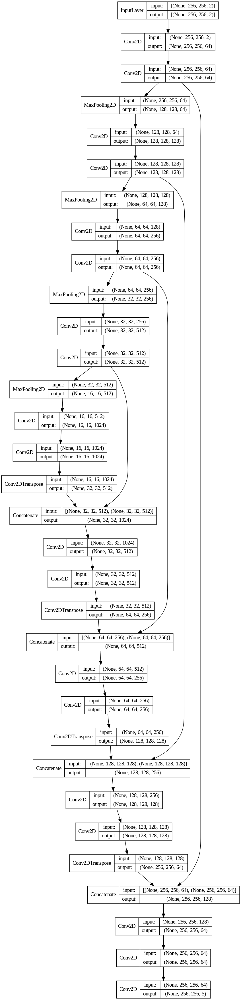

In [ ]:
# Print model summary
model.summary()
plot_model(model, show_shapes=True, show_layer_names=False)

In [ ]:
# Train the model
history = model.fit(
    t1_train,
    shuffle=True,
    epochs=EPOCHS,
    validation_data=t1_val,
    callbacks=CALLBACKS,
    verbose=1
)

Epoch 1/20
32/32 [==============================] - 24s 735ms/step - loss: 3.6134 - dice_coef_multi: 0.3866 - mean_io_u_4: 0.6020 - liver_dice_coef: 2.0210e-11 - rkidney_dice_coef: 0.1875 - lkidney_dice_coef: 0.1875 - spleen_dice_coef: 0.0116 - val_loss: 3.2425 - val_dice_coef_multi: 0.7575 - val_mean_io_u_4: 0.6036 - val_liver_dice_coef: 3.7475e-12 - val_rkidney_dice_coef: 0.5000 - val_lkidney_dice_coef: 0.2500 - val_spleen_dice_coef: 0.0075 - lr: 1.0000e-05
Epoch 2/20
32/32 [==============================] - 23s 722ms/step - loss: 3.6134 - dice_coef_multi: 0.3866 - mean_io_u_4: 0.6020 - liver_dice_coef: 2.0210e-11 - rkidney_dice_coef: 0.1875 - lkidney_dice_coef: 0.1875 - spleen_dice_coef: 0.0116 - val_loss: 3.2425 - val_dice_coef_multi: 0.7575 - val_mean_io_u_4: 0.6036 - val_liver_dice_coef: 3.7475e-12 - val_rkidney_dice_coef: 0.5000 - val_lkidney_dice_coef: 0.2500 - val_spleen_dice_coef: 0.0075 - lr: 1.0000e-05
Epoch 3/20
32/32 [==============================] - 23s 704ms/step - los

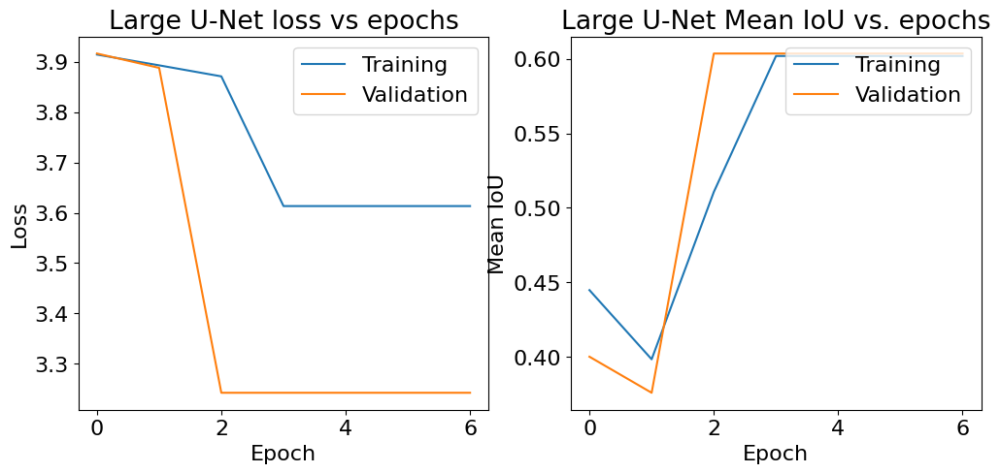

In [ ]:
# Plot learning curves
plot_learning_curves(history, 'Large U-Net')

In [ ]:
# Save model
model.save(os.path.join(modeling_path, 'MR_T1DUAL','t1_unet_large.keras'))

1/1 [==============================] - 0s 73ms/step


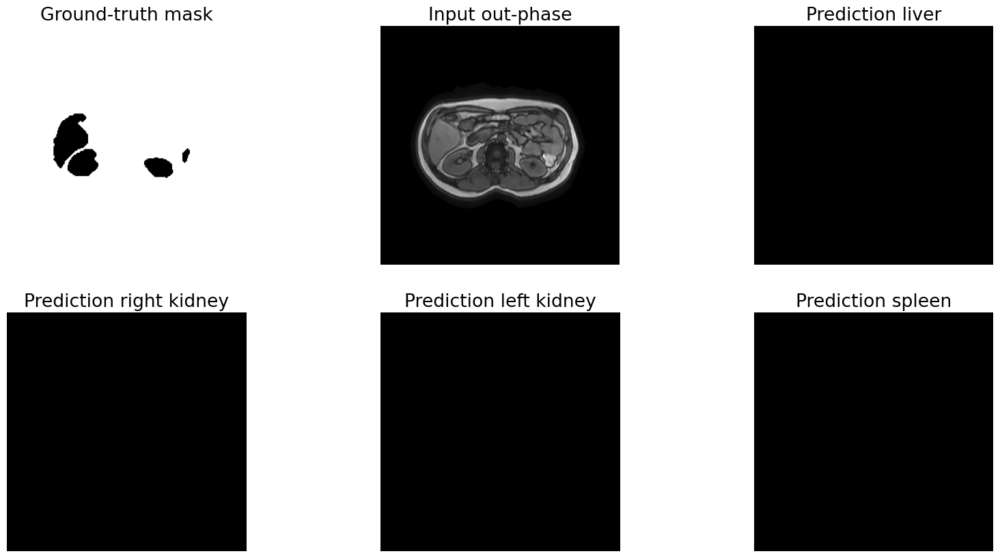

In [ ]:
# Graph predictions on unseen data
preds = model.predict(t1_test.take(1))
for input, true in t1_test.take(1):
  images = [true[15,:,:,0], input[15,:,:,1], preds[15,:,:,1], preds[15,:,:,2], preds[15,:,:,3], preds[15,:,:,4]]
  titles = ['Ground-truth mask', 'Input out-phase', 'Prediction liver', 'Prediction right kidney', 'Prediction left kidney', 'Prediction spleen']
  plot_image_processing_results(images, titles)
  break

###### **Trans U-net**

In [42]:
def trans_unet_multi(input_shape, output_shape):
  inputs = tfkl.Input(shape=input_shape)

  # Encoder
  c1 = tfkl.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
  c1 = tfkl.Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
  p1 = tfkl.MaxPooling2D((2, 2))(c1)

  c2 = tfkl.Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
  c2 = tfkl.Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
  p2 = tfkl.MaxPooling2D((2, 2))(c2)

  c3 = tfkl.Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
  c3 = tfkl.Conv2D(256, (3, 3), activation='relu', padding='same')(c3)
  p3 = tfkl.MaxPooling2D((2, 2))(c3)

  c4 = tfkl.Conv2D(512, (3, 3), activation='relu', padding='same')(p3)
  c4 = tfkl.Conv2D(512, (3, 3), activation='relu', padding='same')(c4)
  p4 = tfkl.MaxPooling2D((2, 2))(c4)

  # Latent space with transformer block
  b0 = tfkl.Conv2D(1024, (3, 3), activation='relu', padding='same')(p4)
  b0 = tfkl.Conv2D(1024, (3, 3), activation='relu', padding='same')(b0)

  b0 = tfkl.Reshape((input_shape[0]//16 * input_shape[1]//16, 1024))(b0)
  b0 = transformer_block(b0, num_heads=4, key_dim=256, ff_dim=1024)
  b0 = tfkl.Reshape((input_shape[0]//16, input_shape[1]//16, 1024))(b0)

  # Decoder
  u1 = tfkl.Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(b0)
  u1 = tfkl.concatenate([u1, c4])
  c5 = tfkl.Conv2D(512, (3, 3), activation='relu', padding='same')(u1)
  c5 = tfkl.Conv2D(512, (3, 3), activation='relu', padding='same')(c5)

  u2 = tfkl.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(c5)
  u2 = tfkl.concatenate([u2, c3])
  c6 = tfkl.Conv2D(256, (3, 3), activation='relu', padding='same')(u2)
  c6 = tfkl.Conv2D(256, (3, 3), activation='relu', padding='same')(c6)

  u3 = tfkl.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c6)
  u3 = tfkl.concatenate([u3, c2])
  c7 = tfkl.Conv2D(128, (3, 3), activation='relu', padding='same')(u3)
  c7 = tfkl.Conv2D(128, (3, 3), activation='relu', padding='same')(c7)

  u4 = tfkl.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c7)
  u4 = tfkl.concatenate([u4, c1])
  c8 = tfkl.Conv2D(64, (3, 3), activation='relu', padding='same')(u4)
  c8 = tfkl.Conv2D(64, (3, 3), activation='relu', padding='same')(c8)

  outputs = tfkl.Conv2D(output_shape[-1], (1, 1), activation='softmax')(c8)

  model = tfk.models.Model(inputs, outputs)
  return model

In [34]:
# Create and compile the vanilla U-net model
model = trans_unet_multi(INPUT_SHAPE, OUTPUT_SHAPE)
model.compile(optimizer=tfk.optimizers.Adam(LEARNING_RATE),
              loss=LOSS_MULTI,
              metrics=METRICS_MULTI)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 256, 256, 2)]        0         []                            
                                                                                                  
 conv2d_10 (Conv2D)          (None, 256, 256, 64)         1216      ['input_2[0][0]']             
                                                                                                  
 conv2d_11 (Conv2D)          (None, 256, 256, 64)         36928     ['conv2d_10[0][0]']           
                                                                                                  
 max_pooling2d_4 (MaxPoolin  (None, 128, 128, 64)         0         ['conv2d_11[0][0]']           
 g2D)                                                                                         

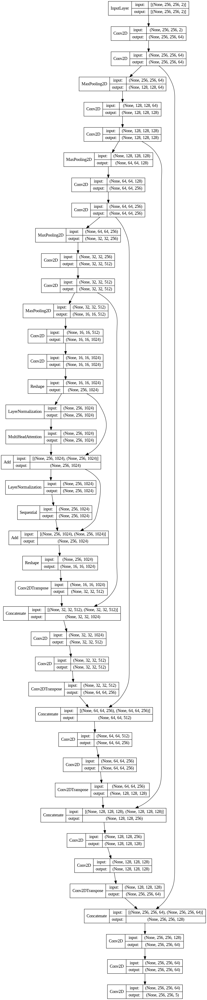

In [35]:
# Print model summary
model.summary()
plot_model(model, show_shapes=True, show_layer_names=False)

In [36]:
# Train the model
history = model.fit(
    t1_train,
    shuffle=True,
    epochs=EPOCHS,
    validation_data=t1_val,
    callbacks=CALLBACKS,
    verbose=1
)

Epoch 1/20
32/32 [==============================] - 76s 871ms/step - loss: 0.8312 - dice_coef_multi: 0.0423 - mean_io_u_1: 0.7032 - liver_dice_coef: 0.0171 - rkidney_dice_coef: 0.0024 - lkidney_dice_coef: 0.0025 - spleen_dice_coef: 0.0204 - val_loss: 0.6576 - val_dice_coef_multi: 0.3580 - val_mean_io_u_1: 0.9513 - val_liver_dice_coef: 3.7475e-12 - val_rkidney_dice_coef: 0.1082 - val_lkidney_dice_coef: 0.2497 - val_spleen_dice_coef: 6.2716e-11 - lr: 1.0000e-04
Epoch 2/20
32/32 [==============================] - 25s 781ms/step - loss: 0.7109 - dice_coef_multi: 0.4687 - mean_io_u_1: 0.9455 - liver_dice_coef: 2.0210e-11 - rkidney_dice_coef: 0.1875 - lkidney_dice_coef: 0.1875 - spleen_dice_coef: 0.0938 - val_loss: 0.6541 - val_dice_coef_multi: 0.7500 - val_mean_io_u_1: 0.9513 - val_liver_dice_coef: 3.7475e-12 - val_rkidney_dice_coef: 0.5000 - val_lkidney_dice_coef: 0.2500 - val_spleen_dice_coef: 6.2716e-11 - lr: 1.0000e-04
Epoch 3/20
32/32 [==============================] - 25s 775ms/step -

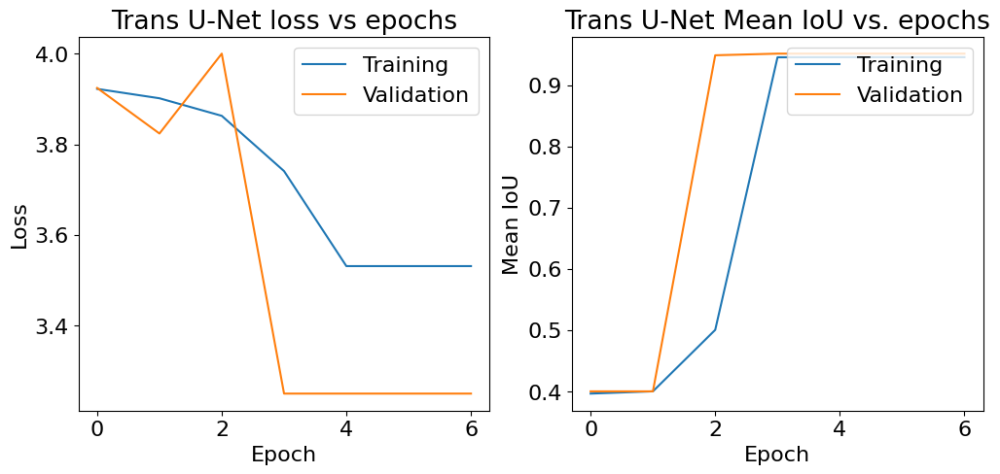

In [ ]:
# Plot learning curves
plot_learning_curves(history, 'Trans U-Net')

In [ ]:
# Save model
model.save(os.path.join(modeling_path, 'MR_T1DUAL','t1_trans_unet.keras'))

1/1 [==============================] - 0s 179ms/step


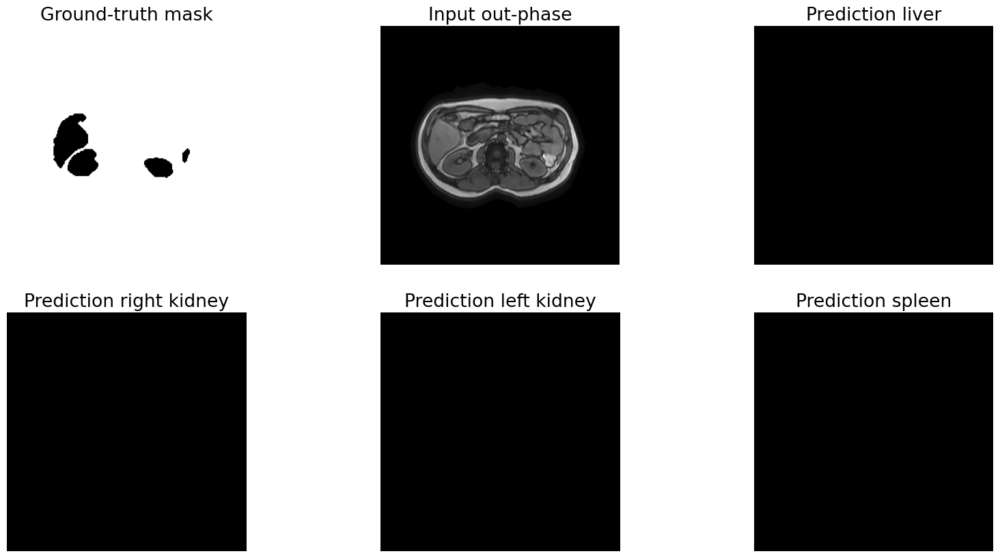

In [ ]:
# Graph predictions on unseen data
preds = model.predict(t1_test.take(1))
for input, true in t1_test.take(1):
  images = [true[15,:,:,0], input[15,:,:,1], preds[15,:,:,1], preds[15,:,:,2], preds[15,:,:,3], preds[15,:,:,4]]
  titles = ['Ground-truth mask', 'Input out-phase', 'Prediction liver', 'Prediction right kidney', 'Prediction left kidney', 'Prediction spleen']
  plot_image_processing_results(images, titles)
  break

###### **U-net LARGE LIVER**

In [21]:
# T1DUAL dataset with liver labels
t1_train = tf.data.Dataset.load(os.path.join(modeling_path, 'MR_T1DUAL', 'mr_t1dual_train'))
t1_train = t1_train.map(dataset_liver_labels).batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

t1_val = tf.data.Dataset.load(os.path.join(modeling_path, 'MR_T1DUAL', 'mr_t1dual_val'))
t1_val = t1_val.map(dataset_liver_labels).batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

t1_test = tf.data.Dataset.load(os.path.join(modeling_path, 'MR_T1DUAL', 'mr_t1dual_test'))
t1_test = t1_test.map(dataset_liver_labels).batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

In [29]:
# Create and compile the model
model = unetbig_model(INPUT_SHAPE)
model.compile(optimizer=tfk.optimizers.Adam(LEARNING_RATE),
              loss=LOSS,
              metrics=METRICS)

In [30]:
# Train the model
history = model.fit(
    t1_train,
    shuffle=True,
    epochs=EPOCHS,
    validation_data=t1_val,
    callbacks=CALLBACKS,
    verbose=1
)

Epoch 1/20
32/32 [==============================] - 40s 827ms/step - loss: 0.9395 - dice_coef: 0.0605 - ravd: 107.7384 - mean_io_u: 0.4830 - accuracy: 0.0644 - val_loss: 0.9401 - val_dice_coef: 0.0599 - val_ravd: 19.5374 - val_mean_io_u: 0.4855 - val_accuracy: 0.6381 - lr: 1.0000e-04
Epoch 2/20
32/32 [==============================] - 25s 786ms/step - loss: 0.9164 - dice_coef: 0.0836 - ravd: 113.1850 - mean_io_u: 0.4818 - accuracy: 0.3689 - val_loss: 0.8827 - val_dice_coef: 0.1173 - val_ravd: 16.2844 - val_mean_io_u: 0.4740 - val_accuracy: 0.6817 - lr: 1.0000e-04
Epoch 3/20
32/32 [==============================] - 25s 781ms/step - loss: 0.8754 - dice_coef: 0.1246 - ravd: 67.4495 - mean_io_u: 0.4396 - accuracy: 0.6242 - val_loss: 0.8298 - val_dice_coef: 0.1702 - val_ravd: 10.7149 - val_mean_io_u: 0.4572 - val_accuracy: 0.7240 - lr: 1.0000e-04
Epoch 4/20
32/32 [==============================] - 25s 769ms/step - loss: 0.8865 - dice_coef: 0.1135 - ravd: 47.1054 - mean_io_u: 0.5070 - accura

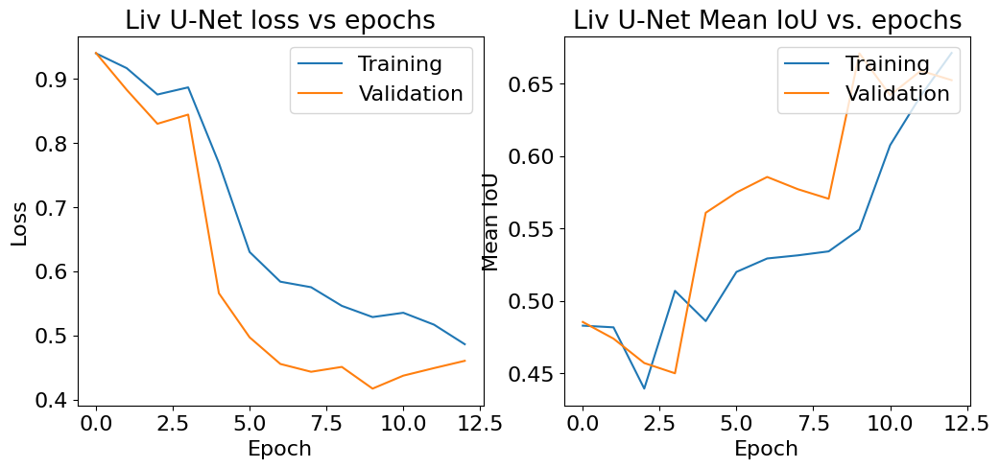

In [32]:
# Plot learning curves
plot_learning_curves(history, 'Liv U-Net')

In [ ]:
# Save model
model.save(os.path.join(modeling_path, 'MR_T1DUAL','t1_liver_unet.keras'))

1/1 [==============================] - 1s 1s/step


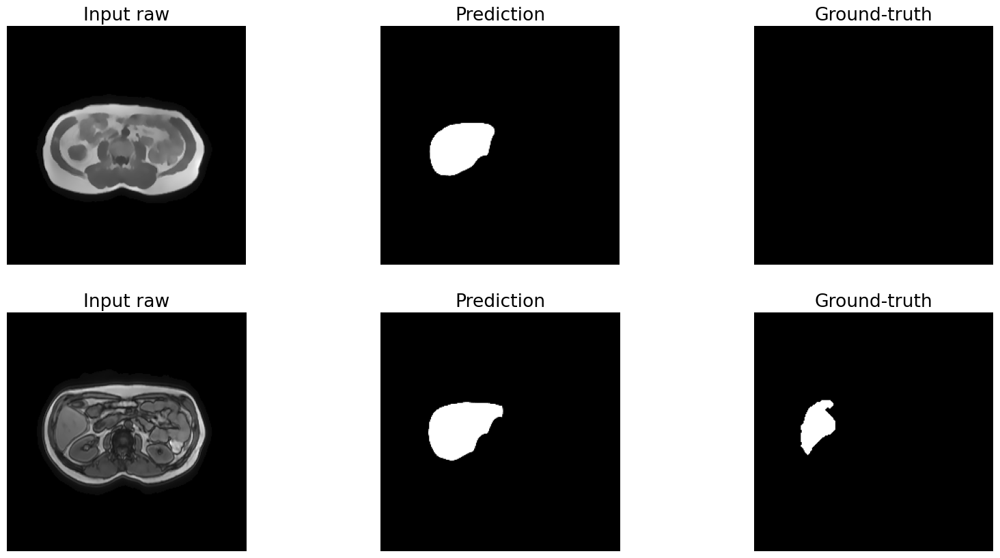

In [33]:
# Graph predictions on unseen data
preds = model.predict(t1_test.take(1))
for input, true in t1_test.take(1):
  images = [input[8,:,:,0], preds[8], true[8], input[15,:,:,1], preds[15], true[15]]
  titles = ['Input raw', 'Prediction', 'Ground-truth', 'Input raw', 'Prediction', 'Ground-truth']
  plot_image_processing_results(images, titles)
  break

In [34]:
model.evaluate(t1_test)

4/4 [==============================] - 1s 234ms/step - loss: 0.4969 - dice_coef: 0.5031 - ravd: 3.8412 - mean_io_u: 0.6876 - accuracy: 0.9659


[0.4969194531440735,
 0.5030804872512817,
 3.841249704360962,
 0.6876027584075928,
 0.9658706188201904]

###### **U-net LARGE RIGHT KIDNEY**

In [44]:
# T1DUAL dataset with liver labels
t1_train = tf.data.Dataset.load(os.path.join(modeling_path, 'MR_T1DUAL', 'mr_t1dual_train'))
t1_train = t1_train.map(dataset_rkidney_labels).batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

t1_val = tf.data.Dataset.load(os.path.join(modeling_path, 'MR_T1DUAL', 'mr_t1dual_val'))
t1_val = t1_val.map(dataset_rkidney_labels).batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

t1_test = tf.data.Dataset.load(os.path.join(modeling_path, 'MR_T1DUAL', 'mr_t1dual_test'))
t1_test = t1_test.map(dataset_rkidney_labels).batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

In [55]:
# Create and compile the model
model = unetbig_model(INPUT_SHAPE)
model.compile(optimizer=tfk.optimizers.Adam(LEARNING_RATE),
              loss=LOSS,
              metrics=METRICS)

In [56]:
# Train the model
history = model.fit(
    t1_train,
    shuffle=True,
    epochs=EPOCHS,
    validation_data=t1_val,
    callbacks=CALLBACKS,
    verbose=1
)

Epoch 1/20
32/32 [==============================] - 31s 744ms/step - loss: 0.9933 - dice_coef: 0.0067 - ravd: inf - mean_io_u: 0.4982 - accuracy: 0.0041 - val_loss: 0.9926 - val_dice_coef: 0.0074 - val_ravd: inf - val_mean_io_u: 0.4981 - val_accuracy: 0.0039 - lr: 1.0000e-05
Epoch 2/20
32/32 [==============================] - 23s 708ms/step - loss: 0.9933 - dice_coef: 0.0067 - ravd: inf - mean_io_u: 0.4983 - accuracy: 0.0034 - val_loss: 0.9926 - val_dice_coef: 0.0074 - val_ravd: inf - val_mean_io_u: 0.4981 - val_accuracy: 0.0038 - lr: 1.0000e-05
Epoch 3/20
32/32 [==============================] - 24s 730ms/step - loss: 0.9933 - dice_coef: 0.0067 - ravd: inf - mean_io_u: 0.4983 - accuracy: 0.0034 - val_loss: 0.9925 - val_dice_coef: 0.0075 - val_ravd: inf - val_mean_io_u: 0.4981 - val_accuracy: 0.0062 - lr: 1.0000e-05
Epoch 4/20
32/32 [==============================] - 23s 707ms/step - loss: 0.9933 - dice_coef: 0.0067 - ravd: inf - mean_io_u: 0.4983 - accuracy: 0.0034 - val_loss: 0.9925 

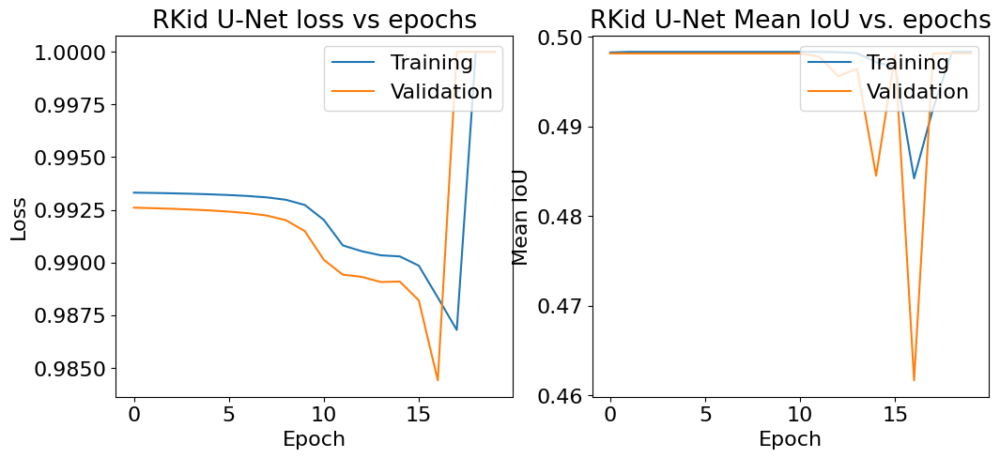

In [57]:
# Plot learning curves
plot_learning_curves(history, 'RKid U-Net')

In [ ]:
# Save model
model.save(os.path.join(modeling_path, 'MR_T1DUAL','t1_rkidney_unet.keras'))

1/1 [==============================] - 1s 512ms/step


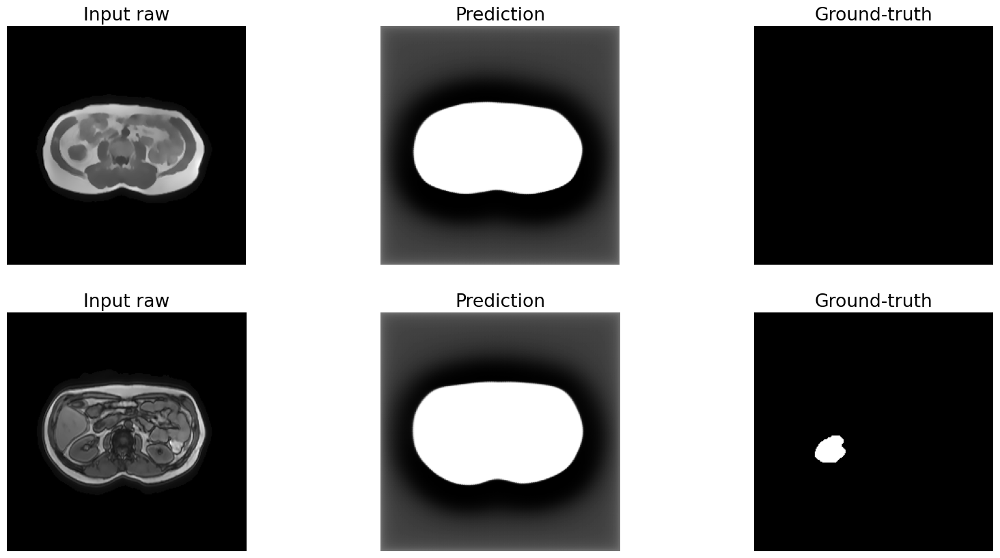

In [58]:
# Graph predictions on unseen data
preds = model.predict(t1_test.take(1))
for input, true in t1_test.take(1):
  images = [input[8,:,:,0], preds[8], true[8], input[15,:,:,1], preds[15], true[15]]
  titles = ['Input raw', 'Prediction', 'Ground-truth', 'Input raw', 'Prediction', 'Ground-truth']
  plot_image_processing_results(images, titles)
  break

In [59]:
model.evaluate(t1_test)

4/4 [==============================] - 1s 214ms/step - loss: 0.9830 - dice_coef: 0.0170 - ravd: 190.9176 - mean_io_u: 0.4134 - accuracy: 0.7352


[0.9829676151275635,
 0.017032381147146225,
 190.9176483154297,
 0.41336172819137573,
 0.7352111339569092]

###### **U-net LARGE LEFT KIDNEY**

In [60]:
# T1DUAL dataset with liver labels
t1_train = tf.data.Dataset.load(os.path.join(modeling_path, 'MR_T1DUAL', 'mr_t1dual_train'))
t1_train = t1_train.map(dataset_lkidney_labels).batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

t1_val = tf.data.Dataset.load(os.path.join(modeling_path, 'MR_T1DUAL', 'mr_t1dual_val'))
t1_val = t1_val.map(dataset_lkidney_labels).batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

t1_test = tf.data.Dataset.load(os.path.join(modeling_path, 'MR_T1DUAL', 'mr_t1dual_test'))
t1_test = t1_test.map(dataset_lkidney_labels).batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

In [61]:
# Create and compile the model
model = unetbig_model(INPUT_SHAPE)
model.compile(optimizer=tfk.optimizers.Adam(LEARNING_RATE),
              loss=LOSS,
              metrics=METRICS)

In [63]:
# Train the model
history = model.fit(
    t1_train,
    #shuffle=True,
    epochs=EPOCHS,
    validation_data=t1_val,
    callbacks=CALLBACKS,
    verbose=1
)

Epoch 1/20
32/32 [==============================] - 25s 787ms/step - loss: 0.9853 - dice_coef: 0.0147 - ravd: inf - mean_io_u: 0.4850 - accuracy: 0.6648 - val_loss: 0.9846 - val_dice_coef: 0.0154 - val_ravd: inf - val_mean_io_u: 0.4686 - val_accuracy: 0.7080 - lr: 1.0000e-05
Epoch 2/20
32/32 [==============================] - 26s 797ms/step - loss: 0.9842 - dice_coef: 0.0158 - ravd: inf - mean_io_u: 0.4844 - accuracy: 0.6749 - val_loss: 0.9834 - val_dice_coef: 0.0166 - val_ravd: inf - val_mean_io_u: 0.4685 - val_accuracy: 0.7175 - lr: 1.0000e-05
Epoch 3/20
32/32 [==============================] - 25s 776ms/step - loss: 0.9828 - dice_coef: 0.0172 - ravd: inf - mean_io_u: 0.4830 - accuracy: 0.6924 - val_loss: 0.9816 - val_dice_coef: 0.0184 - val_ravd: inf - val_mean_io_u: 0.4663 - val_accuracy: 0.7245 - lr: 1.0000e-05
Epoch 4/20
32/32 [==============================] - 25s 766ms/step - loss: 0.9817 - dice_coef: 0.0183 - ravd: inf - mean_io_u: 0.4798 - accuracy: 0.7032 - val_loss: 0.9798 

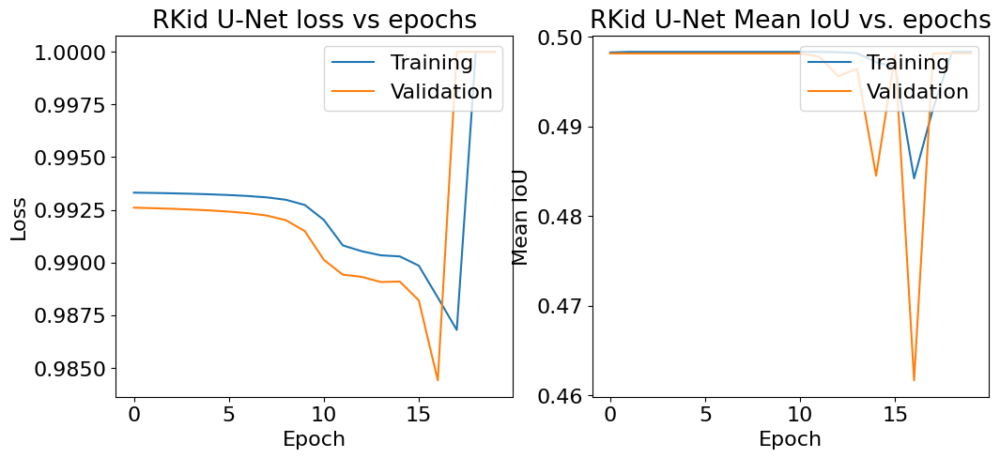

In [ ]:
# Plot learning curves
plot_learning_curves(history, 'LKid U-Net')

In [ ]:
# Save model
model.save(os.path.join(modeling_path, 'MR_T1DUAL','t1_lkidney_unet.keras'))

1/1 [==============================] - 1s 512ms/step


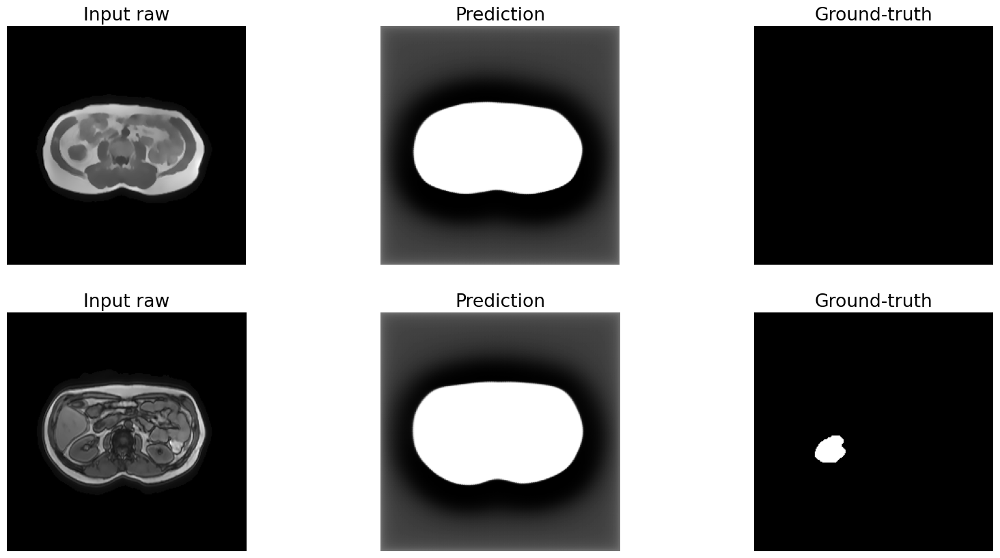

In [ ]:
# Graph predictions on unseen data
preds = model.predict(t1_test.take(1))
for input, true in t1_test.take(1):
  images = [input[8,:,:,0], preds[8], true[8], input[15,:,:,1], preds[15], true[15]]
  titles = ['Input raw', 'Prediction', 'Ground-truth', 'Input raw', 'Prediction', 'Ground-truth']
  plot_image_processing_results(images, titles)
  break

In [ ]:
model.evaluate(t1_test)

4/4 [==============================] - 1s 214ms/step - loss: 0.9830 - dice_coef: 0.0170 - ravd: 190.9176 - mean_io_u: 0.4134 - accuracy: 0.7352


[0.9829676151275635,
 0.017032381147146225,
 190.9176483154297,
 0.41336172819137573,
 0.7352111339569092]

###### **U-net LARGE SPLEEN**

In [36]:
# T1DUAL dataset with spleen labels
t1_train = tf.data.Dataset.load(os.path.join(modeling_path, 'MR_T1DUAL', 'mr_t1dual_train'))
t1_train = t1_train.map(dataset_spleen_labels).batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

t1_val = tf.data.Dataset.load(os.path.join(modeling_path, 'MR_T1DUAL', 'mr_t1dual_val'))
t1_val = t1_val.map(dataset_spleen_labels).batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

t1_test = tf.data.Dataset.load(os.path.join(modeling_path, 'MR_T1DUAL', 'mr_t1dual_test'))
t1_test = t1_test.map(dataset_spleen_labels).batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

In [39]:
# Create and compile the model
model = unetbig_model(INPUT_SHAPE)
model.compile(optimizer=tfk.optimizers.Adam(LEARNING_RATE),
              loss=LOSS,
              metrics=METRICS)

In [40]:
# Train the model
history = model.fit(
    t1_train,
    shuffle=True,
    epochs=EPOCHS,
    validation_data=t1_val,
    callbacks=CALLBACKS,
    verbose=1
)

Epoch 1/20
32/32 [==============================] - 38s 805ms/step - loss: 0.9885 - dice_coef: 0.0115 - ravd: inf - mean_io_u: 0.4972 - accuracy: 0.3526 - val_loss: 0.9925 - val_dice_coef: 0.0075 - val_ravd: 328.2301 - val_mean_io_u: 0.4981 - val_accuracy: 0.0691 - lr: 1.0000e-05
Epoch 2/20
32/32 [==============================] - 25s 783ms/step - loss: 0.9885 - dice_coef: 0.0115 - ravd: inf - mean_io_u: 0.4971 - accuracy: 0.0145 - val_loss: 0.9925 - val_dice_coef: 0.0075 - val_ravd: 328.8032 - val_mean_io_u: 0.4981 - val_accuracy: 0.6118 - lr: 1.0000e-05
Epoch 3/20
32/32 [==============================] - 25s 775ms/step - loss: 0.9884 - dice_coef: 0.0116 - ravd: inf - mean_io_u: 0.4971 - accuracy: 0.0134 - val_loss: 0.9925 - val_dice_coef: 0.0075 - val_ravd: 329.2810 - val_mean_io_u: 0.4981 - val_accuracy: 0.6236 - lr: 1.0000e-05
Epoch 4/20
32/32 [==============================] - 25s 767ms/step - loss: 0.9884 - dice_coef: 0.0116 - ravd: inf - mean_io_u: 0.4971 - accuracy: 0.0246 - va

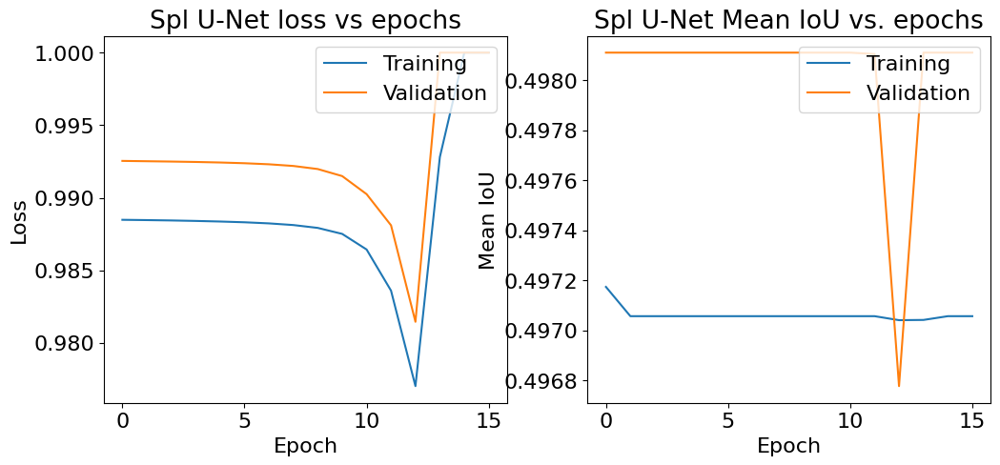

In [41]:
# Plot learning curves
plot_learning_curves(history, 'Spl U-Net')

In [ ]:
# Save model
model.save(os.path.join(modeling_path, 'MR_T1DUAL','t1_spleen_unet.keras'))

1/1 [==============================] - 0s 357ms/step


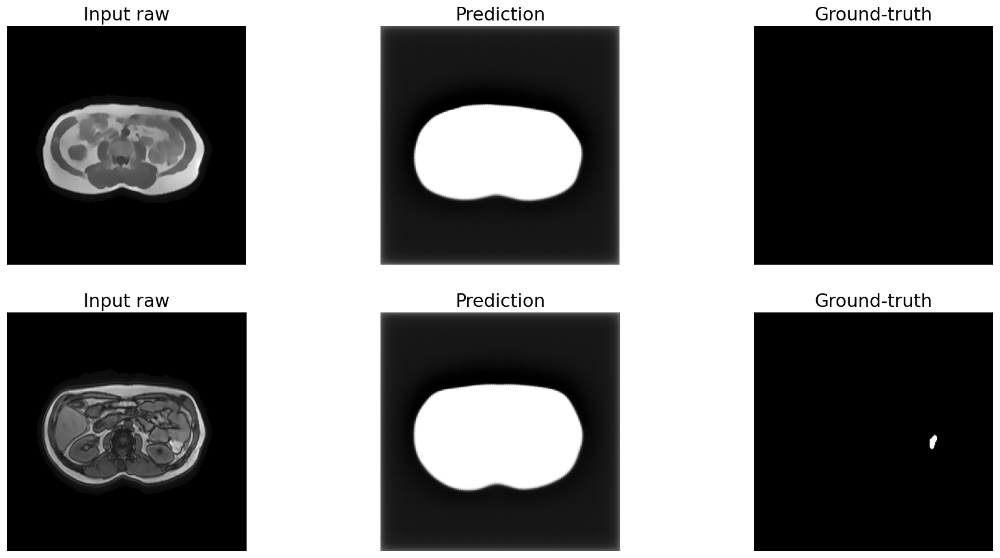

In [42]:
# Graph predictions on unseen data
preds = model.predict(t1_test.take(1))
for input, true in t1_test.take(1):
  images = [input[8,:,:,0], preds[8], true[8], input[15,:,:,1], preds[15], true[15]]
  titles = ['Input raw', 'Prediction', 'Ground-truth', 'Input raw', 'Prediction', 'Ground-truth']
  plot_image_processing_results(images, titles)
  break

In [43]:
model.evaluate(t1_test)

4/4 [==============================] - 1s 208ms/step - loss: 0.9741 - dice_coef: 0.0259 - ravd: 1088.9541 - mean_io_u: 0.4958 - accuracy: 0.7305


[0.974138617515564,
 0.025861388072371483,
 1088.9541015625,
 0.4958230257034302,
 0.7304675579071045]

##### **T2SPIR**

In [20]:
for input_images, output_images in t2_train.take(1):
    input_shape = input_images.shape
    output_shape = output_images.shape
    break

# Define input shape, output shape, batch size, and number of epochs
INPUT_SHAPE = input_shape[1:]
OUTPUT_SHAPE = output_shape[1:]
IMG_SIZE = input_shape[1]
BATCH_SIZE = input_shape[0]
EPOCHS = 20

# Print input shape, batch size, and number of epochs
print(f'Input Shape: {INPUT_SHAPE}, Output Shape: {OUTPUT_SHAPE}, Batch Size: {BATCH_SIZE}, Epochs: {EPOCHS}')

Input Shape: (256, 256, 1), Output Shape: (256, 256, 5), Batch Size: 16, Epochs: 20


###### **Autoencoder model**

In [23]:
# Create and compile the model
model = autoencoder_multi_model(INPUT_SHAPE, OUTPUT_SHAPE)
model.compile(optimizer=tfk.optimizers.Adam(LEARNING_RATE),
              loss=LOSS_MULTI,
              metrics=METRICS_MULTI)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 1)]     0         
                                                                 
 conv2d (Conv2D)             (None, 256, 256, 32)      320       
                                                                 
 max_pooling2d (MaxPooling2  (None, 128, 128, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 128, 128, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 64, 64, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 64, 64, 128)       73856 

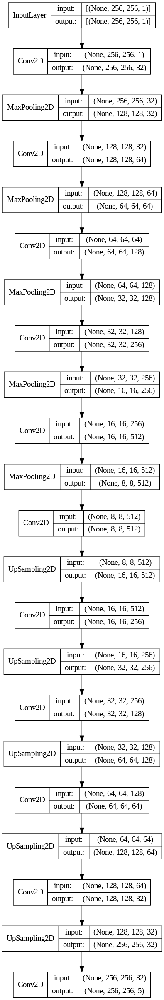

In [24]:
# Print model summary
model.summary()
plot_model(model, show_shapes=True, show_layer_names=False)

In [26]:
# Train the model
history = model.fit(
    t2_train,
    shuffle=True,
    epochs=EPOCHS,
    validation_data=t2_val,
    callbacks=CALLBACKS,
    verbose=1
)

Epoch 1/12
32/32 [==============================] - 22s 175ms/step - loss: 3.8731 - dice_coef_multi: 0.1269 - mean_io_u_1: 0.4000 - liver_dice_coef: 0.1007 - rkidney_dice_coef: 0.0032 - lkidney_dice_coef: 0.0091 - spleen_dice_coef: 0.0139 - val_loss: 3.8346 - val_dice_coef_multi: 0.1654 - val_mean_io_u_1: 0.4000 - val_liver_dice_coef: 0.1402 - val_rkidney_dice_coef: 7.2323e-04 - val_lkidney_dice_coef: 0.0113 - val_spleen_dice_coef: 0.0132 - lr: 1.0000e-04
Epoch 2/12
32/32 [==============================] - 7s 135ms/step - loss: 3.6279 - dice_coef_multi: 0.3721 - mean_io_u_1: 0.4048 - liver_dice_coef: 0.3102 - rkidney_dice_coef: 6.9297e-04 - lkidney_dice_coef: 0.0124 - spleen_dice_coef: 0.0487 - val_loss: 3.5065 - val_dice_coef_multi: 0.4935 - val_mean_io_u_1: 0.4594 - val_liver_dice_coef: 0.3505 - val_rkidney_dice_coef: 0.0025 - val_lkidney_dice_coef: 0.0284 - val_spleen_dice_coef: 0.1120 - lr: 1.0000e-04
Epoch 3/12
32/32 [==============================] - 6s 135ms/step - loss: 3.2083 

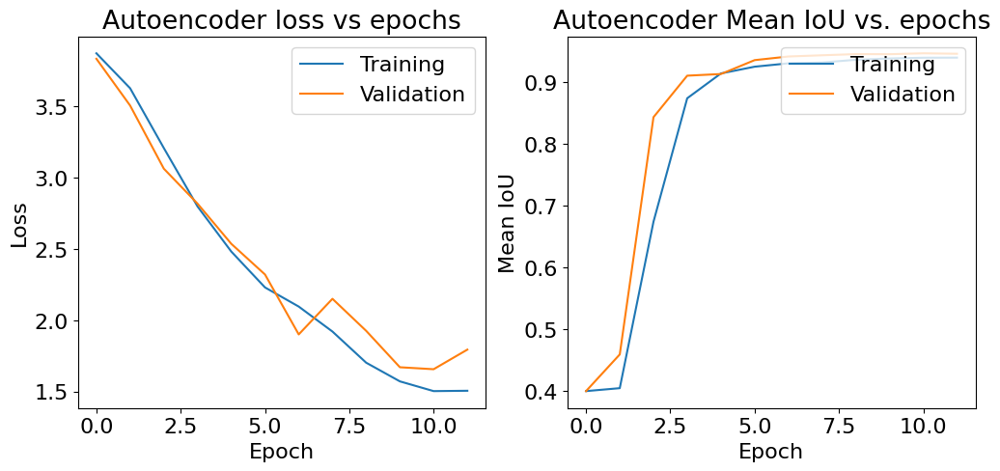

In [28]:
# Plot learning curves
plot_learning_curves(history, 'Autoencoder')

In [ ]:
# Save model
model.save(os.path.join(modeling_path, 'MR_T2SPIR','t2_autoencoder.keras'))

1/1 [==============================] - 0s 278ms/step


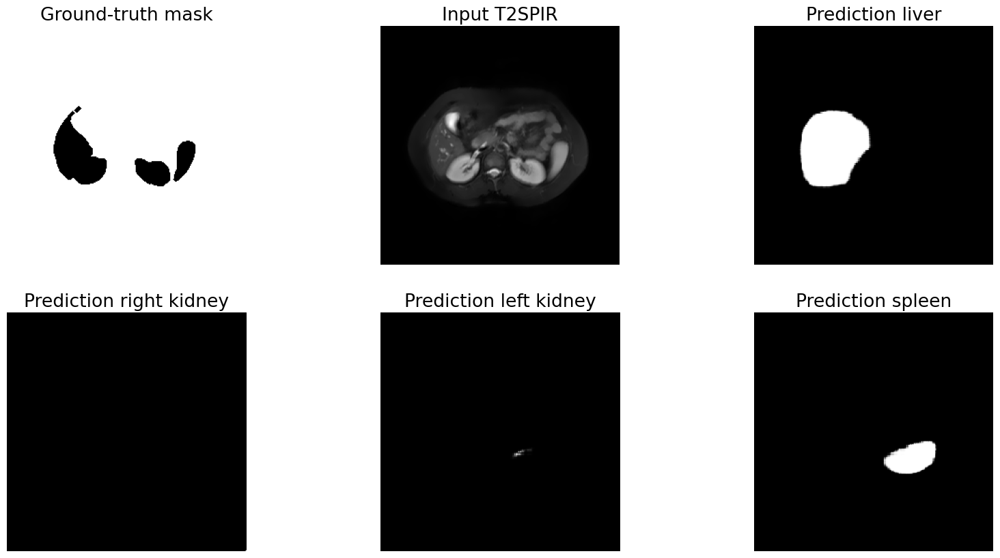

In [31]:
# Graph predictions on unseen data
preds = model.predict(t2_test.take(1))
for input, true in t2_test.take(1):
  images = [true[15,:,:,0], input[15], preds[15,:,:,1], preds[15,:,:,2], preds[15,:,:,3], preds[15,:,:,4]]
  titles = ['Ground-truth mask', 'Input T2SPIR', 'Prediction liver', 'Prediction right kidney', 'Prediction left kidney', 'Prediction spleen']
  plot_image_processing_results(images, titles)
  break

**Chosen model for left  kidney and spleen segmentation (MR T2 SPIR images)**
- test right kigney DICE coefficient: 0.6239
- test spleen DICE coefficient: 0.5167

###### **U-net SMALL**

In [22]:
# Create and compile the vanilla U-net model
model = unetsmall_multi_model(INPUT_SHAPE, OUTPUT_SHAPE)
model.compile(optimizer=tfk.optimizers.Adam(LEARNING_RATE),
              loss=LOSS_MULTI,
              metrics=METRICS_MULTI)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 256, 256, 16)         160       ['input_1[0][0]']             
                                                                                                  
 conv2d_1 (Conv2D)           (None, 256, 256, 16)         2320      ['conv2d[0][0]']              
                                                                                                  
 max_pooling2d (MaxPooling2  (None, 128, 128, 16)         0         ['conv2d_1[0][0]']            
 D)                                                                                           

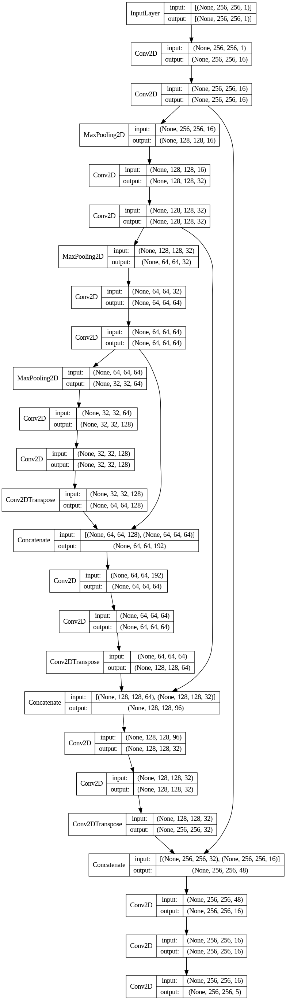

In [23]:
# Print model summary
model.summary()
plot_model(model, show_shapes=True, show_layer_names=False)

In [24]:
# Train the model
history = model.fit(
    t2_train,
    shuffle=True,
    epochs=EPOCHS,
    validation_data=t2_val,
    callbacks=CALLBACKS,
    verbose=1
)

Epoch 1/20
32/32 [==============================] - 29s 291ms/step - loss: 3.9211 - dice_coef_multi: 0.0789 - mean_io_u_1: 0.4000 - liver_dice_coef: 0.0526 - rkidney_dice_coef: 0.0072 - lkidney_dice_coef: 0.0074 - spleen_dice_coef: 0.0117 - val_loss: 3.9254 - val_dice_coef_multi: 0.0746 - val_mean_io_u_1: 0.4000 - val_liver_dice_coef: 0.0510 - val_rkidney_dice_coef: 0.0075 - val_lkidney_dice_coef: 0.0070 - val_spleen_dice_coef: 0.0091 - lr: 1.0000e-04
Epoch 2/20
32/32 [==============================] - 6s 186ms/step - loss: 3.9200 - dice_coef_multi: 0.0799 - mean_io_u_1: 0.4000 - liver_dice_coef: 0.0537 - rkidney_dice_coef: 0.0072 - lkidney_dice_coef: 0.0073 - spleen_dice_coef: 0.0118 - val_loss: 3.9234 - val_dice_coef_multi: 0.0766 - val_mean_io_u_1: 0.4000 - val_liver_dice_coef: 0.0532 - val_rkidney_dice_coef: 0.0074 - val_lkidney_dice_coef: 0.0068 - val_spleen_dice_coef: 0.0092 - lr: 1.0000e-04
Epoch 3/20
32/32 [==============================] - 6s 179ms/step - loss: 3.9078 - dice_c

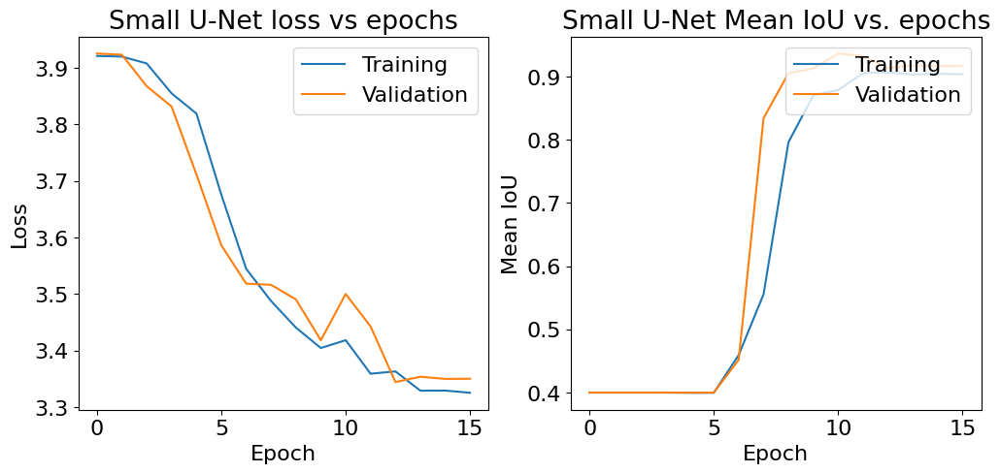

In [25]:
# Plot learning curves
plot_learning_curves(history, 'Small U-Net')

In [ ]:
# Save model
model.save(os.path.join(modeling_path, 'MR_T2SPIR','t2_unet_small.keras'))

1/1 [==============================] - 0s 107ms/step


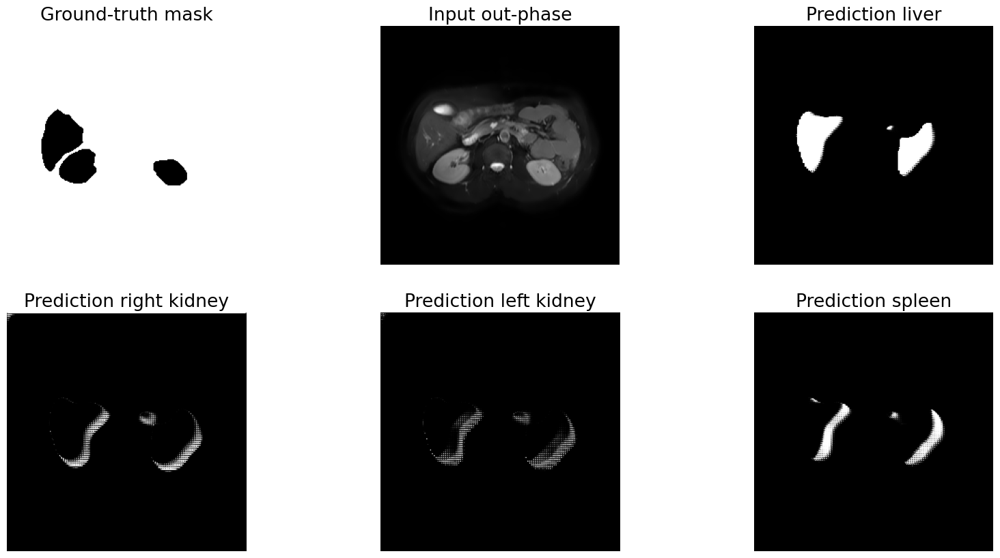

In [33]:
# Graph predictions on unseen data
preds = model.predict(t2_test.take(1))
for input, true in t2_test.take(1):
  images = [true[15,:,:,0], input[15], preds[15,:,:,1], preds[15,:,:,2], preds[15,:,:,3], preds[15,:,:,4]]
  titles = ['Ground-truth mask', 'Input out-phase', 'Prediction liver', 'Prediction right kidney', 'Prediction left kidney', 'Prediction spleen']
  plot_image_processing_results(images, titles)
  break

###### **U-net LARGE**

In [35]:
# Create and compile the vanilla U-net model
model = unetbig_multi_model(INPUT_SHAPE, OUTPUT_SHAPE)
model.compile(optimizer=tfk.optimizers.Adam(LEARNING_RATE),
              loss=LOSS_MULTI,
              metrics=METRICS_MULTI)

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 conv2d_15 (Conv2D)          (None, 256, 256, 64)         640       ['input_2[0][0]']             
                                                                                                  
 conv2d_16 (Conv2D)          (None, 256, 256, 64)         36928     ['conv2d_15[0][0]']           
                                                                                                  
 max_pooling2d_3 (MaxPoolin  (None, 128, 128, 64)         0         ['conv2d_16[0][0]']           
 g2D)                                                                                       

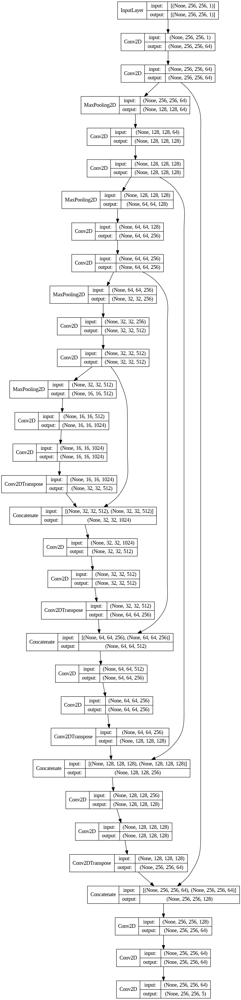

In [36]:
# Print model summary
model.summary()
plot_model(model, show_shapes=True, show_layer_names=False)

In [37]:
# Train the model
history = model.fit(
    t2_train,
    shuffle=True,
    epochs=EPOCHS,
    validation_data=t2_val,
    callbacks=CALLBACKS,
    verbose=1
)

Epoch 1/20
32/32 [==============================] - 76s 805ms/step - loss: 3.9206 - dice_coef_multi: 0.0794 - mean_io_u_1: 0.4569 - liver_dice_coef: 0.0531 - rkidney_dice_coef: 0.0073 - lkidney_dice_coef: 0.0073 - spleen_dice_coef: 0.0118 - val_loss: 3.9235 - val_dice_coef_multi: 0.0765 - val_mean_io_u_1: 0.4000 - val_liver_dice_coef: 0.0530 - val_rkidney_dice_coef: 0.0076 - val_lkidney_dice_coef: 0.0065 - val_spleen_dice_coef: 0.0094 - lr: 1.0000e-04
Epoch 2/20
32/32 [==============================] - 26s 796ms/step - loss: 3.9014 - dice_coef_multi: 0.0986 - mean_io_u_1: 0.4000 - liver_dice_coef: 0.0809 - rkidney_dice_coef: 0.0049 - lkidney_dice_coef: 0.0039 - spleen_dice_coef: 0.0089 - val_loss: 3.8560 - val_dice_coef_multi: 0.1440 - val_mean_io_u_1: 0.4000 - val_liver_dice_coef: 0.1370 - val_rkidney_dice_coef: 0.0011 - val_lkidney_dice_coef: 0.0013 - val_spleen_dice_coef: 0.0046 - lr: 1.0000e-04
Epoch 3/20
32/32 [==============================] - 25s 792ms/step - loss: 3.8796 - dice

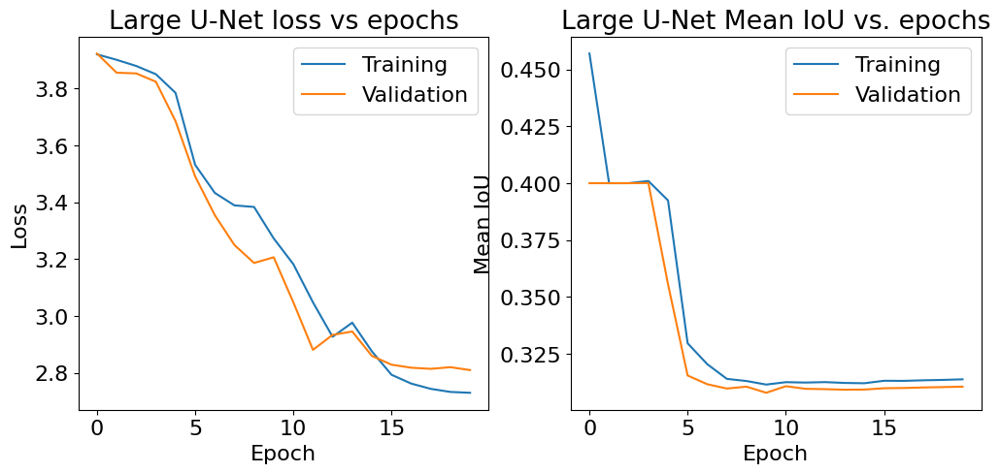

In [38]:
# Plot learning curves
plot_learning_curves(history, 'Large U-Net')

In [ ]:
# Save model
model.save(os.path.join(modeling_path, 'MR_T2SPIR','t2_unet_large.keras'))

1/1 [==============================] - 1s 597ms/step


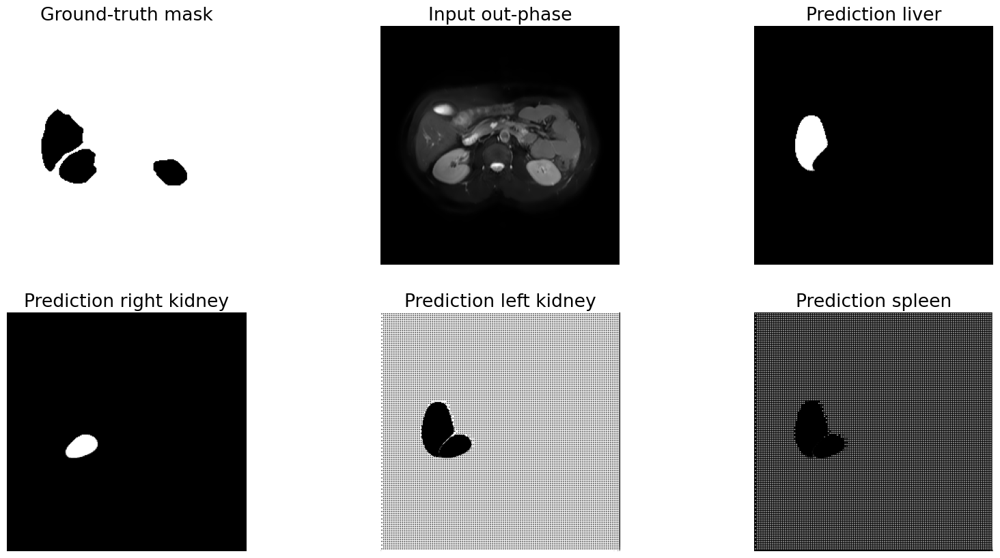

In [39]:
# Graph predictions on unseen data
preds = model.predict(t2_test.take(1))
for input, true in t2_test.take(1):
  images = [true[15,:,:,0], input[15], preds[15,:,:,1], preds[15,:,:,2], preds[15,:,:,3], preds[15,:,:,4]]
  titles = ['Ground-truth mask', 'Input out-phase', 'Prediction liver', 'Prediction right kidney', 'Prediction left kidney', 'Prediction spleen']
  plot_image_processing_results(images, titles)
  break

In [40]:
model.evaluate(t2_test)

4/4 [==============================] - 1s 247ms/step - loss: 2.7395 - dice_coef_multi: 1.2605 - mean_io_u_1: 0.3119 - liver_dice_coef: 0.5374 - rkidney_dice_coef: 0.7028 - lkidney_dice_coef: 0.0090 - spleen_dice_coef: 0.0113


[2.7394824028015137,
 1.2605175971984863,
 0.3118804693222046,
 0.5373809337615967,
 0.702816903591156,
 0.008997551165521145,
 0.011322256177663803]

###### **Trans U-net**

In [45]:
# Create and compile the vanilla U-net model
model = trans_unet_multi(INPUT_SHAPE, OUTPUT_SHAPE)
model.compile(optimizer=tfk.optimizers.Adam(LEARNING_RATE),
              loss=LOSS_MULTI,
              metrics=METRICS_MULTI)

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 conv2d_44 (Conv2D)          (None, 256, 256, 64)         640       ['input_4[0][0]']             
                                                                                                  
 conv2d_45 (Conv2D)          (None, 256, 256, 64)         36928     ['conv2d_44[0][0]']           
                                                                                                  
 max_pooling2d_11 (MaxPooli  (None, 128, 128, 64)         0         ['conv2d_45[0][0]']           
 ng2D)                                                                                      

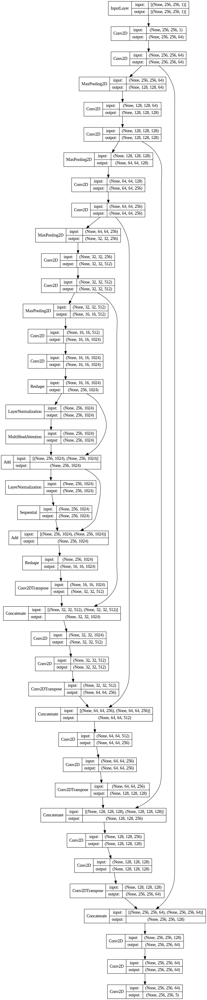

In [46]:
# Print model summary
model.summary()
plot_model(model, show_shapes=True, show_layer_names=False)

In [47]:
# Train the model
history = model.fit(
    t2_train,
    shuffle=True,
    epochs=EPOCHS,
    validation_data=t2_val,
    callbacks=CALLBACKS,
    verbose=1
)

Epoch 1/20
32/32 [==============================] - 42s 938ms/step - loss: 3.9162 - dice_coef_multi: 0.0838 - mean_io_u_1: 0.3907 - liver_dice_coef: 0.0586 - rkidney_dice_coef: 0.0067 - lkidney_dice_coef: 0.0071 - spleen_dice_coef: 0.0114 - val_loss: 3.9146 - val_dice_coef_multi: 0.0854 - val_mean_io_u_1: 0.4000 - val_liver_dice_coef: 0.0637 - val_rkidney_dice_coef: 0.0065 - val_lkidney_dice_coef: 0.0065 - val_spleen_dice_coef: 0.0087 - lr: 1.0000e-04
Epoch 2/20
32/32 [==============================] - 27s 852ms/step - loss: 3.8903 - dice_coef_multi: 0.1097 - mean_io_u_1: 0.4000 - liver_dice_coef: 0.0915 - rkidney_dice_coef: 0.0043 - lkidney_dice_coef: 0.0049 - spleen_dice_coef: 0.0090 - val_loss: 3.8285 - val_dice_coef_multi: 0.1715 - val_mean_io_u_1: 0.4000 - val_liver_dice_coef: 0.1594 - val_rkidney_dice_coef: 5.2121e-04 - val_lkidney_dice_coef: 0.0034 - val_spleen_dice_coef: 0.0082 - lr: 1.0000e-04
Epoch 3/20
32/32 [==============================] - 26s 821ms/step - loss: 3.9348 - 

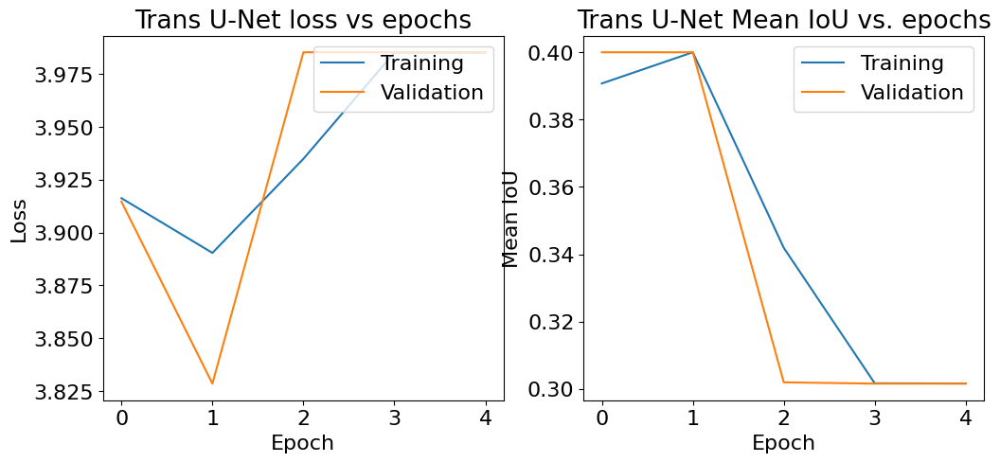

In [49]:
# Plot learning curves
plot_learning_curves(history, 'Trans U-Net')

In [ ]:
# Save model
model.save(os.path.join(modeling_path, 'MR_T2SPIR','t2_trans_unet.keras'))

1/1 [==============================] - 1s 860ms/step


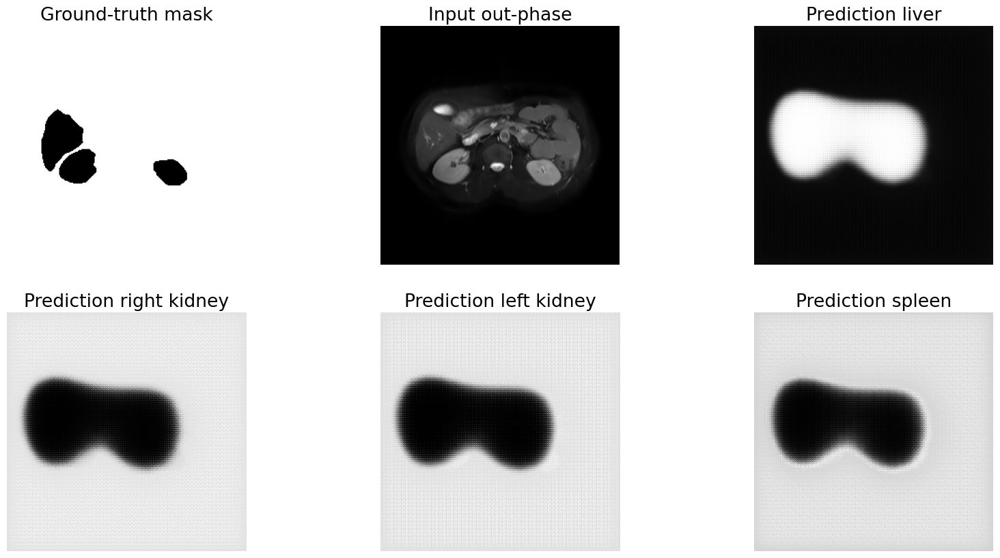

In [50]:
# Graph predictions on unseen data
preds = model.predict(t2_test.take(1))
for input, true in t2_test.take(1):
  images = [true[15,:,:,0], input[15], preds[15,:,:,1], preds[15,:,:,2], preds[15,:,:,3], preds[15,:,:,4]]
  titles = ['Ground-truth mask', 'Input out-phase', 'Prediction liver', 'Prediction right kidney', 'Prediction left kidney', 'Prediction spleen']
  plot_image_processing_results(images, titles)
  break

###### **U-net LARGE LIVER**

In [63]:
# T2SPIR dataset with liver labels
t2_train = tf.data.Dataset.load(os.path.join(modeling_path, 'MR_T2SPIR', 'mr_t2spir_train'))
t2_train = t2_train.map(dataset_liver_labels).batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

t2_val = tf.data.Dataset.load(os.path.join(modeling_path, 'MR_T2SPIR', 'mr_t2spir_val'))
t2_val = t2_val.map(dataset_liver_labels).batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

t2_test = tf.data.Dataset.load(os.path.join(modeling_path, 'MR_T2SPIR', 'mr_t2spir_test'))
t2_test = t2_test.map(dataset_liver_labels).batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

In [64]:
# Create and compile the model
model = unetbig_model(INPUT_SHAPE)
model.compile(optimizer=tfk.optimizers.Adam(LEARNING_RATE),
              loss=LOSS,
              metrics=METRICS)

In [65]:
# Train the model
history = model.fit(
    t2_train,
    shuffle=True,
    epochs=EPOCHS,
    validation_data=t2_val,
    callbacks=CALLBACKS,
    verbose=1
)

Epoch 1/20
32/32 [==============================] - 33s 815ms/step - loss: 0.9377 - dice_coef: 0.0623 - ravd: 76.7524 - mean_io_u: 0.4851 - accuracy: 0.0341 - val_loss: 0.9253 - val_dice_coef: 0.0747 - val_ravd: 80.7762 - val_mean_io_u: 0.4836 - val_accuracy: 0.0327 - lr: 1.0000e-04
Epoch 2/20
32/32 [==============================] - 25s 782ms/step - loss: 0.9153 - dice_coef: 0.0847 - ravd: 104.8831 - mean_io_u: 0.4833 - accuracy: 0.2262 - val_loss: 0.8990 - val_dice_coef: 0.1010 - val_ravd: 83.9604 - val_mean_io_u: 0.4838 - val_accuracy: 0.7980 - lr: 1.0000e-04
Epoch 3/20
32/32 [==============================] - 24s 748ms/step - loss: 0.9310 - dice_coef: 0.0690 - ravd: 72.6507 - mean_io_u: 0.4828 - accuracy: 0.8700 - val_loss: 0.8999 - val_dice_coef: 0.1001 - val_ravd: 85.5373 - val_mean_io_u: 0.4851 - val_accuracy: 0.7280 - lr: 1.0000e-04
Epoch 4/20
32/32 [==============================] - 24s 757ms/step - loss: 0.8806 - dice_coef: 0.1194 - ravd: 87.2194 - mean_io_u: 0.5212 - accurac

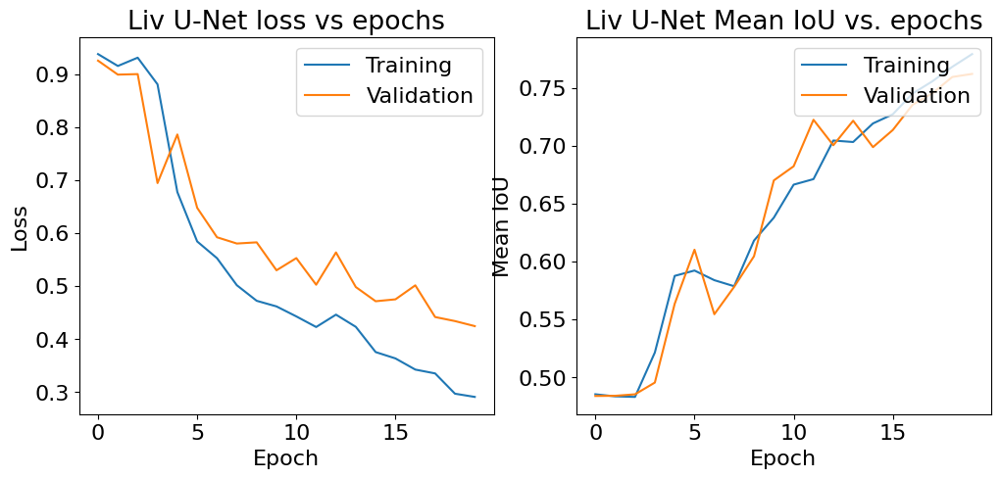

In [66]:
# Plot learning curves
plot_learning_curves(history, 'Liv U-Net')

In [ ]:
# Save model
model.save(os.path.join(modeling_path, 'MR_T2SPIR','t2_liver_unet.keras'))

1/1 [==============================] - 0s 101ms/step


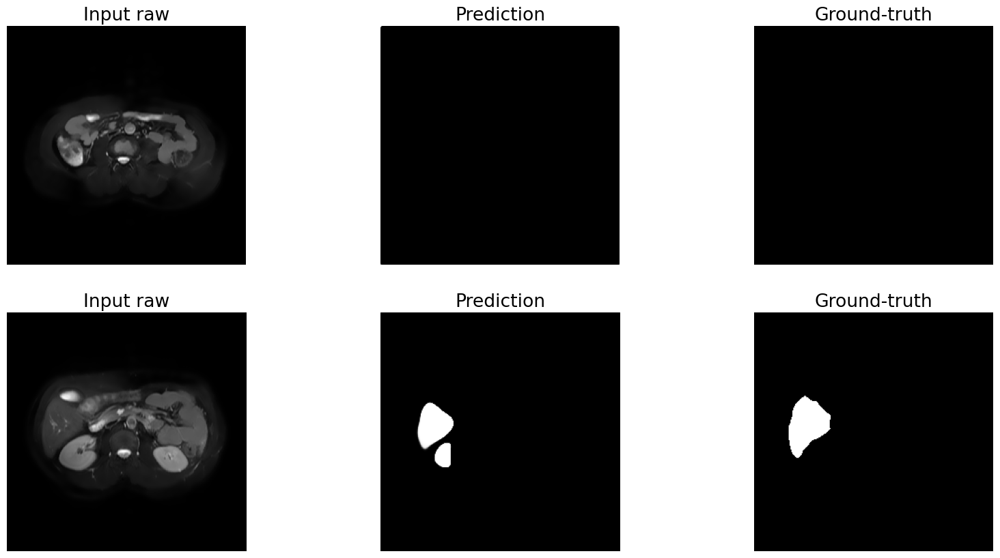

In [70]:
# Graph predictions on unseen data
preds = model.predict(t2_test.take(1))
for input, true in t2_test.take(1):
  images = [input[8], preds[8], true[8], input[15], preds[15], true[15]]
  titles = ['Input raw', 'Prediction', 'Ground-truth', 'Input raw', 'Prediction', 'Ground-truth']
  plot_image_processing_results(images, titles)
  break

1/1 [==============================] - 0s 99ms/step


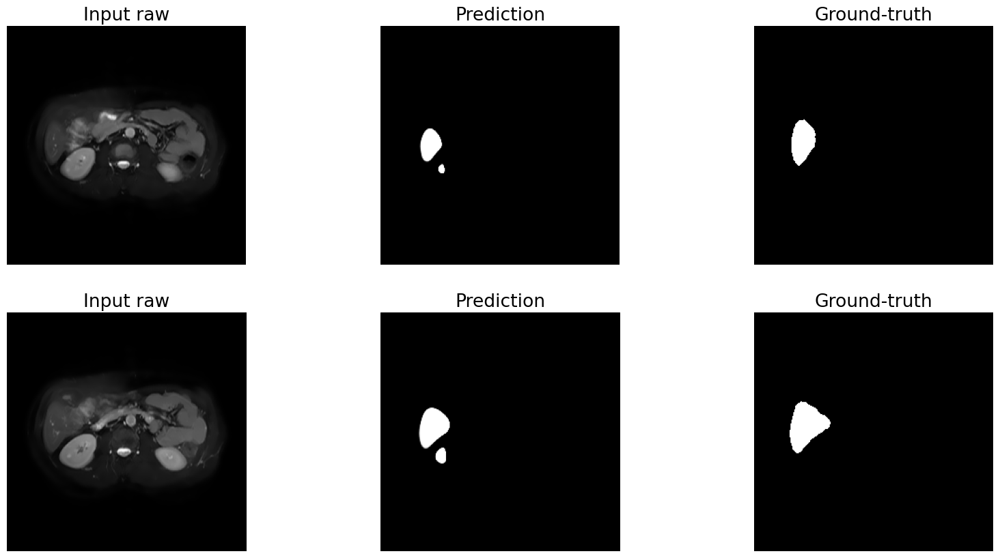

In [71]:
# Graph predictions on unseen data
preds = model.predict(t2_test.take(1))
for input, true in t2_test.take(1):
  images = [input[13], preds[13], true[13], input[14], preds[14], true[14]]
  titles = ['Input raw', 'Prediction', 'Ground-truth', 'Input raw', 'Prediction', 'Ground-truth']
  plot_image_processing_results(images, titles)
  break

In [72]:
model.evaluate(t2_test)

4/4 [==============================] - 1s 220ms/step - loss: 0.2947 - dice_coef: 0.7053 - ravd: 0.2259 - mean_io_u: 0.7273 - accuracy: 0.9852


[0.29473423957824707,
 0.7052657604217529,
 0.2258819341659546,
 0.7272943258285522,
 0.9852414131164551]

###### **U-net LARGE RIGHT KIDNEY**

In [73]:
# T2SPIR dataset with liver labels
t2_train = tf.data.Dataset.load(os.path.join(modeling_path, 'MR_T2SPIR', 'mr_t2spir_train'))
t2_train = t2_train.map(dataset_rkidney_labels).batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

t2_val = tf.data.Dataset.load(os.path.join(modeling_path, 'MR_T2SPIR', 'mr_t2spir_val'))
t2_val = t2_val.map(dataset_rkidney_labels).batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

t2_test = tf.data.Dataset.load(os.path.join(modeling_path, 'MR_T2SPIR', 'mr_t2spir_test'))
t2_test = t2_test.map(dataset_rkidney_labels).batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

In [83]:
# Create and compile the model
model = unetbig_model(INPUT_SHAPE)
model.compile(optimizer=tfk.optimizers.Adam(LEARNING_RATE),
              loss=LOSS,
              metrics=METRICS)

In [84]:
# Train the model
history = model.fit(
    t2_train,
    shuffle=True,
    epochs=EPOCHS,
    validation_data=t2_val,
    callbacks=CALLBACKS,
    verbose=1
)

Epoch 1/20
32/32 [==============================] - 32s 789ms/step - loss: 0.9925 - dice_coef: 0.0075 - ravd: inf - mean_io_u: 0.4981 - accuracy: 0.0614 - val_loss: 0.9919 - val_dice_coef: 0.0081 - val_ravd: 219.0354 - val_mean_io_u: 0.4981 - val_accuracy: 0.6700 - lr: 1.0000e-04
Epoch 2/20
32/32 [==============================] - 25s 791ms/step - loss: 0.9911 - dice_coef: 0.0089 - ravd: inf - mean_io_u: 0.4981 - accuracy: 0.5050 - val_loss: 0.9867 - val_dice_coef: 0.0133 - val_ravd: 241.4936 - val_mean_io_u: 0.4981 - val_accuracy: 0.6903 - lr: 1.0000e-04
Epoch 3/20
32/32 [==============================] - 25s 775ms/step - loss: 0.9860 - dice_coef: 0.0140 - ravd: inf - mean_io_u: 0.4981 - accuracy: 0.8015 - val_loss: 0.9790 - val_dice_coef: 0.0210 - val_ravd: 155.0485 - val_mean_io_u: 0.4980 - val_accuracy: 0.9161 - lr: 1.0000e-04
Epoch 4/20
32/32 [==============================] - 25s 766ms/step - loss: 0.9300 - dice_coef: 0.0700 - ravd: inf - mean_io_u: 0.5410 - accuracy: 0.9364 - va

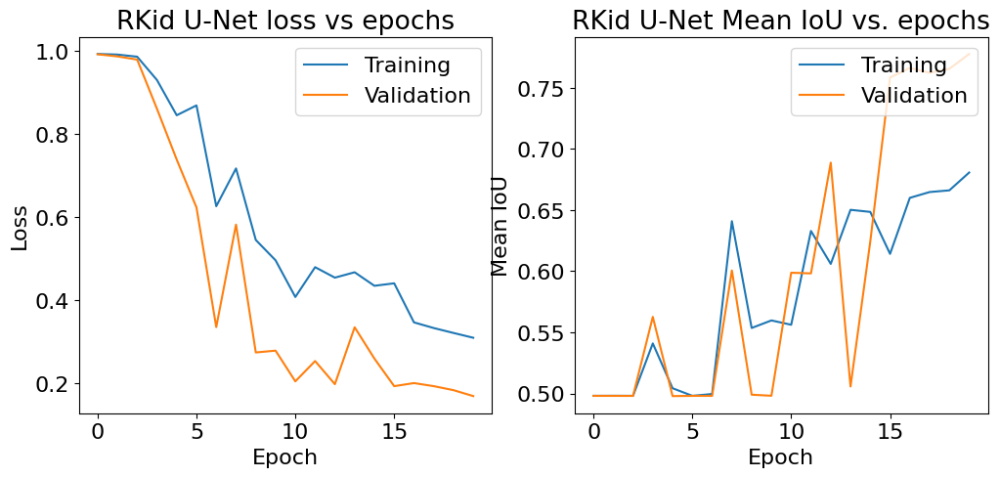

In [85]:
# Plot learning curves
plot_learning_curves(history, 'RKid U-Net')

In [ ]:
# Save model
model.save(os.path.join(modeling_path, 'MR_T2SPIR','t2_rkidney_unet.keras'))

1/1 [==============================] - 0s 160ms/step


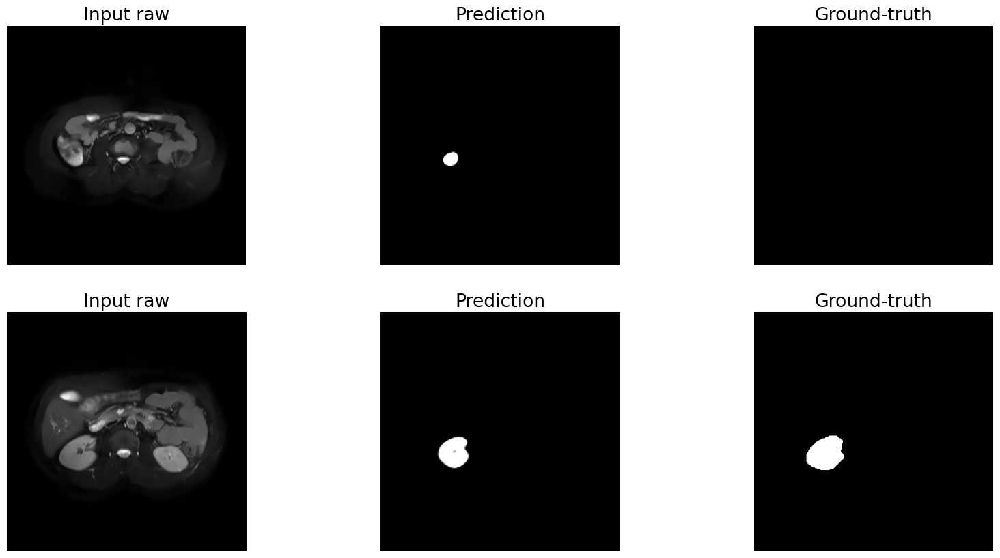

In [90]:
# Graph predictions on unseen data
preds = model.predict(t2_test.take(1))
for input, true in t2_test.take(1):
  images = [input[8], preds[8], true[8], input[15], preds[15], true[15]]
  titles = ['Input raw', 'Prediction', 'Ground-truth', 'Input raw', 'Prediction', 'Ground-truth']
  plot_image_processing_results(images, titles)
  break

1/1 [==============================] - 0s 103ms/step


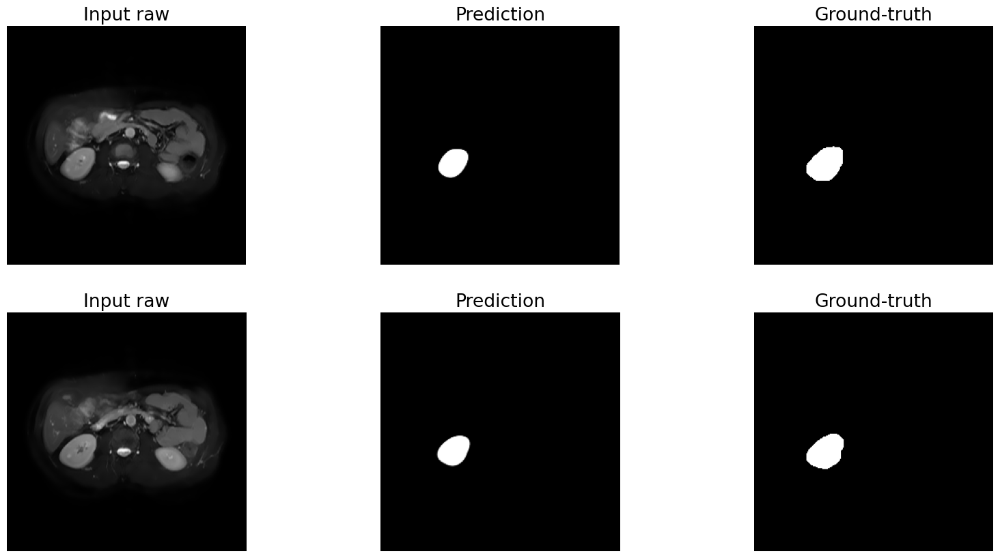

In [91]:
# Graph predictions on unseen data
preds = model.predict(t2_test.take(1))
for input, true in t2_test.take(1):
  images = [input[13], preds[13], true[13], input[14], preds[14], true[14]]
  titles = ['Input raw', 'Prediction', 'Ground-truth', 'Input raw', 'Prediction', 'Ground-truth']
  plot_image_processing_results(images, titles)
  break

In [92]:
model.evaluate(t2_test)

4/4 [==============================] - 1s 229ms/step - loss: 0.1707 - dice_coef: 0.8293 - ravd: 0.2603 - mean_io_u: 0.6805 - accuracy: 0.9985


[0.17069949209690094,
 0.8293005228042603,
 0.26028046011924744,
 0.6805275082588196,
 0.9984817504882812]

**Chosen model for right kidney segmentation (MR T2 SPIR images)**
- test DICE loss: 0.1707
- test RAVD: 0.2603
- test mean IoU: 0.6805
- test accuracy: 0.9985

###### **U-net LARGE LEFT KIDNEY**

In [96]:
# T2SPIR dataset with liver labels
t2_train = tf.data.Dataset.load(os.path.join(modeling_path, 'MR_T2SPIR', 'mr_t2spir_train'))
t2_train = t2_train.map(dataset_lkidney_labels).batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

t2_val = tf.data.Dataset.load(os.path.join(modeling_path, 'MR_T2SPIR', 'mr_t2spir_val'))
t2_val = t2_val.map(dataset_lkidney_labels).batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

t2_test = tf.data.Dataset.load(os.path.join(modeling_path, 'MR_T2SPIR', 'mr_t2spir_test'))
t2_test = t2_test.map(dataset_lkidney_labels).batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

In [108]:
# Create and compile the model
model = unetbig_model(INPUT_SHAPE)
model.compile(optimizer=tfk.optimizers.Adam(LEARNING_RATE),
              loss=LOSS,
              metrics=METRICS)

In [109]:
# Train the model
history = model.fit(
    t2_train,
    shuffle=True,
    epochs=EPOCHS,
    validation_data=t2_val,
    callbacks=CALLBACKS,
    verbose=1
)

Epoch 1/20
32/32 [==============================] - 35s 834ms/step - loss: 0.9924 - dice_coef: 0.0076 - ravd: inf - mean_io_u: 0.4980 - accuracy: 0.8578 - val_loss: 0.9928 - val_dice_coef: 0.0072 - val_ravd: 502.8592 - val_mean_io_u: 0.4982 - val_accuracy: 0.0560 - lr: 1.0000e-05
Epoch 2/20
32/32 [==============================] - 25s 792ms/step - loss: 0.9924 - dice_coef: 0.0076 - ravd: inf - mean_io_u: 0.4981 - accuracy: 0.0139 - val_loss: 0.9928 - val_dice_coef: 0.0072 - val_ravd: 503.3854 - val_mean_io_u: 0.4982 - val_accuracy: 0.6065 - lr: 1.0000e-05
Epoch 3/20
32/32 [==============================] - 25s 764ms/step - loss: 0.9923 - dice_coef: 0.0077 - ravd: inf - mean_io_u: 0.4981 - accuracy: 0.0077 - val_loss: 0.9927 - val_dice_coef: 0.0073 - val_ravd: 503.6749 - val_mean_io_u: 0.4982 - val_accuracy: 0.6378 - lr: 1.0000e-05
Epoch 4/20
32/32 [==============================] - 25s 774ms/step - loss: 0.9923 - dice_coef: 0.0077 - ravd: inf - mean_io_u: 0.4981 - accuracy: 0.0136 - va

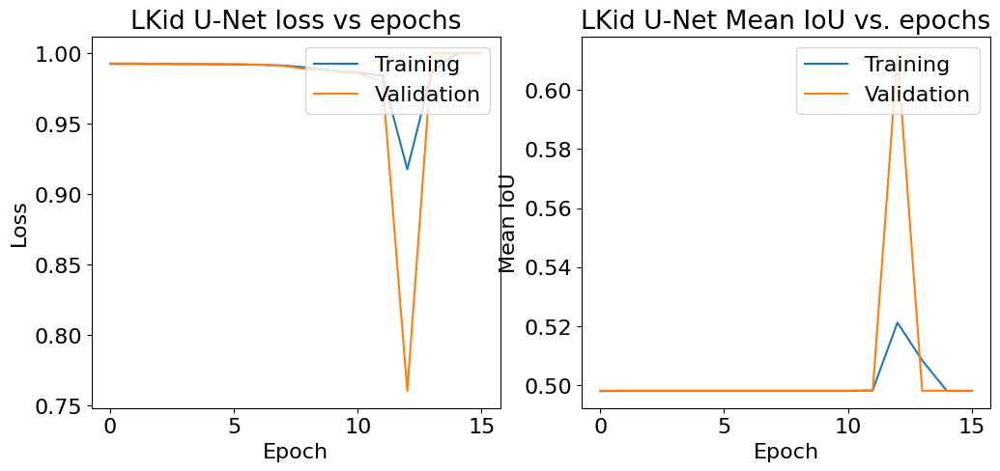

In [110]:
# Plot learning curves
plot_learning_curves(history, 'LKid U-Net')

In [ ]:
# Save model
model.save(os.path.join(modeling_path, 'MR_T2SPIR','t2_lkidney_unet.keras'))

1/1 [==============================] - 0s 324ms/step


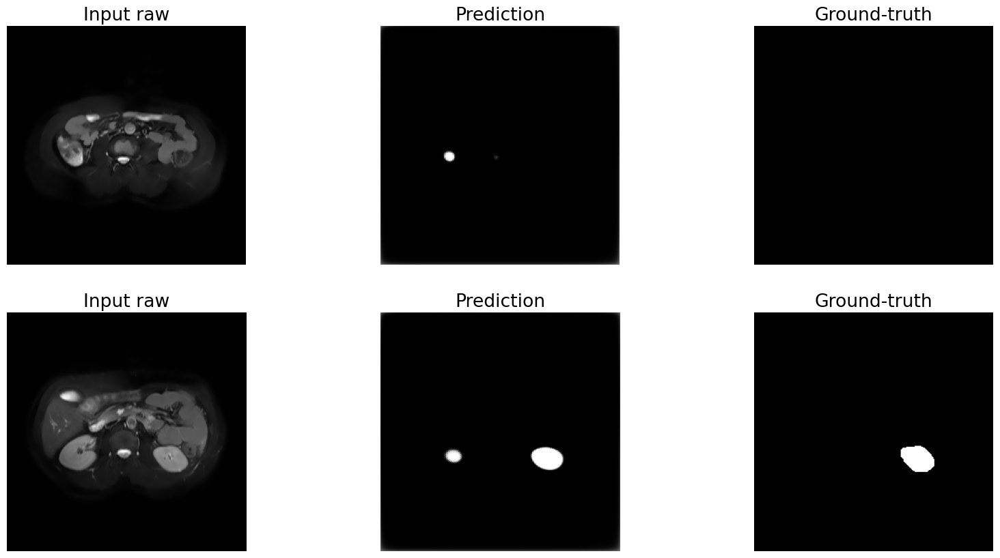

In [111]:
# Graph predictions on unseen data
preds = model.predict(t2_test.take(1))
for input, true in t2_test.take(1):
  images = [input[8], preds[8], true[8], input[15], preds[15], true[15]]
  titles = ['Input raw', 'Prediction', 'Ground-truth', 'Input raw', 'Prediction', 'Ground-truth']
  plot_image_processing_results(images, titles)
  break

1/1 [==============================] - 0s 156ms/step


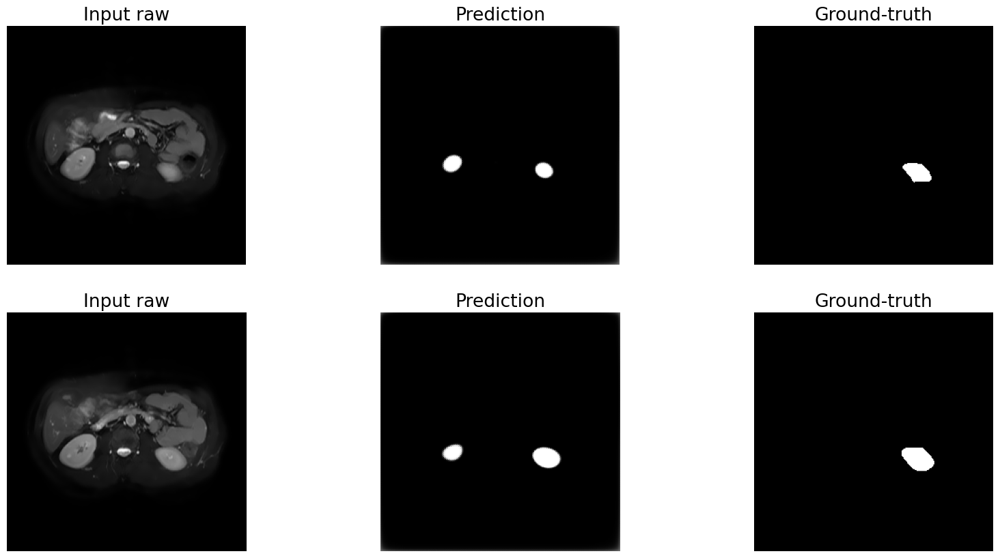

In [112]:
# Graph predictions on unseen data
preds = model.predict(t2_test.take(1))
for input, true in t2_test.take(1):
  images = [input[13], preds[13], true[13], input[14], preds[14], true[14]]
  titles = ['Input raw', 'Prediction', 'Ground-truth', 'Input raw', 'Prediction', 'Ground-truth']
  plot_image_processing_results(images, titles)
  break

In [113]:
model.evaluate(t2_test)

4/4 [==============================] - 1s 220ms/step - loss: 0.6706 - dice_coef: 0.3294 - ravd: 3.5970 - mean_io_u: 0.5993 - accuracy: 0.9924


[0.6705561280250549,
 0.32944390177726746,
 3.5969977378845215,
 0.5993249416351318,
 0.9923601150512695]

###### **U-net LARGE SPLEEN**

In [114]:
# T2SPIR dataset with spleen labels
t2_train = tf.data.Dataset.load(os.path.join(modeling_path, 'MR_T2SPIR', 'mr_t2spir_train'))
t2_train = t2_train.map(dataset_spleen_labels).batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

t2_val = tf.data.Dataset.load(os.path.join(modeling_path, 'MR_T2SPIR', 'mr_t2spir_val'))
t2_val = t2_val.map(dataset_spleen_labels).batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

t2_test = tf.data.Dataset.load(os.path.join(modeling_path, 'MR_T2SPIR', 'mr_t2spir_test'))
t2_test = t2_test.map(dataset_spleen_labels).batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

In [115]:
# Create and compile the model
model = unetbig_model(INPUT_SHAPE)
model.compile(optimizer=tfk.optimizers.Adam(LEARNING_RATE),
              loss=LOSS,
              metrics=METRICS)

In [116]:
# Train the model
history = model.fit(
    t2_train,
    #shuffle=True,
    epochs=EPOCHS,
    validation_data=t2_val,
    callbacks=CALLBACKS,
    verbose=1
)

Epoch 1/20
32/32 [==============================] - 39s 838ms/step - loss: 0.9878 - dice_coef: 0.0122 - ravd: inf - mean_io_u: 0.5090 - accuracy: 0.0062 - val_loss: 0.9906 - val_dice_coef: 0.0094 - val_ravd: inf - val_mean_io_u: 0.4977 - val_accuracy: 0.4078 - lr: 1.0000e-05
Epoch 2/20
32/32 [==============================] - 25s 788ms/step - loss: 0.9877 - dice_coef: 0.0123 - ravd: inf - mean_io_u: 0.4969 - accuracy: 0.0062 - val_loss: 0.9905 - val_dice_coef: 0.0095 - val_ravd: inf - val_mean_io_u: 0.4977 - val_accuracy: 0.6171 - lr: 1.0000e-05
Epoch 3/20
32/32 [==============================] - 24s 754ms/step - loss: 0.9876 - dice_coef: 0.0124 - ravd: inf - mean_io_u: 0.4969 - accuracy: 0.0062 - val_loss: 0.9904 - val_dice_coef: 0.0096 - val_ravd: inf - val_mean_io_u: 0.4977 - val_accuracy: 0.6313 - lr: 1.0000e-05
Epoch 4/20
32/32 [==============================] - 26s 805ms/step - loss: 0.9875 - dice_coef: 0.0125 - ravd: inf - mean_io_u: 0.4969 - accuracy: 0.0063 - val_loss: 0.9902 

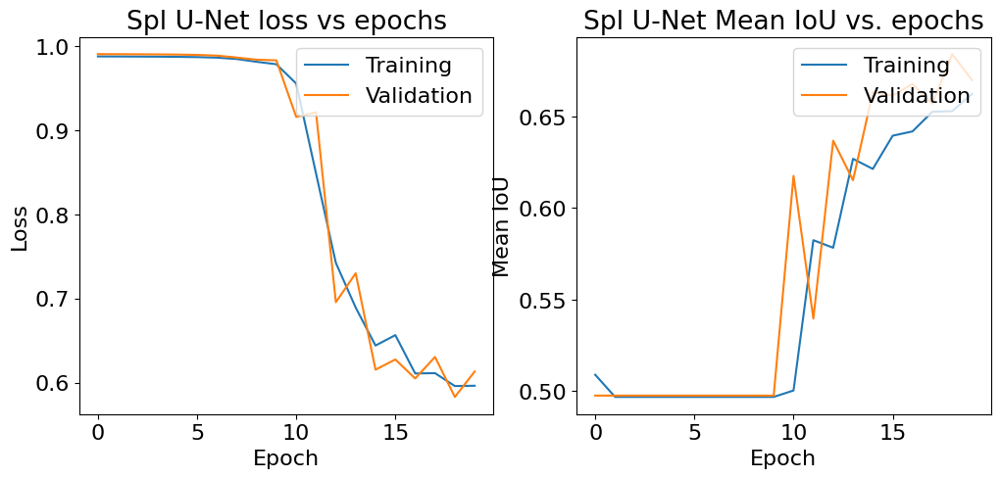

In [117]:
# Plot learning curves
plot_learning_curves(history, 'Spl U-Net')

In [ ]:
# Save model
model.save(os.path.join(modeling_path, 'MR_T2SPIR','t2_spleen_unet.keras'))

1/1 [==============================] - 0s 348ms/step


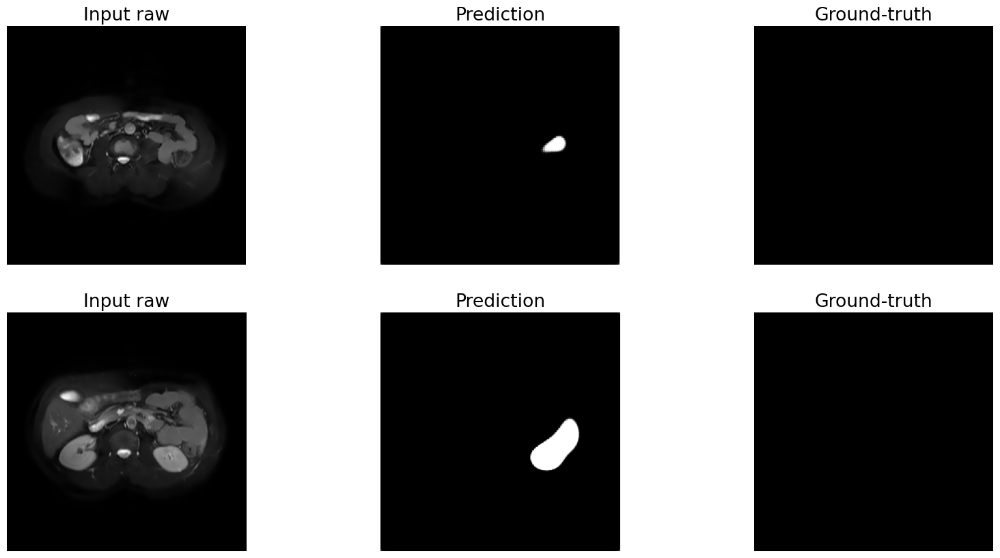

In [118]:
# Graph predictions on unseen data
preds = model.predict(t2_test.take(1))
for input, true in t2_test.take(1):
  images = [input[8], preds[8], true[8], input[15], preds[15], true[15]]
  titles = ['Input raw', 'Prediction', 'Ground-truth', 'Input raw', 'Prediction', 'Ground-truth']
  plot_image_processing_results(images, titles)
  break

1/1 [==============================] - 0s 149ms/step


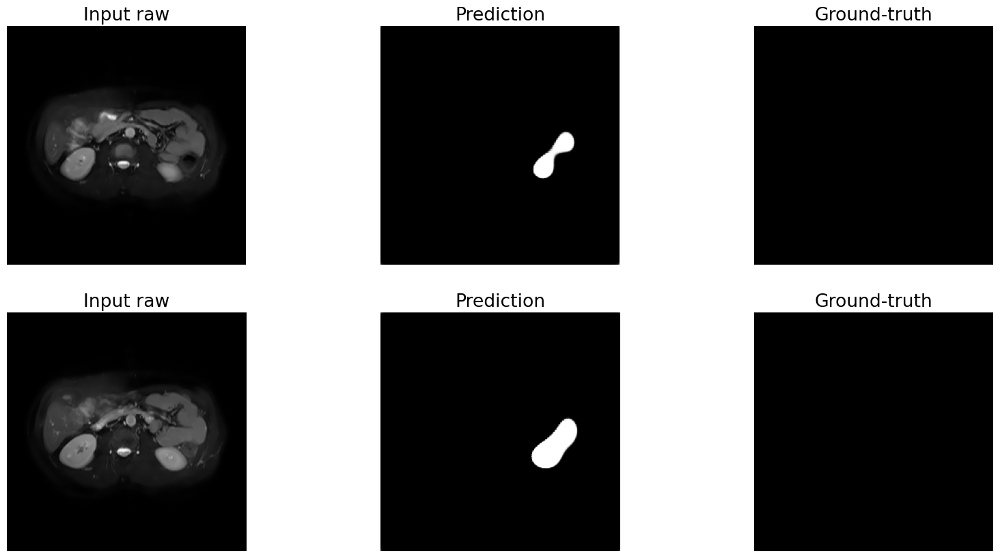

In [120]:
# Graph predictions on unseen data
preds = model.predict(t2_test.take(1))
for input, true in t2_test.take(1):
  images = [input[13], preds[13], true[13], input[14], preds[14], true[14]]
  titles = ['Input raw', 'Prediction', 'Ground-truth', 'Input raw', 'Prediction', 'Ground-truth']
  plot_image_processing_results(images, titles)
  break

In [121]:
model.evaluate(t2_test)

4/4 [==============================] - 1s 232ms/step - loss: 0.6307 - dice_coef: 0.3693 - ravd: inf - mean_io_u: 0.6960 - accuracy: 0.9907


[0.6306677460670471,
 0.3693322241306305,
 inf,
 0.6960431933403015,
 0.9906744956970215]

#### **Results**

Validation CT liver segmentation performance

| Architecture | CT Dataset | Parameters | DICE coef | RAVD (%) | Mean IoU | Accuracy (%) |
|----------|----------|----------| ----------| ----------| ----------| ----------|
| **Autoencoder**   | Raw   | 332,801   | 0.6544 | ? | 0.7118 | 96.39% |
| **Small U-net**   | Raw   | 573,249   | 0.7526 | ? | 0.8118 | 97.01% |
| **Large U-net**   | Raw   | 31'030,593   | 0.9306 | ? | 0.9328 | 99.27% |
| **Large U-net**   | Pre-processed  | 31'030,593   | 0.9306 | 4.16% | 0.9313 | 99.30% |
| **Trans U-net**   | Pre-processed   | 37'332,289   | 0.9470 | 2.04% | 0.9466 | 99.46% |

Validation MRI organ segmentation performance (joint prediction)

| Architecture | MR Dataset | Parameters | Liver DICE | R kidney DICE | L kidney DICE | Spleen DICE |
|----------|----------|----------| ----------| ----------| ----------| ----------|
| **Autoencoder**   | T1 in+out   | 5'496,741   | 0.5682 | 0.2525 | 0.3532 | 0.2752 |
| **Small U-net**   | T1 in+out   | 573,461   | 0.0 | 0.0116 | 0.0074 | 0.0073 |
| **Large U-net**   | T1 in+out   | 31'031,429   | 0.0 | 0.5 | 0.25 | 0.0075 |
| **Trans U-net**   | T1 in+out   | 37'333,125   | 0.0 | 0.5 | 0.25 | 0.0 |
| | | |  |  |  |  |
| **Autoencoder**   | T2 SPIR   | 5'496,453   | 0.4974 | 0.6849 | 0.5056 | 0.5167 |
| **Small U-net**   | T2 SPIR   | 573,317   | 0.3591 | 0.1024 | 0.0897 | 0.0986 |
| **Large U-net**   | T2 SPIR   | 31'030,853   | 0.3786 | 0.7951 | 0.0074 | 0.0094 |
| **Trans U-net**   | T2 SPIR   | 37'332,549   | 0.0 | 0.0076 | 0.0072 | 0.0 |

Validation MRI organ segmentation performance (single independent prediction)

| Architecture | MR Dataset | Parameters | Liver DICE | R kidney DICE | L kidney DICE | Spleen DICE |
|----------|----------|----------| ----------| ----------| ----------| ----------|
| **Large U-net**   | T1 in+out   | 31'030,593  | 0.5396 | 0.0156 | 0.0698 | 0.0185 |
| **Large U-net**   | T2 SPIR   | 31'030,593   | 0.5760 | 0.8301 | 0.2396 | 0.3867 |

Evaluating best models on test set

| Organ | Architecture | Dataset | Parameters | Test DICE coef |
|----------|----------|----------| ----------| ----------|
| **Liver**   | Trans U-net   | CT pre-proceessed | 37'332,289  | 0.963 |
| **Right kidney**   | Large U-net   | MR T2 SPIR | 31'030,593  | 0.8293 |
| **Left kidney**   | Autoencoder   | MR T2 SPIR | 5'496,453  | 0.6239 |
| **Spleen**   | Autoencoder   | MR T2 SPIR | 5'496,453  | 0.5167 |

### **BIBLIOGRAPHY**

>Kavur, A. E., Selver, M. A., Dicle, O., Barış, M., & Gezer, N. S. (2019, April).*CHAOS - Combined (CT-MR) Healthy Abdominal Organ Segmentation Challenge Data* (Version v1.03) [Data set] Zenodo. https://doi.org/10.5281/zenodo.3362844

> Masoudi, S., Harmon, S. A., Mehralivand, S., Walker, S. M., Raviprakash, H., Bagci, U., Choyke, P. L., & Turkbey, B. (2021). *Quick guide on radiology image pre-processing for deep learning applications in prostate cancer research*. J Med Imaging (Bellingham), 8(1), 010901. https://doi.org/10.1117/1.JMI.8.1.010901

> Merkle, E. & Nelson, R. (2019). *Dual Gradient-Echo In-Phase and OpposedPhase Hepatic MR Imaging: A Useful Tool for Evaluating More Than Fatty Infiltration or Fatty Sparing*. RadioGraphics, 26(5). https://doi.org/10.1148/rg.265055711

> Preston, D. (2006). *Magnetic Resonance Imaging (MRI) of the Brain and Spine: Basics*. Case Western Reserve University. https://case.edu/med/neurology/NR/MRI%20Basics.htm

> Sadia, R. T., Chen, J., & Zhang, J. (2024). *CT image denoising methods for image quality improvement and radiation dose reduction*. Journal of Applied Clinical Medical Physics. Advance online publication. https://doi.org/10.1002/acm2.14270

> Zee, C., Segall, H., Terk, M., Destian, S., Ahmadi, J., Gober, J., & Colletti, P. (1992). *SPIR MRI in spinal diseases*. Journal of Computer Assisted Tomography, 16(3), 356-360. https://doi.org/10.1097/00004728-199205000-00004